## **Gaia Querying**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.coordinates import SkyCoord
from astroquery.gaia import Gaia
import erfa
import astropy.units as u
from astropy.table import Table
from astropy.time import Time
from astroquery.gaia import Gaia
import pandas as pd
import pyvo

In [2]:
from astroquery.gaia import Gaia

Gaia.MAIN_GAIA_TABLE = "gaiadr3.gaia_source"

In [3]:
#Center from Flaccomio paper, degree box query not the same
#Flac center query does not hold the north and south regions we have


#Field Query

coord = SkyCoord(ra=100.25, dec=9.7, unit=(u.degree, u.degree), frame='icrs')
width = u.Quantity(0.6, u.deg) 
height = u.Quantity(0.6, u.deg)
Gaia.ROW_LIMIT = -1

job = Gaia.launch_job_async(f"""
    SELECT * 
    FROM gaiadr3.gaia_source 
    WHERE 1=CONTAINS(
        POINT('ICRS', ra, dec), 
        BOX('ICRS', {coord.ra.degree}, {coord.dec.degree}, {width.to(u.deg).value}, {height.to(u.deg).value})
    )
""")

df = job.get_results().to_pandas()

df['distance_pc'] = 1000 / df['parallax']
df

INFO: Query finished. [astroquery.utils.tap.core]


,solution_id,DESIGNATION,SOURCE_ID,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,azero_gspphot_lower,azero_gspphot_upper,ag_gspphot,ag_gspphot_lower,ag_gspphot_upper,ebpminrp_gspphot,ebpminrp_gspphot_lower,ebpminrp_gspphot_upper,libname_gspphot,distance_pc
0,1636148068921376768,Gaia DR3 3326903657716387456,3326903657716387456,1175750220,2016.0,99.950160,0.047994,9.812622,0.047601,1.284234,...,2.0165,2.2347,1.5769,1.5044,1.6795,0.8624,0.8229,0.9164,PHOENIX,778.674394
1,1636148068921376768,Gaia DR3 3326908541094660480,3326908541094660480,30735314,2016.0,99.950335,0.061889,9.936530,0.060751,0.203585,...,4.2802,4.3492,3.0914,3.0631,3.1214,1.7201,1.7027,1.7385,MARCS,4911.950273
2,1636148068921376768,Gaia DR3 3326704508672903808,3326704508672903808,1293203821,2016.0,99.950418,0.157100,9.545699,0.144959,0.819723,...,0.8225,1.0060,0.6228,0.5667,0.6957,0.3410,0.3109,0.3799,PHOENIX,1219.924654
3,1636148068921376768,Gaia DR3 3326607201894002304,3326607201894002304,858477205,2016.0,99.950609,0.187775,9.472020,0.168627,0.340178,...,0.9242,1.0493,0.6719,0.6316,0.7189,0.3705,0.3491,0.3957,PHOENIX,2939.633750
4,1636148068921376768,Gaia DR3 3326895720620930048,3326895720620930048,488316079,2016.0,99.950610,2.123999,9.689537,2.324414,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6608,1636148068921376768,Gaia DR3 3326717569668709504,3326717569668709504,1151771703,2016.0,100.549815,0.209627,9.603478,0.203529,0.253312,...,0.0055,0.0585,0.0167,0.0039,0.0418,0.0090,0.0021,0.0225,PHOENIX,3947.695027
6609,1636148068921376768,Gaia DR3 3326646857327161728,3326646857327161728,1374673370,2016.0,100.549906,0.243216,9.557453,0.237837,3.031327,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,329.888522
6610,1636148068921376768,Gaia DR3 3326719626956004480,3326719626956004480,1334662219,2016.0,100.549928,0.268468,9.722505,0.267283,0.097696,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,10235.827327
6611,1636148068921376768,Gaia DR3 3326726327108126720,3326726327108126720,1321263194,2016.0,100.549969,0.149018,9.889077,0.134203,0.747728,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,1337.384479


In [4]:
t1 = Time('J2016')
t2 = Time('J2000')

def propagate_epoch(row):
    try:
        ra1 = (row['ra'] * u.deg).to(u.rad).value
        dec1 = (row['dec'] * u.deg).to(u.rad).value
        pmd1 = (row['pmdec'] * u.mas/u.yr).to(u.rad/u.yr).value
        px1 = (row['parallax'] * u.mas).to(u.arcsec).value

        # Some stars may have NaN for radial_velocity
        rv1 = row['radial_velocity'] if not np.isnan(row['radial_velocity']) else 0.0

        
        ra2, dec2, _, _, _, _ = erfa.pmsafe(
            ra1, dec1, pmd1, pmd1, px1, rv1, 
            t1.jd1, t1.jd2, t2.jd1, t2.jd2
        )

        # Convert back to degrees
        return np.degrees(ra2), np.degrees(dec2)
    
    except Exception as e:
        print(f"Error with propagation: {e}")
        return np.nan, np.nan

# Drop rows with NaNs 
df_clean = df.dropna(subset=['ra', 'dec', 'pmra', 'pmdec', 'parallax', 'radial_velocity'])


propagated_coords = df_clean.apply(propagate_epoch, axis=1)

df_clean[['ra_epoch2000', 'dec_epoch2000']] = pd.DataFrame(propagated_coords.tolist(), index=df_clean.index)


df[['ra_epoch2000', 'dec_epoch2000']] = df_clean[['ra_epoch2000', 'dec_epoch2000']]

/var/folders/ct/3p6ngzhj6xbcrqtyd_rkdsn00000gn/T/ipykernel_10615/787662586.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean[['ra_epoch2000', 'dec_epoch2000']] = pd.DataFrame(propagated_coords.tolist(), index=df_clean.index)
/var/folders/ct/3p6ngzhj6xbcrqtyd_rkdsn00000gn/T/ipykernel_10615/787662586.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean[['ra_epoch2000', 'dec_epoch2000']] = pd.DataFrame(propagated_coords.tolist(), index=df_clean.index)


In [5]:
#North
#100.175, 9.75
coord = SkyCoord(ra=100.22, dec=9.88, unit=(u.degree, u.degree), frame='icrs')
width = u.Quantity(0.33, u.deg) 
height = u.Quantity(0.33, u.deg)
Gaia.ROW_LIMIT = -1

job = Gaia.launch_job_async(f"""
    SELECT * 
    FROM gaiadr3.gaia_source 
    WHERE 1=CONTAINS(
        POINT('ICRS', ra, dec), 
        BOX('ICRS', {coord.ra.degree}, {coord.dec.degree}, {width.to(u.deg).value}, {height.to(u.deg).value})
    )
""")

df_north = job.get_results().to_pandas()

df_north['distance_pc'] = 1000 / df_north['parallax']

df_north



INFO: Query finished. [astroquery.utils.tap.core]


,solution_id,DESIGNATION,SOURCE_ID,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,azero_gspphot_lower,azero_gspphot_upper,ag_gspphot,ag_gspphot_lower,ag_gspphot_upper,ebpminrp_gspphot,ebpminrp_gspphot_lower,ebpminrp_gspphot_upper,libname_gspphot,distance_pc
0,1636148068921376768,Gaia DR3 3326934237883861888,3326934237883861888,1606282287,2016.0,100.055003,0.074505,10.024024,0.064386,1.268070,...,1.6667,1.7913,1.2970,1.2442,1.3432,0.7037,0.6754,0.7285,PHOENIX,788.599809
1,1636148068921376768,Gaia DR3 3326714576076372608,3326714576076372608,88996988,2016.0,100.055275,0.186979,9.741760,0.165624,0.127222,...,3.1380,3.2981,2.1188,2.0659,2.1764,1.1760,1.1477,1.2068,PHOENIX,7860.294398
2,1636148068921376768,Gaia DR3 3326903146615950720,3326903146615950720,1563125757,2016.0,100.055570,0.073244,9.822273,0.066847,0.319958,...,7.0103,7.1304,5.1867,5.1059,5.2263,2.9316,2.8797,2.9542,A,3125.410750
3,1636148068921376768,Gaia DR3 3326902455125913472,3326902455125913472,1114078033,2016.0,100.055580,0.312075,9.785152,0.290649,-0.214417,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,-4663.806739
4,1636148068921376768,Gaia DR3 3326903142324954752,3326903142324954752,611814684,2016.0,100.055598,0.480717,9.820087,0.460954,0.287241,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,3481.396623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1779,1636148068921376768,Gaia DR3 3326741960786277760,3326741960786277760,294107692,2016.0,100.383936,0.213531,9.927995,0.198515,0.958752,...,1.4207,1.6326,1.0425,0.9644,1.1114,0.5724,0.5315,0.6107,PHOENIX,1043.022463
1780,1636148068921376768,Gaia DR3 3326735368012841856,3326735368012841856,765591902,2016.0,100.384217,2.087114,9.782141,1.854332,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN
1781,1636148068921376768,Gaia DR3 3326723410821847680,3326723410821847680,438385238,2016.0,100.384290,0.365663,9.743324,0.355966,0.240120,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,4164.590577
1782,1636148068921376768,Gaia DR3 3326735363718448512,3326735363718448512,107661839,2016.0,100.384894,16.702358,9.785569,16.275036,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN


In [6]:
#correcting epoch N
t1 = Time('J2016')
t2 = Time('J2000')

def propagate_epoch(row):
    try:
        ra1 = (row['ra'] * u.deg).to(u.rad).value
        dec1 = (row['dec'] * u.deg).to(u.rad).value
        pmd1 = (row['pmdec'] * u.mas/u.yr).to(u.rad/u.yr).value
        px1 = (row['parallax'] * u.mas).to(u.arcsec).value

        rv1 = row['radial_velocity'] if not np.isnan(row['radial_velocity']) else 0.0

        ra2, dec2, _, _, _, _ = erfa.pmsafe(
            ra1, dec1, pmd1, pmd1, px1, rv1, 
            t1.jd1, t1.jd2, t2.jd1, t2.jd2
        )

        return np.degrees(ra2), np.degrees(dec2)
    
    except Exception as e:
        print(f"Error with propagation: {e}")
        return np.nan, np.nan

df_cleanN = df_north.dropna(subset=['ra', 'dec', 'pmra', 'pmdec', 'parallax', 'radial_velocity'])

propagated_coordsN = df_cleanN.apply(propagate_epoch, axis=1)

propagated_coords_df = pd.DataFrame(propagated_coordsN.tolist(), columns=['ra_epoch2000', 'dec_epoch2000'], index=df_cleanN.index)

df_north.loc[propagated_coords_df.index, ['ra_epoch2000', 'dec_epoch2000']] = propagated_coords_df


In [7]:
#South - Cone Nebula Region
#I used Naibi's region coords and 20''x20'' query,, these did not seem
#to be in the right section? looking into this

coord = SkyCoord(ra=100.27, dec=9.50, unit=(u.degree, u.degree), frame='icrs')
width = u.Quantity(0.3, u.deg) 
height = u.Quantity(0.3, u.deg)
Gaia.ROW_LIMIT = -1

job = Gaia.launch_job_async(f"""
    SELECT * 
    FROM gaiadr3.gaia_source 
    WHERE 1=CONTAINS(
        POINT('ICRS', ra, dec), 
        BOX('ICRS', {coord.ra.degree}, {coord.dec.degree}, {width.to(u.deg).value}, {height.to(u.deg).value})
    )
""")

df_south = job.get_results().to_pandas()

df_south['distance_pc'] = 1000 / df_south['parallax']

df_south

INFO: Query finished. [astroquery.utils.tap.core]


,solution_id,DESIGNATION,SOURCE_ID,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,azero_gspphot_lower,azero_gspphot_upper,ag_gspphot,ag_gspphot_lower,ag_gspphot_upper,ebpminrp_gspphot,ebpminrp_gspphot_lower,ebpminrp_gspphot_upper,libname_gspphot,distance_pc
0,1636148068921376768,Gaia DR3 3326690425475108736,3326690425475108736,335519747,2016.0,100.120061,0.019539,9.517223,0.017324,1.393485,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,717.625002
1,1636148068921376768,Gaia DR3 3326702378369127296,3326702378369127296,987327519,2016.0,100.120239,0.052209,9.551530,0.048047,1.341891,...,0.8262,0.8613,0.5595,0.5476,0.5711,0.3462,0.3393,0.3530,MARCS,745.216866
2,1636148068921376768,Gaia DR3 3326686985206399488,3326686985206399488,361347333,2016.0,100.120707,0.442187,9.398192,0.438273,0.330848,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,3022.537902
3,1636148068921376768,Gaia DR3 3326686813407706880,3326686813407706880,209684858,2016.0,100.120965,0.627043,9.385974,0.658619,-0.033508,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,-29843.851265
4,1636148068921376768,Gaia DR3 3326688668833587328,3326688668833587328,1779748747,2016.0,100.121542,0.340792,9.491550,0.315623,2.337507,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,427.806224
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1161,1636148068921376768,Gaia DR3 3326643936747953664,3326643936747953664,452672649,2016.0,100.418473,0.141498,9.423429,0.129982,0.772705,...,3.1255,3.2806,2.1201,2.0681,2.1769,1.1776,1.1517,1.2074,PHOENIX,1294.154696
1162,1636148068921376768,Gaia DR3 3326698323919520768,3326698323919520768,60904995,2016.0,100.419406,0.128704,9.640021,0.139037,0.045152,...,3.1691,3.3927,2.3032,2.1980,2.3733,1.2725,1.2141,1.3128,PHOENIX,22147.594156
1163,1636148068921376768,Gaia DR3 3326694892241417728,3326694892241417728,339992292,2016.0,100.419423,0.205226,9.599502,0.213043,1.147821,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,871.216114
1164,1636148068921376768,Gaia DR3 3326644001173385216,3326644001173385216,1148334362,2016.0,100.419561,1.394126,9.435609,1.198094,0.140433,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,7120.845543


In [8]:
#correcting epoch S
t1 = Time('J2016')
t2 = Time('J2000')

def propagate_epoch(row):
    try:
        ra1 = (row['ra'] * u.deg).to(u.rad).value
        dec1 = (row['dec'] * u.deg).to(u.rad).value
        pmd1 = (row['pmdec'] * u.mas/u.yr).to(u.rad/u.yr).value
        px1 = (row['parallax'] * u.mas).to(u.arcsec).value

        rv1 = row['radial_velocity'] if not np.isnan(row['radial_velocity']) else 0.0

        ra2, dec2, _, _, _, _ = erfa.pmsafe(
            ra1, dec1, pmd1, pmd1, px1, rv1, 
            t1.jd1, t1.jd2, t2.jd1, t2.jd2
        )

        return np.degrees(ra2), np.degrees(dec2)
    
    except Exception as e:
        print(f"Error with propagation: {e}")
        return np.nan, np.nan

df_cleanS = df_south.dropna(subset=['ra', 'dec', 'pmra', 'pmdec', 'parallax', 'radial_velocity'])

propagated_coordsS = df_cleanS.apply(propagate_epoch, axis=1)

propagated_coords_df = pd.DataFrame(propagated_coordsS.tolist(), columns=['ra_epoch2000', 'dec_epoch2000'], index=df_cleanS.index)

df_south.loc[propagated_coords_df.index, ['ra_epoch2000', 'dec_epoch2000']] = propagated_coords_df


In [9]:
# import zero point correction from Lindegren et al. 2021
#%pip install gaiadr3-zeropoint
#from zero_point import zpt

#zpt.load_tables()


#df = df[df['astrometric_params_solved'].isin([31, 95])].copy()  


#df = df[(df['pseudocolour'] >= 1.24) & (df['pseudocolour'] <= 1.72)].copy()

#zp_gaia_doc = zpt.get_zpt(
    #df['phot_g_mean_mag'], 
    #df['nu_eff_used_in_astrometry'], 
    #df['pseudocolour'], 
    #df['ecl_lat'], 
    #df['astrometric_params_solved']
#)


#df.loc[:, 'corrected_parallax'] = df['parallax'] - zp_gaia_doc
#df

In [10]:
# import zero point correction from Lindegren et al. 2021

# from zero_point import zpt

# zpt.load_tables()


# df_north = df_north[df_north['astrometric_params_solved'].isin([31, 95])].copy()  


# df_north = df_north[(df_north['pseudocolour'] >= 1.24) & (df_north['pseudocolour'] <= 1.72)].copy()

# zp_gaia_doc = zpt.get_zpt(
#     df_north['phot_g_mean_mag'], 
#     df_north['nu_eff_used_in_astrometry'], 
#     df_north['pseudocolour'], 
#     df_north['ecl_lat'], 
#     df_north['astrometric_params_solved']
# )


# df_north.loc[:, 'corrected_parallax'] = df_north['parallax'] - zp_gaia_doc
# df_north

In [11]:
# import zero point correction from Lindegren et al. 2021

# from zero_point import zpt

# zpt.load_tables()


# df_south = df_south[df_south['astrometric_params_solved'].isin([31, 95])].copy()  


# df_south = df_south[(df_south['pseudocolour'] >= 1.24) & (df_south['pseudocolour'] <= 1.72)].copy()

# zp_gaia_doc = zpt.get_zpt(
#     df_south['phot_g_mean_mag'], 
#     df_south['nu_eff_used_in_astrometry'], 
#     df_south['pseudocolour'], 
#     df_south['ecl_lat'], 
#     df_south['astrometric_params_solved']
# )


# df_south.loc[:, 'corrected_parallax'] = df_south['parallax'] - zp_gaia_doc
# df_south

## **DSS Image**

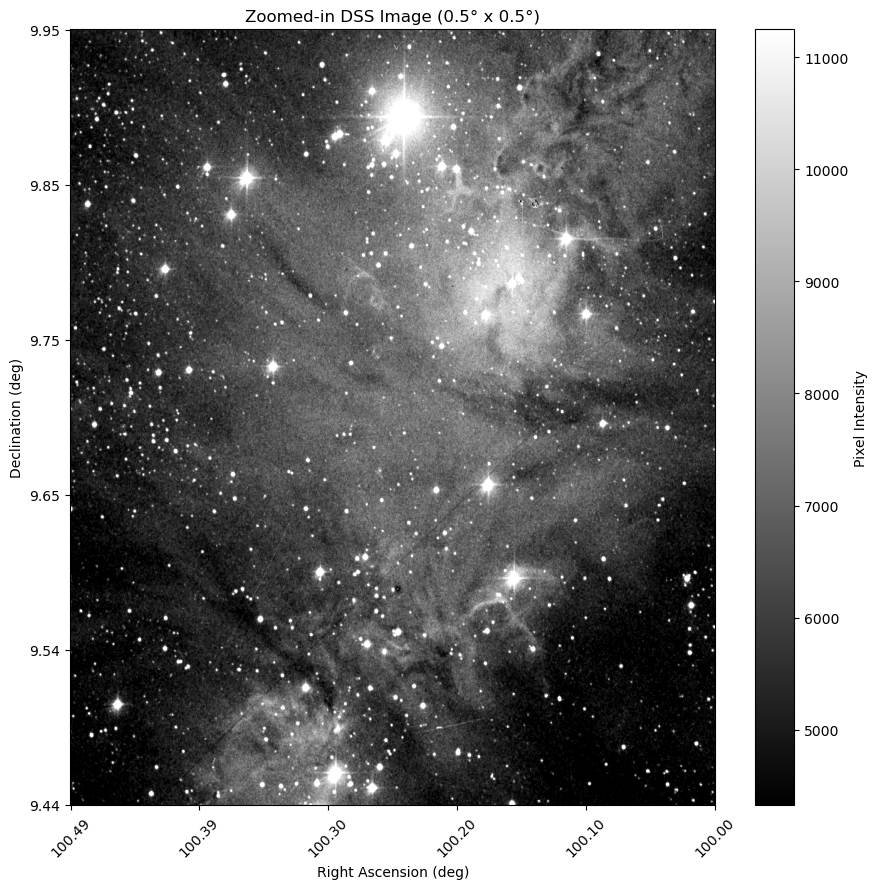

In [138]:
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt

fits_file = 'dss1.06.40.52.1+09.52.37.2.fits'

# Open FITS and standardize DATE-OBS if necessary
with fits.open(fits_file, mode='update') as hdul:
    hdr = hdul[0].header
    if 'DATE-OBS' in hdr and '/' in hdr['DATE-OBS']:
        d, m, y = hdr['DATE-OBS'].split('/')
        hdr['DATE-OBS'] = f"{'20' if int(y) < 50 else '19'}{y}-{m}-{d}"
    hdul.flush()

wcs = WCS(hdr)

# Load image
with fits.open(fits_file) as hdul:
    image_data = hdul[0].data

# Define center coordinate and half size
center_ra, center_dec = 100.25, 9.7
half_deg = 0.25

# Define SkyCoord for center and edges
center_coord = SkyCoord(ra=center_ra, dec=center_dec, unit='deg')
corner1 = SkyCoord(ra=center_ra - half_deg, dec=center_dec - half_deg, unit='deg')
corner2 = SkyCoord(ra=center_ra + half_deg, dec=center_dec + half_deg, unit='deg')

# Convert to pixel coordinates
x1, y1 = wcs.world_to_pixel(corner1)
x2, y2 = wcs.world_to_pixel(corner2)

# Round and clip to valid image bounds
x1, x2 = int(np.floor(min(x1, x2))), int(np.ceil(max(x1, x2)))
y1, y2 = int(np.floor(min(y1, y2))), int(np.ceil(max(y1, y2)))

x1, x2 = np.clip([x1, x2], 0, image_data.shape[1] - 1)
y1, y2 = np.clip([y1, y2], 0, image_data.shape[0] - 1)

# Crop the image
cutout = image_data[y1:y2, x1:x2]

# Convert pixel grid to world coords for manual axis labeling
yy, xx = np.mgrid[y1:y2, x1:x2]
world = wcs.pixel_to_world(xx, yy)
ra_vals = world.ra.deg
dec_vals = world.dec.deg

# Plot
plt.figure(figsize=(9, 9))
plt.imshow(cutout, cmap='gray', origin='lower', aspect='auto', vmin=np.percentile(cutout, 5), vmax=np.percentile(cutout, 99))

# Set axis ticks
n_ticks = 6
xticks_pix = np.linspace(0, cutout.shape[1]-1, n_ticks).astype(int)
yticks_pix = np.linspace(0, cutout.shape[0]-1, n_ticks).astype(int)
xtick_labels = [f"{ra_vals[0, x]:.2f}" for x in xticks_pix]
ytick_labels = [f"{dec_vals[y, 0]:.2f}" for y in yticks_pix]

plt.xticks(xticks_pix, xtick_labels, rotation=45)
plt.yticks(yticks_pix, ytick_labels)

plt.xlabel("Right Ascension (deg)")
plt.ylabel("Declination (deg)")

plt.title("Zoomed-in DSS Image (0.5° x 0.6°)")
plt.colorbar(label='Pixel Intensity')
plt.tight_layout()
plt.savefig('zoomed_fits_cutout.png', dpi=300, bbox_inches='tight')

plt.show()



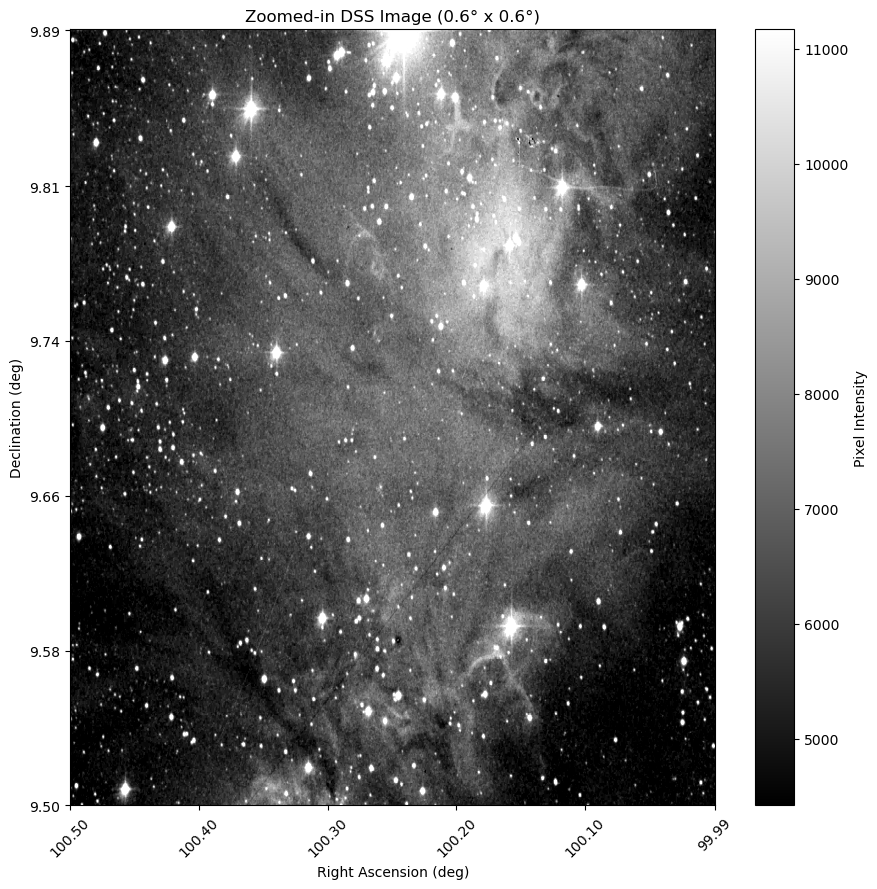

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u

fits_file = 'dss1.06.40.52.1+09.52.37.2.fits'

# --- Standardize DATE-OBS ---
with fits.open(fits_file, mode='update') as hdul:
    hdr = hdul[0].header
    if 'DATE-OBS' in hdr and '/' in hdr['DATE-OBS']:
        d, m, y = hdr['DATE-OBS'].split('/')
        hdr['DATE-OBS'] = f"{'20' if int(y) < 50 else '19'}{y}-{m}-{d}"
    hdul.flush()
    wcs = WCS(hdul[0].header)
    image_data = hdul[0].data

# Define desired sky range
ra_min, ra_max = 100.0, 100.5  # reverse direction on plot
dec_min, dec_max = 9.5, 9.9

# Convert corners to pixel coordinates
corner1 = SkyCoord(ra=ra_max, dec=dec_min, unit='deg')  # bottom-left
corner2 = SkyCoord(ra=ra_min, dec=dec_max, unit='deg')  # top-right
x1, y1 = wcs.world_to_pixel(corner1)
x2, y2 = wcs.world_to_pixel(corner2)

# Round to int and clip
x1, x2 = int(np.floor(min(x1, x2))), int(np.ceil(max(x1, x2)))
y1, y2 = int(np.floor(min(y1, y2))), int(np.ceil(max(y1, y2)))

x1, x2 = np.clip([x1, x2], 0, image_data.shape[1] - 1)
y1, y2 = np.clip([y1, y2], 0, image_data.shape[0] - 1)

# Crop
cutout = image_data[y1:y2, x1:x2]

# Convert pixel grid to RA/DEC for tick labels
yy, xx = np.mgrid[y1:y2, x1:x2]
world = wcs.pixel_to_world(xx, yy)
ra_vals = world.ra.deg
dec_vals = world.dec.deg

# Plot with manual RA/DEC limits
plt.figure(figsize=(9, 9))
plt.imshow(cutout, cmap='gray', origin='lower', aspect='auto',
           vmin=np.percentile(cutout, 5), vmax=np.percentile(cutout, 99))

# Set axis ticks
n_ticks = 6
xticks_pix = np.linspace(0, cutout.shape[1]-1, n_ticks).astype(int)
yticks_pix = np.linspace(0, cutout.shape[0]-1, n_ticks).astype(int)
xtick_labels = [f"{ra_vals[0, x]:.2f}" for x in xticks_pix]
ytick_labels = [f"{dec_vals[y, 0]:.2f}" for y in yticks_pix]

plt.xticks(xticks_pix, xtick_labels, rotation=45)
plt.yticks(yticks_pix, ytick_labels)

plt.xlabel("Right Ascension (deg)")
plt.ylabel("Declination (deg)")
plt.title("Zoomed-in DSS Image (0.6° x 0.6°)")

# Manually set sky limits (backwards RA for sky)
plt.xlim(cutout.shape[1], 0)
plt.ylim(0, cutout.shape[0])
plt.gca().invert_xaxis()
plt.colorbar(label="Pixel Intensity")
plt.tight_layout()
plt.savefig("dss_fixed_sky_region.png", dpi=300)
plt.show()


## **Spitzer**

In [ ]:
from astropy.table import Table
import pandas as pd

# Load MRT table
table = Table.read('/Users/zeinakellybenton/!!!!!new-research/aj306456t1_mrt.txt', format='ascii.mrt')


table.show_in_notebook()

#df_mrt = table.to_pandas()

#df_mrt.head()


         interactive tables it is recommended to use dedicated tools like:
         - https://github.com/bloomberg/ipydatagrid
         - https://docs.bokeh.org/en/latest/docs/user_guide/interaction/widgets.html#datatable
         - https://dash.plotly.com/datatable [warnings]


idx,Num,RAh,RAm,RAs,DEd,DEm,DEs,3.6mag,4.5mag,5.8mag,8.0mag,24mag,e_3.6mag,e_4.5mag,e_5.8mag,e_8.0mag,e_24mag,o_3.6mag,o_4.5mag,o_5.8mag,o_8.0mag,o_24mag,Dup,Mem,2MASS,Sung
,,h,min,s,deg,arcmin,arcsec,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,,,,,,,,,
0,1,6,39,41.36,9,11,28.5,--,15.208,--,--,--,--,0.053,--,--,--,0,2,0,0,0,--,--,06394137+0911286,C3992
1,2,6,39,41.44,9,9,16.0,--,12.988,--,--,--,--,0.11,--,--,--,0,2,0,0,0,--,--,06394144+0909160,C4027
2,3,6,39,41.57,9,12,26.9,--,15.313,--,--,--,--,0.115,--,--,--,0,2,0,0,0,--,--,06394158+0912266,C4104
3,4,6,39,41.83,9,16,12.8,15.643,15.469,--,--,--,0.219,0.291,--,--,--,1,1,0,0,0,--,--,--,C4248
4,5,6,39,41.87,9,18,4.3,12.911,12.868,--,--,--,0.074,0.069,--,--,--,2,2,0,0,0,--,--,06394188+0918044,C4271
5,6,6,39,41.9,9,13,1.5,--,13.667,--,--,--,--,0.073,--,--,--,0,2,0,0,0,--,--,06394191+0913014,C4280
6,7,6,39,42.09,9,11,46.9,--,14.108,--,--,--,--,0.004,--,--,--,0,2,0,0,0,--,--,06394208+0911469,C4365
7,8,6,39,42.15,9,18,39.3,14.785,14.872,--,--,--,0.163,0.181,--,--,--,1,1,0,0,0,--,--,06394214+0918394,C4403
8,9,6,39,42.3,9,16,5.0,16.139,15.943,--,--,--,0.296,0.403,--,--,--,1,1,0,0,0,D,--,--,C4486 +C4487


## **Bootleg Uncertainty/2MASS Query**

In [15]:
### FIELD ####

#Sophie's findings for organizing parallax for clouds past 500 pc
#para to dist


#DF Removed parallax outliers


def weighted_median(values, weights):
    """
    Calculate the weighted median of a set of values with corresponding weights.
    
    Parameters:
    - values: array of values (e.g., parallax values)
    - weights: array of weights for each value (e.g., inverse of parallax errors squared)
    
    Returns:
    - Weighted median value
    """
    # Sort the values and the weights by values
    sorted_indices = np.argsort(values)
    sorted_values = np.array(values)[sorted_indices]
    sorted_weights = np.array(weights)[sorted_indices]
    
    # Normalize the weights
    cumulative_weights = np.cumsum(sorted_weights)
    total_weight = cumulative_weights[-1]
    
    # Find the weighted median
    median_weight = total_weight / 2.0
    median_index = np.searchsorted(cumulative_weights, median_weight)
    
    return sorted_values[median_index]


df_clean = df.dropna(subset=['parallax', 'parallax_error']).copy()  # Make a copy here

# 2. Calculate distance (pc) using the formula: distance (pc) = 1 / parallax
df_clean.loc[:, 'distance_pc'] = 1000 / df_clean['parallax']

# 3. Calculate weights: inverse of parallax_error^2
df_clean.loc[:, 'weight'] = 1 / df_clean['parallax_error']**2

# 4. Calculate the weighted median of parallax using the correct alignment
parallax_values = df_clean['parallax'].values
weights = df_clean['weight'].values

weighted_parallax_median = weighted_median(parallax_values, weights)
print(f"Weighted Parallax Median: {weighted_parallax_median}")

# 5. Bootstrap Sampling (for uncertainty estimation)
bootstrap_samples = 1000
bootstrap_medians = []

for _ in range(bootstrap_samples):
    # Random sample with replacement
    sample_df = df_clean.sample(n=len(df_clean), replace=True)
    sample_parallax = sample_df['parallax'].values
    sample_weight = sample_df['weight'].values
    
    # Calculate weighted median for this bootstrap sample
    bootstrap_medians.append(weighted_median(sample_parallax, sample_weight))

# 6. Calculate the uncertainty (standard deviation of the bootstrap medians)
bootstrap_uncertainty = np.std(bootstrap_medians)
print(f"Bootstrap uncertainty: {bootstrap_uncertainty}")

# 7. Add in quadrature the systematic uncertainty (for example, 0.03 mas)
systematic_uncertainty = 0.04  # in mas
total_uncertainty = np.sqrt(bootstrap_uncertainty**2 + systematic_uncertainty**2)
print(f"Total uncertainty: {total_uncertainty}")

# 8. Remove sources more than 3σ from the weighted median
df_clean.loc[:, 'parallax_diff'] = np.abs(df_clean['parallax'] - weighted_parallax_median)
df_clean_no_outliers = df_clean[df_clean['parallax_diff'] <= 3 * bootstrap_uncertainty].copy()


# 10. Now you can calculate distances for the cleaned data
df_clean_no_outliers = df_clean_no_outliers.assign(distance_pc=1000 / df_clean_no_outliers['parallax'])



Weighted Parallax Median: 1.3756004728680296
Bootstrap uncertainty: 0.005264045268556922
Total uncertainty: 0.040344890290957745


In [16]:
#filtering field

df_clean['parallax_error'] = df_clean['parallax_error'].astype(float)  # Convert to float64

df_cleaning = df_clean[df_clean['parallax_error'] <= 0.99]
df_cleaning = df_cleaning.dropna(subset=['ra', 'dec', 'parallax'])

print(df_cleaning['parallax_error'].max())  # Should be ≤ 2
print(f"Before filtering: {len(df_clean)}, After filtering: {len(df_cleaning)}")


0.9897444248199463
Before filtering: 5770, After filtering: 5381


In [148]:
#cross match field
# epoch J2000

# from astropy.coordinates import SkyCoord
# from astropy import units as u
# import pyvo

# survey_center = SkyCoord(ra=100.25 * u.deg, dec=9.7 * u.deg)

# surv_ra = survey_center.ra.deg
# surv_dec = survey_center.dec.deg


# query = f"""
#     SELECT ra, dec, j_m, j_msigcom, h_m, h_msigcom, k_m, k_msigcom, ph_qual, cc_flg
#     FROM fp_psc
#     WHERE CONTAINS(POINT('ICRS', ra, dec), CIRCLE('ICRS', {surv_ra}, {surv_dec}, 0.282)) = 1
# """


# service = pyvo.dal.TAPService('https://irsa.ipac.caltech.edu/TAP')
# result = service.run_async(query)


# try:
#     TwoMASS = result.to_table()
#     print(TwoMASS)

  
#     ra_G = df_cleaning['ra_epoch2000'].tolist()  # Gaia DataFrame RA
#     dec_G = df_cleaning['dec_epoch2000'].tolist()  # Gaia DataFrame Dec
#     ra_TM = TwoMASS['ra'].tolist()  # 2MASS RA
#     dec_TM = TwoMASS['dec'].tolist()  # 2MASS Dec

# except Exception as e:
#     print(f"An error occurred: {e}")

In [149]:
#2MASS FIELD SQUARE QUERY
survey_center = SkyCoord(ra=100.25 * u.deg, dec=9.7 * u.deg)
surv_ra = survey_center.ra.deg
surv_dec = survey_center.dec.deg

# Define box size in degrees (0.6° box from center)
box_size_deg = 0.6
half_box = box_size_deg / 2

# SQL query using a rectangular (box) selection
query = f"""
    SELECT ra, dec, j_m, j_msigcom, h_m, h_msigcom, k_m, k_msigcom, ph_qual, cc_flg
    FROM fp_psc
    WHERE ra BETWEEN {surv_ra - half_box} AND {surv_ra + half_box}
    AND dec BETWEEN {surv_dec - half_box} AND {surv_dec + half_box}
"""

# Use IRSA TAP service to run the query
service = pyvo.dal.TAPService('https://irsa.ipac.caltech.edu/TAP')
result = service.run_async(query)

# Try extracting the table and parsing RA/Dec
try:
    TwoMASS = result.to_table()
    print(TwoMASS)

    # Example: match TwoMASS to another catalog like Gaia
    # Replace df_cleaning with your actual Gaia DataFrame
    ra_G = df['ra_epoch2000'].tolist()  # Gaia RA
    dec_G = df['dec_epoch2000'].tolist()  # Gaia Dec
    ra_TM = TwoMASS['ra'].tolist()                # 2MASS RA
    dec_TM = TwoMASS['dec'].tolist()              # 2MASS Dec

except Exception as e:
    print(f"An error occurred: {e}")


    ra       dec     j_m   j_msigcom  h_m   ...  k_m   k_msigcom ph_qual cc_flg
   deg       deg     mag      mag     mag   ...  mag      mag                  
---------- -------- ------ --------- ------ ... ------ --------- ------- ------
 99.950154 9.812642 13.950     0.044 13.411 ... 13.166     0.051     AAA    000
 99.950315 9.936528 13.576     0.048 12.689 ... 12.373     0.043     AAA    c0c
 99.950392 9.545722 15.811     0.090 15.275 ... 15.200     0.169     AAC    000
 99.950613 9.689547 16.202     0.123 14.650 ... 14.094     0.077     BAA    000
 99.950623 9.472014 15.847     0.091 15.176 ... 14.709     0.110     AAB    c0c
 99.950823 9.579020 16.430     0.141 15.441 ... 15.174     0.161     BAC    000
 99.950830 9.984922 10.629     0.029  9.914 ...  9.672     0.019     AAA    000
 99.951037 9.999070 16.623     0.189 16.284 ... 15.567     0.238     CDD    000
 99.951047 9.718120 15.436     0.075 14.802 ... 14.602     0.101     AAA    000
       ...      ...    ...       ...    

In [150]:
#cross matching gaia and 2mass for field
import pandas as pd
from astropy.table import Table

matched_rows = []
did_not_match = pd.DataFrame(columns=TwoMASS.colnames)


tolerance = 0.000555555 #DEG, 2 ARCSEC


twoMASS_df = Table.to_pandas(TwoMASS)


def parallax_to_distance(parallax_mas):
    if parallax_mas > 0:
        return 1000 / parallax_mas  # Distance in parsecs
    else:
        return np.nan 


for index, row in twoMASS_df.iterrows():
    ra_tm = row['ra']
    dec_tm = row['dec']
    matched = False  

    
    for _, gaia_row in df_cleaning.iterrows():
        ra_gaia = gaia_row['ra_epoch2000']
        dec_gaia = gaia_row['dec_epoch2000']

        parallax_gaia = gaia_row['parallax']  # Extract parallax from Gaia

        # Calculate the angular distance using a strict tolerance
        distance = np.sqrt((ra_tm - ra_gaia) ** 2 + (dec_tm - dec_gaia) ** 2)

        # Check if the distance is within the defined tolerance
        if distance <= tolerance:
            # If a match is found, prepare the new row
            new_row = row.to_dict()  # Convert the row to a dictionary
            new_row['parallax'] = parallax_gaia  # Add Gaia's parallax
            
            # Convert parallax to distance
            new_row['distance_pc'] = parallax_to_distance(parallax_gaia)  # Distance in parsecs
            
            # Append to matched_rows list
            matched_rows.append(new_row)
            matched = True  # A match was found
            break  # Exit the inner loop as we found a match

    if not matched:
        
        did_not_match = pd.concat([did_not_match, pd.DataFrame([row])], ignore_index=True)


# Create a DataFrame from matched rows
filtered_TwoMASS = pd.DataFrame(matched_rows)

# Check for duplicates in the matched DataFrame based on RA and DEC
duplicates = filtered_TwoMASS[filtered_TwoMASS.duplicated(subset=['ra', 'dec'], keep=False)]

# Print duplicates if they exist
if not duplicates.empty:
    print("Duplicates found:")
    print(duplicates)

# Analyze frequency of matches based on RA and DEC
frequency_analysis = filtered_TwoMASS.groupby(['ra', 'dec']).size()

# Print frequency analysis
print("Frequency Analysis:")
print(frequency_analysis)

# Identify any sources with unusually high frequency (adjust the threshold as needed)
high_frequency_sources = frequency_analysis[frequency_analysis > 5]  # Set threshold
if not high_frequency_sources.empty:
    print("High Frequency Sources:")
    print(high_frequency_sources)

# Print the filtered DataFrame with matches
print("Matched DataFrame:")
print(filtered_TwoMASS)

# Print the DataFrame with unmatched sources
print("Did Not Match DataFrame:")
print(did_not_match)

Frequency Analysis:
ra          dec     
99.950830   9.984922    1
99.951493   9.814600    1
99.956773   9.487875    1
99.957605   9.939395    1
99.959258   9.971457    1
                       ..
100.544983  9.780704    1
100.547385  9.484249    1
100.548654  9.736896    1
100.549067  9.743329    1
100.549465  9.888382    1
Length: 284, dtype: int64
Matched DataFrame:
             ra       dec     j_m  j_msigcom     h_m  h_msigcom     k_m  \
0     99.950830  9.984922  10.629     0.0288   9.914     0.0229   9.672   
1     99.951493  9.814600  12.308     0.0288  11.979     0.0256  11.906   
2     99.956773  9.487875   6.694     0.0227   5.466     0.0325   4.919   
3     99.957605  9.939395  10.451     0.0273   9.372     0.0239   8.952   
4     99.959258  9.971457  12.462     0.0288  11.665     0.0256  11.349   
..          ...       ...     ...        ...     ...        ...     ...   
279  100.544983  9.780704  11.002     0.0259  10.680     0.0215  10.691   
280  100.547385  9.484249  1

In [151]:
#north region, S Mon


def weighted_median(values, weights):
    """
    Calculate the weighted median of a set of values with corresponding weights.
    
    Parameters:
    - values: array of values (e.g., parallax values)
    - weights: array of weights for each value (e.g., inverse of parallax errors squared)
    
    Returns:
    - Weighted median value
    """
    # Sort the values and the weights by values
    sorted_indices = np.argsort(values)
    sorted_values = np.array(values)[sorted_indices]
    sorted_weights = np.array(weights)[sorted_indices]
    
    # Normalize the weights
    cumulative_weights = np.cumsum(sorted_weights)
    total_weight = cumulative_weights[-1]
    
    # Find the weighted median
    median_weight = total_weight / 2.0
    median_index = np.searchsorted(cumulative_weights, median_weight)
    
    return sorted_values[median_index]


df_cleanN = df_north.dropna(subset=['parallax', 'parallax_error']).copy()  # Make a copy here

# 2. Calculate distance (pc) using the formula: distance (pc) = 1 / parallax
df_cleanN.loc[:, 'distance_pc'] = 1000 / df_cleanN['parallax']

# 3. Calculate weights: inverse of parallax_error^2
df_cleanN.loc[:, 'weight'] = 1 / df_cleanN['parallax_error']**2

# 4. Calculate the weighted median of parallax using the correct alignment
parallax_values = df_cleanN['parallax'].values
weights = df_cleanN['weight'].values

weighted_parallax_median = weighted_median(parallax_values, weights)
print(f"Weighted Parallax Median: {weighted_parallax_median}")

# 5. Bootstrap Sampling (for uncertainty estimation)
bootstrap_samples = 1000
bootstrap_medians = []

for _ in range(bootstrap_samples):
    # Random sample with replacement
    sample_df = df_cleanN.sample(n=len(df_cleanN), replace=True)
    sample_parallax = sample_df['parallax'].values
    sample_weight = sample_df['weight'].values
    
    # Calculate weighted median for this bootstrap sample
    bootstrap_medians.append(weighted_median(sample_parallax, sample_weight))

# 6. Calculate the uncertainty (standard deviation of the bootstrap medians)
bootstrap_uncertainty = np.std(bootstrap_medians)
print(f"Bootstrap uncertainty: {bootstrap_uncertainty}")

# 7. Add in quadrature the systematic uncertainty (for example, 0.03 mas)
systematic_uncertainty = 0.04  # in mas
total_uncertainty = np.sqrt(bootstrap_uncertainty**2 + systematic_uncertainty**2)
print(f"Total uncertainty: {total_uncertainty}")

# 8. Remove sources more than 3σ from the weighted median
df_cleanN.loc[:, 'parallax_diff'] = np.abs(df_cleanN['parallax'] - weighted_parallax_median)
df_cleanN_no_outliers = df_cleanN[df_cleanN['parallax_diff'] <= 3 * bootstrap_uncertainty].copy()


# 10. Now you can calculate distances for the cleaned data
df_cleanN_no_outliers = df_cleanN_no_outliers.assign(distance_pc=1000 / df_cleanN_no_outliers['parallax'])




Weighted Parallax Median: 1.3854536759569065
Bootstrap uncertainty: 0.00477969841870539
Total uncertainty: 0.04028455680498142


In [152]:
df_cleanN['parallax_error'] = df_cleanN['parallax_error'].astype(float)  # Convert to float64

df_cleaningN = df_cleanN[df_cleanN['parallax_error'] <= 0.99]
df_cleaningN = df_cleaningN.dropna(subset=['ra', 'dec', 'parallax'])

print(df_cleaningN['parallax_error'].max())  # Should be ≤ 2
print(f"Before filtering: {len(df_cleanN)}, After filtering: {len(df_cleaningN)}")


0.9897444248199463
Before filtering: 1577, After filtering: 1456


In [153]:
print(df_cleaningN['parallax_error'].describe())  # To get a summary of the values


count    1456.000000
mean        0.310897
std         0.262101
min         0.012716
25%         0.102190
50%         0.209183
75%         0.462238
max         0.989744
Name: parallax_error, dtype: float64


In [154]:
#north 2mass

# survey_center = SkyCoord(ra=100.22 * u.deg, dec=9.88 * u.deg)

# surv_ra = survey_center.ra.deg
# surv_dec = survey_center.dec.deg


# query = f"""
#     SELECT ra, dec, j_m, j_msigcom, h_m, h_msigcom, k_m, k_msigcom, ph_qual, cc_flg
#     FROM fp_psc
#     WHERE CONTAINS(POINT('ICRS', ra, dec), CIRCLE('ICRS', {surv_ra}, {surv_dec}, 0.185)) = 1
# """


# service = pyvo.dal.TAPService('https://irsa.ipac.caltech.edu/TAP')
# result = service.run_async(query)


# try:
#     TwoMASSN = result.to_table()
#     print(TwoMASSN)

  
#     ra_G = df_cleaningN['ra_epoch2000'].tolist()  # Gaia DataFrame RA
#     dec_G = df_cleaningN['dec_epoch2000'].tolist()  # Gaia DataFrame Dec
#     ra_TM = TwoMASSN['ra'].tolist()  # 2MASS RA
#     dec_TM = TwoMASSN['dec'].tolist()  # 2MASS Dec

# except Exception as e:
#     print(f"An error occurred: {e}")

In [155]:
survey_center = SkyCoord(ra=100.22 * u.deg, dec=9.88 * u.deg)
surv_ra = survey_center.ra.deg
surv_dec = survey_center.dec.deg

# Define box size in degrees (0.5° box means 0.25° in each direction from center)
box_size_deg = 0.33
half_box = box_size_deg / 2

# SQL query using a rectangular (box) selection
query = f"""
    SELECT ra, dec, j_m, j_msigcom, h_m, h_msigcom, k_m, k_msigcom, ph_qual, cc_flg
    FROM fp_psc
    WHERE ra BETWEEN {surv_ra - half_box} AND {surv_ra + half_box}
    AND dec BETWEEN {surv_dec - half_box} AND {surv_dec + half_box}
"""

# Use IRSA TAP service to run the query
service = pyvo.dal.TAPService('https://irsa.ipac.caltech.edu/TAP')
result = service.run_async(query)

# Try extracting the table and parsing RA/Dec
try:
    TwoMASSN = result.to_table()
    print(TwoMASSN)

    # Example: match TwoMASS to another catalog like Gaia
    # Replace df_cleaning with your actual Gaia DataFrame
    ra_G = df_north['ra_epoch2000'].tolist()  # Gaia RA
    dec_G = df_north['dec_epoch2000'].tolist()  # Gaia Dec
    ra_TM = TwoMASSN['ra'].tolist()                # 2MASS RA
    dec_TM = TwoMASSN['dec'].tolist()              # 2MASS Dec

except Exception as e:
    print(f"An error occurred: {e}")

    ra        dec     j_m   j_msigcom  h_m   ...  k_m   k_msigcom ph_qual cc_flg
   deg        deg     mag      mag     mag   ...  mag      mag                  
---------- --------- ------ --------- ------ ... ------ --------- ------- ------
100.055010 10.024007 14.853     0.041 14.210 ... 13.990     0.056     AAA    000
100.055312  9.741781 15.185     0.052 14.205 ... 13.968     0.064     AAA    000
100.055496  9.785093 16.439     0.139 15.569 ... 14.943     0.149     BAB    000
100.055610  9.822273 13.403     0.036 12.334 ... 11.983     0.026     AAA    000
100.055717  9.820154 16.611     0.201 15.696 ... 14.919        --     CBU    cc0
100.055835  9.800273 15.202     0.068 14.391 ... 14.042     0.076     AAA    000
100.056059  9.967995 17.148     0.230 15.951 ... 15.284     0.195     DCC    000
100.056696  9.932115 15.152     0.061 14.515 ... 14.111     0.073     AAA    000
100.056834  9.786532 15.955     0.088 15.258 ... 14.881     0.133     AAB    000
       ...       ...    ... 

In [156]:
matched_rows = []
did_not_matchN = pd.DataFrame(columns=TwoMASSN.columns)

tolerance = 0.000555 #deg, 2' 

twoMASSN_df = Table.to_pandas(TwoMASSN)



def parallax_to_distance(parallax_mas):
    if parallax_mas <= 0 or np.isnan(parallax_mas):  # Invalid or missing data
        return np.nan  
    elif parallax_mas < 0.2:  # Very small parallax leads to unrealistic distances
        return np.nan  
    else:
        return 1000 / parallax_mas 


for index, row in twoMASSN_df.iterrows():
    ra_tm = row['ra']
    dec_tm = row['dec']
    matched = False  

    
    for _, gaia_row in df_cleaningN.iterrows():
        ra_gaia = gaia_row['ra_epoch2000']
        dec_gaia = gaia_row['dec_epoch2000']
        parallax_gaia = gaia_row['parallax']  

       
        distance = np.sqrt((ra_tm - ra_gaia) ** 2 + (dec_tm - dec_gaia) ** 2)

        
        if distance <= tolerance:
            # If a match is found, prepare the new row
            new_rowN = row.to_dict() 
            new_rowN['parallax'] = parallax_gaia  # Add Gaia's parallax
            
            
            new_rowN['distance_pc'] = parallax_to_distance(parallax_gaia)  # Distance in parsecs
            
            
            matched_rows.append(new_rowN)
            matched = True  
            break  

    if not matched:
        
        did_not_matchN = pd.concat([did_not_matchN, pd.DataFrame([row])], ignore_index=True)


filtered_TwoMASSN = pd.DataFrame(matched_rows)

# Check for duplicates in the matched DataFrame based on RA and DEC
duplicates = filtered_TwoMASSN[filtered_TwoMASSN.duplicated(subset=['ra', 'dec'], keep=False)]

# Print duplicates if they exist
if not duplicates.empty:
    print("Duplicates found:")
    print(duplicates)


frequency_analysisN = filtered_TwoMASSN.groupby(['ra', 'dec']).size()

print("Frequency Analysis:")
print(frequency_analysisN)

high_frequency_sourcesN = frequency_analysisN[frequency_analysisN > 5]  # Set threshold
if not high_frequency_sourcesN.empty:
    print("High Frequency Sources:")
    print(high_frequency_sourcesN)

print("Matched DataFrame:")
print(filtered_TwoMASSN)

print("Did Not Match DataFrame:")
print(did_not_matchN)

Frequency Analysis:
ra          dec      
100.057361  9.868540     1
100.066843  9.960468     1
100.079992  9.759796     1
100.096390  9.938857     1
100.097812  9.989796     1
                        ..
100.381250  9.915236     1
100.381688  9.809117     1
100.383089  9.920714     1
100.383313  10.006803    1
100.383647  10.018033    1
Length: 87, dtype: int64
Matched DataFrame:
            ra        dec     j_m  j_msigcom     h_m  h_msigcom     k_m  \
0   100.057361   9.868540  12.525     0.0302  11.917     0.0256  11.855   
1   100.066843   9.960468  12.345     0.0273  11.322     0.0239  10.978   
2   100.079992   9.759796  13.066     0.0226  12.572     0.0256  12.390   
3   100.096390   9.938857  11.460     0.0259  10.889     0.0256  10.709   
4   100.097812   9.989796  11.436     0.0243  10.586     0.0239  10.344   
..         ...        ...     ...        ...     ...        ...     ...   
82  100.381250   9.915236  10.625     0.0226  10.271     0.0239  10.186   
83  100.381688   

In [157]:
#SOUTH region


def weighted_median(values, weights):
    """
    Calculate the weighted median of a set of values with corresponding weights.
    
    Parameters:
    - values: array of values (e.g., parallax values)
    - weights: array of weights for each value (e.g., inverse of parallax errors squared)
    
    Returns:
    - Weighted median value
    """
    # Sort the values and the weights by values
    sorted_indices = np.argsort(values)
    sorted_values = np.array(values)[sorted_indices]
    sorted_weights = np.array(weights)[sorted_indices]
    
    # Normalize the weights
    cumulative_weights = np.cumsum(sorted_weights)
    total_weight = cumulative_weights[-1]
    
    # Find the weighted median
    median_weight = total_weight / 2.0
    median_index = np.searchsorted(cumulative_weights, median_weight)
    
    return sorted_values[median_index]


df_cleanS = df_south.dropna(subset=['parallax', 'parallax_error']).copy()  # Make a copy here

# 2. Calculate distance (pc) using the formula: distance (pc) = 1 / parallax
df_cleanS.loc[:, 'distance_pc'] = 1000 / df_cleanS['parallax']

# 3. Calculate weights: inverse of parallax_error^2
df_cleanS.loc[:, 'weight'] = 1 / df_cleanS['parallax_error']**2

# 4. Calculate the weighted median of parallax using the correct alignment
parallax_values = df_cleanS['parallax'].values
weights = df_cleanS['weight'].values

weighted_parallax_median = weighted_median(parallax_values, weights)
print(f"Weighted Parallax Median: {weighted_parallax_median}")

# 5. Bootstrap Sampling (for uncertainty estimation)
bootstrap_samples = 1000
bootstrap_medians = []

for _ in range(bootstrap_samples):
    # Random sample with replacement
    sample_df = df_cleanS.sample(n=len(df_cleanS), replace=True)
    sample_parallax = sample_df['parallax'].values
    sample_weight = sample_df['weight'].values
    
    # Calculate weighted median for this bootstrap sample
    bootstrap_medians.append(weighted_median(sample_parallax, sample_weight))

# 6. Calculate the uncertainty (standard deviation of the bootstrap medians)
bootstrap_uncertainty = np.std(bootstrap_medians)
print(f"Bootstrap uncertainty: {bootstrap_uncertainty}")

# 7. Add in quadrature the systematic uncertainty (for example, 0.03 mas)
systematic_uncertainty = 0.04  # in mas
total_uncertainty = np.sqrt(bootstrap_uncertainty**2 + systematic_uncertainty**2)
print(f"Total uncertainty: {total_uncertainty}")

# 8. Remove sources more than 3σ from the weighted median
df_cleanS.loc[:, 'parallax_diff'] = np.abs(df_cleanS['parallax'] - weighted_parallax_median)
df_cleanS_no_outliers = df_cleanS[df_cleanS['parallax_diff'] <= 3 * bootstrap_uncertainty].copy()


# 10. Now you can calculate distances for the cleaned data
df_cleanS_no_outliers = df_cleanS_no_outliers.assign(distance_pc=1000 / df_cleanS_no_outliers['parallax'])



Weighted Parallax Median: 1.409498508253922
Bootstrap uncertainty: 0.022519229268305983
Total uncertainty: 0.045903329801208634


In [158]:
df_cleanS['parallax_error'] = df_cleanS['parallax_error'].astype(float)  # Convert to float64

df_cleaningS = df_cleanS[df_cleanS['parallax_error'] <= 0.99]
df_cleaningS = df_cleaningS.dropna(subset=['ra', 'dec', 'parallax'])

print(df_cleaningS['parallax_error'].max())  # Should be ≤ 1
print(f"Before filtering: {len(df_cleanS)}, After filtering: {len(df_cleaningS)}")

0.9853048324584961
Before filtering: 999, After filtering: 940


In [159]:
#SOUTH 2MASS

# survey_center = SkyCoord(ra=100.27 * u.deg, dec=9.50 * u.deg)

# surv_ra = survey_center.ra.deg
# surv_dec = survey_center.dec.deg


# query = f"""
#     SELECT ra, dec, j_m, j_msigcom, h_m, h_msigcom, k_m, k_msigcom, ph_qual, cc_flg
#     FROM fp_psc
#     WHERE CONTAINS(POINT('ICRS', ra, dec), CIRCLE('ICRS', {surv_ra}, {surv_dec}, 0.164)) = 1
# """


# service = pyvo.dal.TAPService('https://irsa.ipac.caltech.edu/TAP')
# result = service.run_async(query)


# try:
#     TwoMASSs = result.to_table()
#     print(TwoMASSs)

  
#     ra_G = df_cleaningS['ra_epoch2000'].tolist()  # Gaia DataFrame RA
#     dec_G = df_cleaningS['dec_epoch2000'].tolist()  # Gaia DataFrame Dec
#     ra_TM = TwoMASSs['ra'].tolist()  # 2MASS RA
#     dec_TM = TwoMASSs['dec'].tolist()  # 2MASS Dec

# except Exception as e:
#     print(f"An error occurred: {e}")

In [160]:
survey_center = SkyCoord(ra=100.27 * u.deg, dec=9.50 * u.deg)
surv_ra = survey_center.ra.deg
surv_dec = survey_center.dec.deg

# Define box size in degrees (0.5° box means 0.25° in each direction from center)
box_size_deg = 0.3
half_box = box_size_deg / 2

# SQL query using a rectangular (box) selection
query = f"""
    SELECT ra, dec, j_m, j_msigcom, h_m, h_msigcom, k_m, k_msigcom, ph_qual, cc_flg
    FROM fp_psc
    WHERE ra BETWEEN {surv_ra - half_box} AND {surv_ra + half_box}
    AND dec BETWEEN {surv_dec - half_box} AND {surv_dec + half_box}
"""

# Use IRSA TAP service to run the query
service = pyvo.dal.TAPService('https://irsa.ipac.caltech.edu/TAP')
result = service.run_async(query)

# Try extracting the table and parsing RA/Dec
try:
    TwoMASSs = result.to_table()
    print(TwoMASSs)

    # Example: match TwoMASS to another catalog like Gaia
    # Replace df_cleaning with your actual Gaia DataFrame
    ra_G = df_south['ra_epoch2000'].tolist()  # Gaia RA
    dec_G = df_south['dec_epoch2000'].tolist()  # Gaia Dec
    ra_TM = TwoMASSs['ra'].tolist()                # 2MASS RA
    dec_TM = TwoMASSs['dec'].tolist()              # 2MASS Dec

except Exception as e:
    print(f"An error occurred: {e}")

    ra       dec     j_m   j_msigcom  h_m   ...  k_m   k_msigcom ph_qual cc_flg
   deg       deg     mag      mag     mag   ...  mag      mag                  
---------- -------- ------ --------- ------ ... ------ --------- ------- ------
100.120272 9.551551 13.665     0.024 12.973 ... 12.779     0.024     AAA    000
100.121656 9.491559 16.573     0.147 15.876 ... 15.602     0.234     CBD    000
100.121927 9.390870 16.278     0.101 15.417 ... 15.196     0.167     BAC    000
100.121930 9.355031 16.333     0.120 15.893 ... 15.681        --     BBU    000
100.121936 9.436523 13.434     0.024 12.001 ... 11.114     0.021     AAA    000
100.122838 9.371517 15.500     0.059 14.971 ... 14.779     0.121     AAB    000
100.122922 9.403487 16.571     0.149 15.962 ... 15.418     0.188     CBC    000
100.123273 9.360217 16.723     0.161 16.477 ... 15.570     0.252     CDD    ccc
100.123298 9.356314 15.239     0.047 14.614 ... 14.507     0.103     AAA    000
       ...      ...    ...       ...    

In [161]:
matched_rows = []
did_not_matchS = pd.DataFrame(columns=TwoMASSs.columns)  # Initialize this outside the loop

tolerance = 0.0015  # ~5.4 arcseconds

twoMASSs_df = Table.to_pandas(TwoMASSs)

def parallax_to_distance(parallax_mas):
    if parallax_mas <= 0 or np.isnan(parallax_mas):  # Invalid or missing data
        return np.nan  
    elif parallax_mas < 0.1:  # Very small parallax leads to unrealistic distances
        return np.nan  
    else:
        return 1000 / parallax_mas 

# Loop through twoMASS sources and compare
for index, row in twoMASSs_df.iterrows():
    ra_tm = row['ra']
    dec_tm = row['dec']
    matched = False  

    # Loop through Gaia sources
    for _, gaia_row in df_cleaningS.iterrows():
        ra_gaia = gaia_row['ra_epoch2000']
        dec_gaia = gaia_row['dec_epoch2000']
        parallax_gaia = gaia_row['parallax']  

        distance = np.sqrt((ra_tm - ra_gaia) ** 2 + (dec_tm - dec_gaia) ** 2)

        if distance <= tolerance:
            # If a match is found, prepare the new row
            new_rowS = row.to_dict() 
            new_rowS['parallax'] = parallax_gaia  # Add Gaia's parallax
            new_rowS['distance_pc'] = parallax_to_distance(parallax_gaia)  # Distance in parsecs
            matched_rows.append(new_rowS)
            matched = True  
            break  

    if not matched:
        did_not_matchS= pd.concat([did_not_matchS, pd.DataFrame([row])], ignore_index=True)

filtered_TwoMASSs = pd.DataFrame(matched_rows)

# Check for duplicates in the matched DataFrame based on RA and DEC
duplicates = filtered_TwoMASSs[filtered_TwoMASSs.duplicated(subset=['ra', 'dec'], keep=False)]

# Print duplicates if they exist
if not duplicates.empty:
    print("Duplicates found:")
    print(duplicates)

frequency_analysisS = filtered_TwoMASSs.groupby(['ra', 'dec']).size()

print("Frequency Analysis:")
print(frequency_analysisS)

high_frequency_sourcesS = frequency_analysisS[frequency_analysisS > 5]  # Set threshold
if not high_frequency_sourcesS.empty:
    print("High Frequency Sources:")
    print(high_frequency_sourcesS)

print("Matched DataFrame:")
print(filtered_TwoMASSs)

print("Did Not Match DataFrame:")
print(did_not_matchS)


Frequency Analysis:
ra          dec     
100.128584  9.577939    1
100.130130  9.518639    1
100.140685  9.549169    1
100.142925  9.647701    1
100.151513  9.379042    1
                       ..
100.392756  9.578438    1
100.403444  9.451576    1
100.403769  9.533856    1
100.409513  9.537023    1
100.412710  9.493917    1
Length: 77, dtype: int64
Matched DataFrame:
            ra       dec     j_m  j_msigcom     h_m  h_msigcom     k_m  \
0   100.128584  9.577939  12.686     0.0226  11.509     0.0239  10.667   
1   100.130130  9.518639  12.573     0.0390  11.897     0.0440  11.622   
2   100.140685  9.549169  11.373     0.0216  11.144     0.0239  11.107   
3   100.142925  9.647701  13.168     0.0226  12.700     0.0239  12.632   
4   100.151513  9.379042  12.066     0.0289  11.314     0.0287  11.058   
..         ...       ...     ...        ...     ...        ...     ...   
72  100.392756  9.578438  11.208     0.0226  10.071     0.0215   9.664   
73  100.403444  9.451576  12.469     

In [162]:
# Before cleaning
print(f"Number of sources GAIA: {df.shape[0]}")

# After cleaning (after removing rows with NaN values)
print(f"Number of sources after restricting parallax err: {df_cleaning.shape[0]}")

# After filtering 
print(f"Number of outlier sources determined by bootstrap_uncertainty: {df_clean_no_outliers.shape[0]}")
print(f"Number of North sources GAIA : {df_north.shape[0]}")

# After cleaning (after removing rows with NaN values)
print(f"Number of North sources after restricting parallax err: {df_cleaningN.shape[0]}")

# After filtering 
print(f"Number of North outlier sources determined by bootstrap_uncertainty: {df_cleanN_no_outliers.shape[0]}")
print(f"Number of South sources GAIA: {df_south.shape[0]}")

# After cleaning (after removing rows with NaN values)
print(f"Number of South sources after restricting parallax err: {df_cleaningS.shape[0]}")

# After filtering 
print(f"Number of South outlier sources determined by bootstrap_uncertainty: {df_cleanS_no_outliers.shape[0]}")

Number of sources GAIA: 6613
Number of sources after restricting parallax err: 5381
Number of outlier sources determined by bootstrap_uncertainty: 150
Number of North sources GAIA : 1784
Number of North sources after restricting parallax err: 1456
Number of North outlier sources determined by bootstrap_uncertainty: 64
Number of South sources GAIA: 1166
Number of South sources after restricting parallax err: 940
Number of South outlier sources determined by bootstrap_uncertainty: 159


In [163]:
print(f"Number of sources in original TwoMASS catalog: {TwoMASS.to_pandas().shape[0]}")
print(f"Number of sources in filtered_TwoMASS (matched with Gaia): {filtered_TwoMASS.shape[0]}")
print(f"Number of sources in cleaned GAIA catalog (df_cleaning): {df_cleaning.shape[0]}")

print(f"Number of sources in original TwoMASS catalog N: {TwoMASSN.to_pandas().shape[0]}")
print(f"Number of sources in filtered_TwoMASS (matched with Gaia) N: {filtered_TwoMASSN.shape[0]}")
print(f"Number of sources in cleaned GAIA catalog (df_cleaning) N: {df_cleaningN.shape[0]}")

print(f"Number of sources in original TwoMASS catalog S: {TwoMASSs.to_pandas().shape[0]}")
print(f"Number of sources in filtered_TwoMASS (matched with Gaia) S: {filtered_TwoMASSs.shape[0]}")
print(f"Number of sources in cleaned GAIA catalog (df_cleaning) S: {df_cleaningS.shape[0]}")


Number of sources in original TwoMASS catalog: 5035
Number of sources in filtered_TwoMASS (matched with Gaia): 284
Number of sources in cleaned GAIA catalog (df_cleaning): 5381
Number of sources in original TwoMASS catalog N: 1505
Number of sources in filtered_TwoMASS (matched with Gaia) N: 87
Number of sources in cleaned GAIA catalog (df_cleaning) N: 1456
Number of sources in original TwoMASS catalog S: 1226
Number of sources in filtered_TwoMASS (matched with Gaia) S: 77
Number of sources in cleaned GAIA catalog (df_cleaning) S: 940


In [164]:
frac_parallax = df_cleaning['parallax_error']/df_cleaning['parallax']
frac_parallax

0       0.045714
1       0.388470
2       0.220662
3       0.652427
5      -1.385447
          ...   
6608    0.964654
6609    0.095537
6610    3.575221
6611    0.242411
6612   -1.544023
Length: 5381, dtype: float64

## **Distance Histograms**

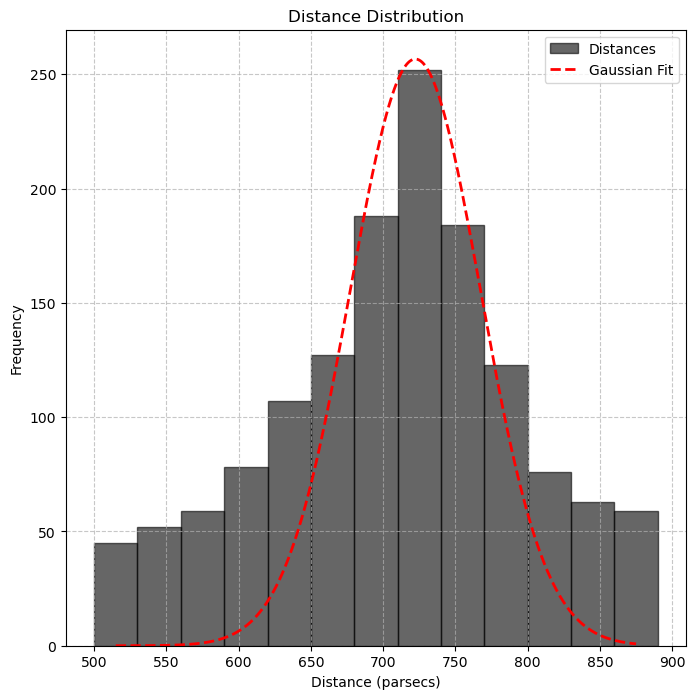

In [165]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def gaussian(x, mean, sigma, amplitude):
    return amplitude * np.exp(-0.5 * ((x - mean) / sigma)**2)

bin_size = 30
bins = np.arange(500, 900, bin_size)

plt.figure(figsize=(8, 8))

hist_values, bin_edges, _ = plt.hist(df_cleaning['distance_pc'], bins=bins, alpha=0.6, color='black', edgecolor='black', label='Distances')

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

initial_mean = np.mean(df_cleaning['distance_pc'])
initial_mean = 726  
initial_sigma = 7 #from flac. paper
initial_amplitude = max(hist_values)  


gaia_params, _ = curve_fit(gaussian, bin_centers, hist_values,
                           p0=[initial_mean, initial_sigma, initial_amplitude],
                           bounds=([715, 5, 0], [727, 45, np.inf]))

fitted_mean, fitted_sigma, fitted_amplitude = gaia_params

x_fit = np.linspace(min(bin_centers), max(bin_centers), 1000)
y_fit = gaussian(x_fit, *gaia_params)

plt.plot(x_fit, y_fit, color='red', linestyle='--', linewidth=2, label=f'Gaussian Fit')

plt.title('Distance Distribution')
plt.xlabel('Distance (parsecs)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.show()



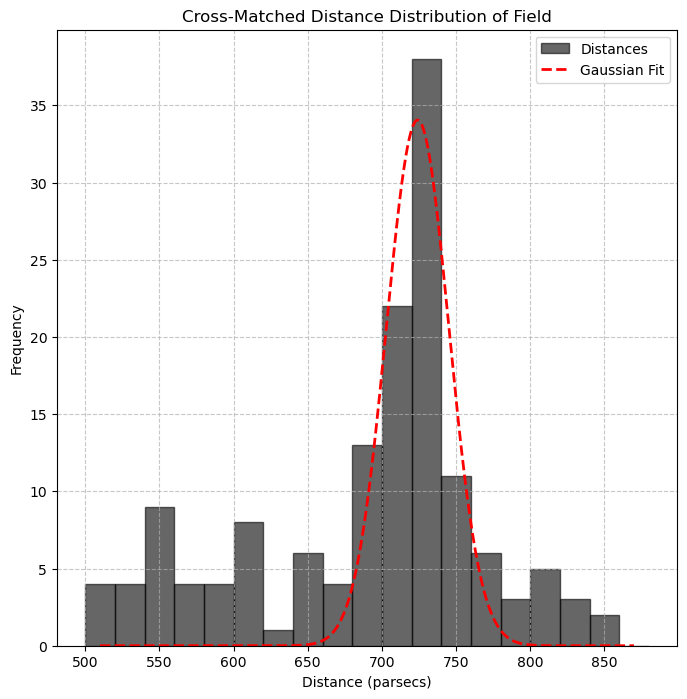

In [166]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def gaussian(x, mean, sigma, amplitude):
    return amplitude * np.exp(-0.5 * ((x - mean) / sigma)**2)

bin_size = 20
bins = np.arange(500, 900, bin_size)

plt.figure(figsize=(8, 8))

hist_values, bin_edges, _ = plt.hist(filtered_TwoMASS['distance_pc'], bins=bins, alpha=0.6, color='black', edgecolor='black', label='Distances')

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

initial_mean = np.mean(filtered_TwoMASS['distance_pc'])
initial_mean = 736  
initial_sigma = 7 #from flac. paper
initial_amplitude = max(hist_values)  


gaia_params, _ = curve_fit(gaussian, bin_centers, hist_values,
                           p0=[initial_mean, initial_sigma, initial_amplitude],
                           bounds=([715, 5, 0], [745, 40, np.inf]))

fitted_mean, fitted_sigma, fitted_amplitude = gaia_params

x_fit = np.linspace(min(bin_centers), max(bin_centers), 1000)
y_fit = gaussian(x_fit, *gaia_params)

plt.plot(x_fit, y_fit, color='red', linestyle='--', linewidth=2, label=f'Gaussian Fit')

plt.title('Cross-Matched Distance Distribution of Field')
plt.xlabel('Distance (parsecs)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.show()



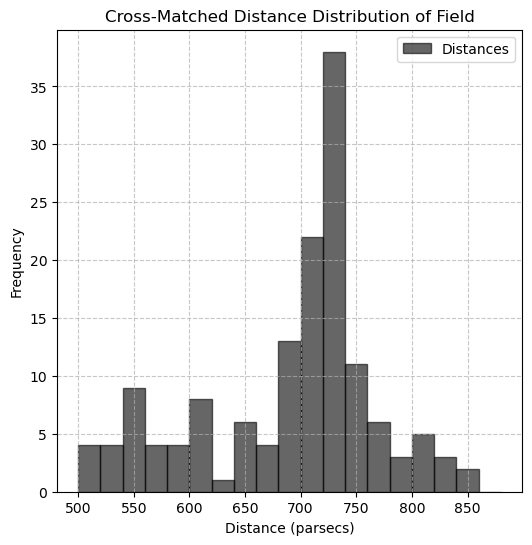

In [167]:
import numpy as np
import matplotlib.pyplot as plt

bin_size = 20
bins = np.arange(500, 900, bin_size)

plt.figure(figsize=(6, 6))

# Plot the histogram
plt.hist(filtered_TwoMASS['distance_pc'], bins=bins, alpha=0.6, color='black', edgecolor='black', label='Distances')

plt.title('Cross-Matched Distance Distribution of Field')
plt.xlabel('Distance (parsecs)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.show()




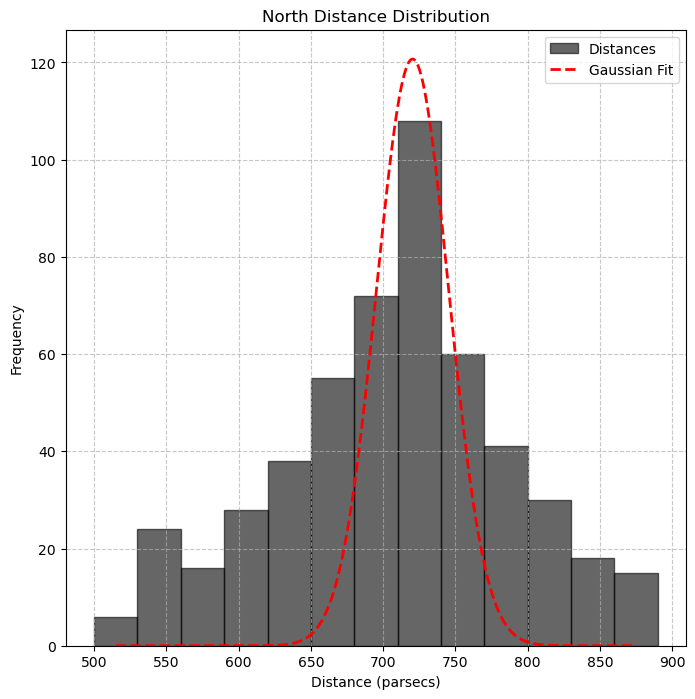

In [168]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def gaussian(x, mean, sigma, amplitude):
    return amplitude * np.exp(-0.5 * ((x - mean) / sigma)**2)

bin_size = 30
bins = np.arange(500, 900, bin_size)

plt.figure(figsize=(8, 8))

hist_values, bin_edges, _ = plt.hist(df_cleaningN['distance_pc'], bins=bins, alpha=0.6, color='black', edgecolor='black', label='Distances')

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

initial_mean = np.mean(df_cleaningN['distance_pc'])
initial_mean = 726  
initial_sigma = 7
initial_amplitude = max(hist_values)  


gaia_params, _ = curve_fit(gaussian, bin_centers, hist_values,
                           p0=[initial_mean, initial_sigma, initial_amplitude],
                           bounds=([710, 6, 0], [730, 25, np.inf]))

fitted_mean, fitted_sigma, fitted_amplitude = gaia_params

x_fit = np.linspace(min(bin_centers), max(bin_centers), 1000)
y_fit = gaussian(x_fit, *gaia_params)

plt.plot(x_fit, y_fit, color='red', linestyle='--', linewidth=2, label=f'Gaussian Fit')

plt.title('North Distance Distribution')
plt.xlabel('Distance (parsecs)')
plt.ylabel('Frequency')
plt.legend()

plt.grid(True, linestyle='--', alpha=0.7)

plt.show()



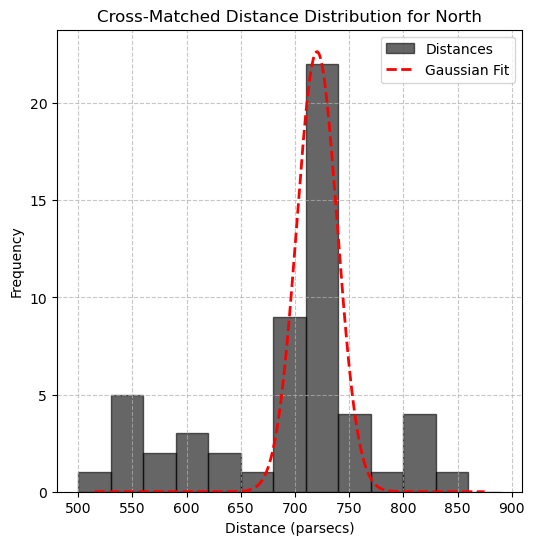

In [169]:
def gaussian(x, mean, sigma, amplitude):
    return amplitude * np.exp(-0.5 * ((x - mean) / sigma)**2)

bin_size = 30
bins = np.arange(500, 900, bin_size)

plt.figure(figsize=(6, 6))

hist_values, bin_edges, _ = plt.hist(filtered_TwoMASSN['distance_pc'], bins=bins, alpha=0.6, color='black', edgecolor='black', label='Distances')

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

initial_mean = np.mean(filtered_TwoMASSN['distance_pc'])
initial_mean = 726  
initial_sigma = 11 #from flac. paper
initial_amplitude = max(hist_values)  


gaia_params, _ = curve_fit(gaussian, bin_centers, hist_values,
                           p0=[initial_mean, initial_sigma, initial_amplitude],
                           bounds=([715, 5, 0], [727, 25, np.inf]))

fitted_mean, fitted_sigma, fitted_amplitude = gaia_params

x_fit = np.linspace(min(bin_centers), max(bin_centers), 1000)
y_fit = gaussian(x_fit, *gaia_params)

plt.plot(x_fit, y_fit, color='red', linestyle='--', linewidth=2, label=f'Gaussian Fit')

plt.title('Cross-Matched Distance Distribution for North')
plt.xlabel('Distance (parsecs)')
plt.ylabel('Frequency')

plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.show()



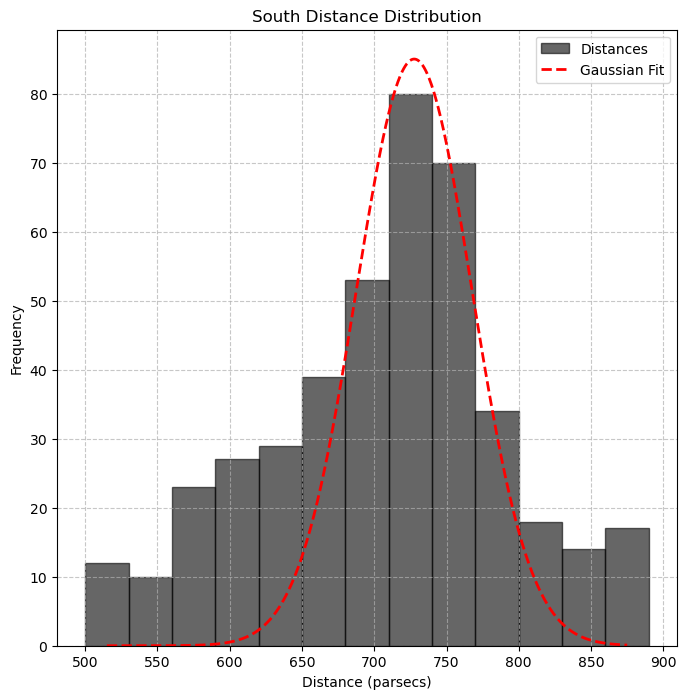

In [170]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def gaussian(x, mean, sigma, amplitude):
    return amplitude * np.exp(-0.5 * ((x - mean) / sigma)**2)

bin_size = 30
bins = np.arange(500, 900, bin_size)

plt.figure(figsize=(8, 8))

hist_values, bin_edges, _ = plt.hist(df_cleaningS['distance_pc'], bins=bins, alpha=0.6, color='black', edgecolor='black', label='Distances')

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

initial_mean = np.mean(df_cleaningS['distance_pc'])
initial_mean = 730  
initial_sigma = 7 #from flac. paper
initial_amplitude = max(hist_values)  


gaia_params, _ = curve_fit(gaussian, bin_centers, hist_values,
                           p0=[initial_mean, initial_sigma, initial_amplitude],
                           bounds=([715, 5, 0], [730, 40, np.inf]))

fitted_mean, fitted_sigma, fitted_amplitude = gaia_params

x_fit = np.linspace(min(bin_centers), max(bin_centers), 1000)
y_fit = gaussian(x_fit, *gaia_params)

plt.plot(x_fit, y_fit, color='red', linestyle='--', linewidth=2, label=f'Gaussian Fit')

plt.title('South Distance Distribution')
plt.xlabel('Distance (parsecs)')
plt.ylabel('Frequency')
plt.legend()

plt.grid(True, linestyle='--', alpha=0.7)

plt.show()



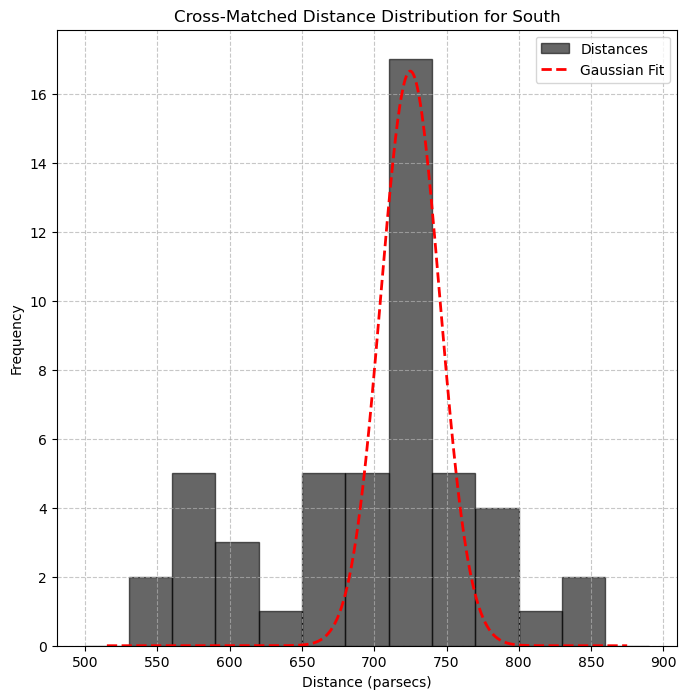

In [171]:
def gaussian(x, mean, sigma, amplitude):
    return amplitude * np.exp(-0.5 * ((x - mean) / sigma)**2)

bin_size = 30
bins = np.arange(500, 900, bin_size)

plt.figure(figsize=(8, 8))

hist_values, bin_edges, _ = plt.hist(filtered_TwoMASSs['distance_pc'], bins=bins, alpha=0.6, color='black', edgecolor='black', label='Distances')

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

initial_mean = np.mean(filtered_TwoMASSs['distance_pc'])
initial_mean = 726  
initial_sigma = 10 #from flac. paper
initial_amplitude = max(hist_values)  


gaia_params, _ = curve_fit(gaussian, bin_centers, hist_values,
                           p0=[initial_mean, initial_sigma, initial_amplitude],
                           bounds=([715, 5, 0], [730, 30, np.inf]))

fitted_mean, fitted_sigma, fitted_amplitude = gaia_params

x_fit = np.linspace(min(bin_centers), max(bin_centers), 1000)
y_fit = gaussian(x_fit, *gaia_params)

plt.plot(x_fit, y_fit, color='red', linestyle='--', linewidth=2, label=f'Gaussian Fit')

plt.title('Cross-Matched Distance Distribution for South')
plt.xlabel('Distance (parsecs)')
plt.ylabel('Frequency')
plt.legend()

plt.grid(True, linestyle='--', alpha=0.7)

plt.show()



In [172]:
ra_filtered = filtered_TwoMASS['ra'].values  # RA from filtered_TwoMASS
dec_filtered = filtered_TwoMASS['dec'].values  # DEC from filtered_TwoMASS


Region 1: RA=100.4, DEC=9.75
  Points: 7
  Median: 521.6 pc
  Range: 407.3 – 736.6 pc

Region 2: RA=100.25, DEC=9.56
  Points: 15
  Median: 722.2 pc
  Range: 126.2 – 854.7 pc

Region 3: RA=100.2, DEC=9.89
  Points: 12
  Median: 724.4 pc
  Range: 248.7 – 1425.9 pc

Region 4: RA=100.1, DEC=9.81
  Points: 3
  Median: 696.1 pc
  Range: 133.0 – 718.4 pc



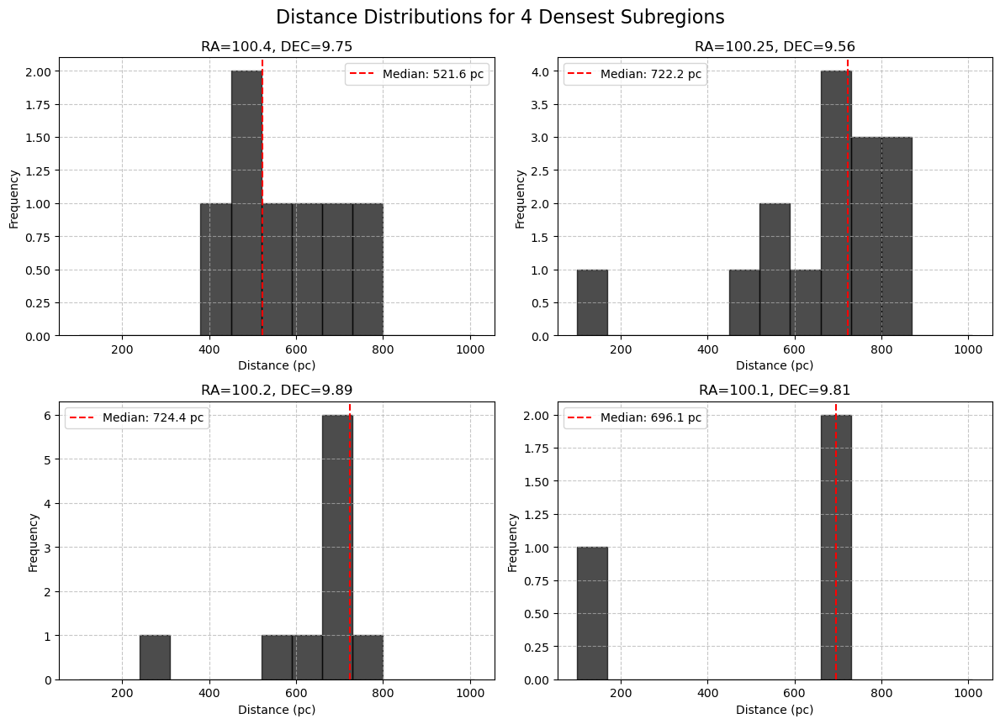

In [173]:
import numpy as np
import matplotlib.pyplot as plt

# Define the 4 centers
centers = [
    (100.4, 9.75),
    (100.25, 9.56),
    (100.2, 9.89),
    (100.1 , 9.81)
]

cutout_size = 0.05  # degrees
bin_size = 70  # parsecs

# Extract distances from matched 2MASS data
distance_pc = filtered_TwoMASS['distance_pc'].values  
ra = filtered_TwoMASS['ra'].values
dec = filtered_TwoMASS['dec'].values

# Setup subplots
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
axs = axs.flatten()

for idx, (RA_center, DEC_center) in enumerate(centers):
    mask = (ra >= (RA_center - cutout_size)) & (ra <= (RA_center + cutout_size)) & \
           (dec >= (DEC_center - cutout_size)) & (dec <= (DEC_center + cutout_size))
    
    cutout_distances = distance_pc[mask]

    # Stats
    median_d = np.median(cutout_distances)
    min_d = np.min(cutout_distances)
    max_d = np.max(cutout_distances)

    # Histogram
    bins = np.arange(100, 1000 + bin_size, bin_size)
    axs[idx].hist(cutout_distances, bins=bins, color='black', edgecolor='black', alpha=0.7)
    axs[idx].axvline(median_d, color='red', linestyle='--', label=f'Median: {median_d:.1f} pc')

    axs[idx].set_title(f'RA={RA_center}, DEC={DEC_center}')
    axs[idx].set_xlabel('Distance (pc)')
    axs[idx].set_ylabel('Frequency')
    axs[idx].legend()
    axs[idx].grid(True, linestyle='--', alpha=0.7)

    print(f"Region {idx+1}: RA={RA_center}, DEC={DEC_center}")
    print(f"  Points: {len(cutout_distances)}")
    print(f"  Median: {median_d:.1f} pc")
    print(f"  Range: {min_d:.1f} – {max_d:.1f} pc\n")

# Hide any unused subplot (in case total < 6)
for j in range(len(centers), len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.suptitle('Distance Distributions for 4 Densest Subregions', fontsize=16, y=1.02)
plt.show()


Points in the cutout region: 15


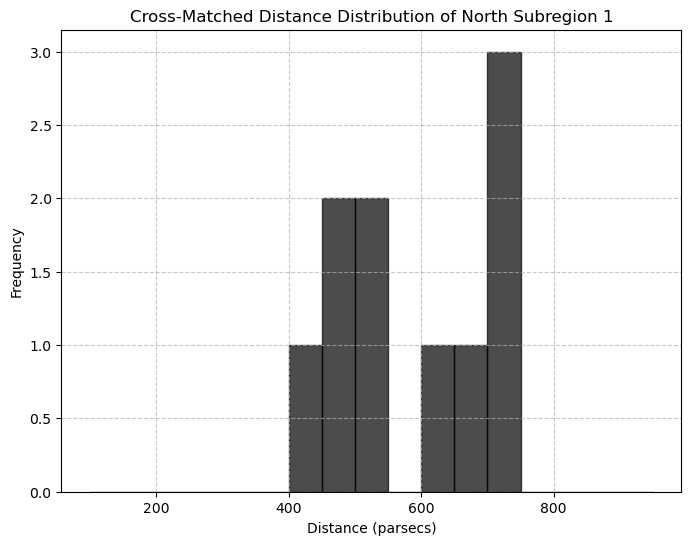

In [174]:

RA_center = 100.45
DEC_center = 9.75
cutout_size = 0.05  #  degrees around the center for square cutout

distance_pc = filtered_TwoMASS['distance_pc'].values  

# Apply the square cutout filter on RA and DEC (using the ra_filtered and dec_filtered arrays)
cutout_mask = (ra_filtered >= (RA_center - cutout_size)) & (ra_filtered <= (RA_center + cutout_size)) & \
              (dec_filtered >= (DEC_center - cutout_size)) & (dec_filtered <= (DEC_center + cutout_size))

distance_cutout = distance_pc[cutout_mask]

print(f"Points in the cutout region: {len(distance_cutout)}")


plt.figure(figsize=(8, 6))


bin_size = 50 
bins = np.arange(100, 1000, bin_size)

plt.hist(distance_cutout, bins=bins, color='black', edgecolor= 'black', alpha=0.7)


plt.title('Cross-Matched Distance Distribution of North Subregion 1')
plt.xlabel('Distance (parsecs)')
plt.ylabel('Frequency')

plt.grid(True, linestyle='--', alpha=0.7)

plt.show()

Points in the cutout region: 15


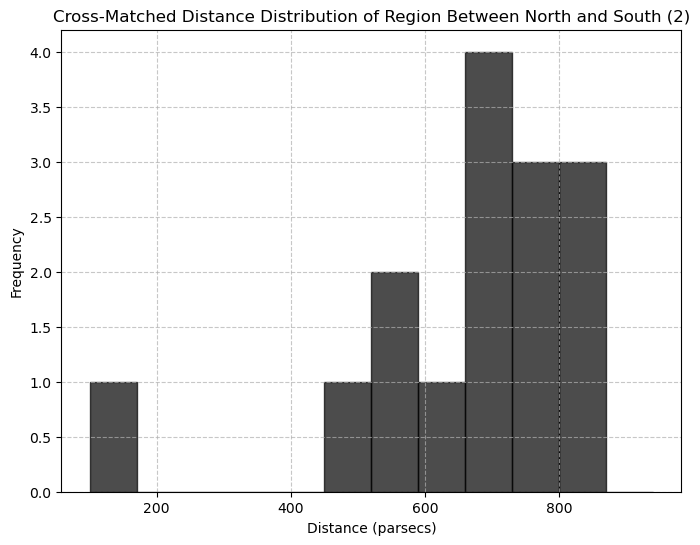

In [175]:

RA_center = 100.25
DEC_center = 9.56
cutout_size = 0.05 #degrees around the center for square cutout

distance_pc = filtered_TwoMASS['distance_pc'].values  

# Apply the square cutout filter on RA and DEC (using the ra_filtered and dec_filtered arrays)
cutout_mask = (ra_filtered >= (RA_center - cutout_size)) & (ra_filtered <= (RA_center + cutout_size)) & \
              (dec_filtered >= (DEC_center - cutout_size)) & (dec_filtered <= (DEC_center + cutout_size))

distance_cutout = distance_pc[cutout_mask]

print(f"Points in the cutout region: {len(distance_cutout)}")


plt.figure(figsize=(8, 6))


bin_size = 70 
bins = np.arange(100, 1000, bin_size)

plt.hist(distance_cutout, bins=bins, color='black', edgecolor= 'black', alpha=0.7)


plt.title('Cross-Matched Distance Distribution of Region Between North and South (2)')
plt.xlabel('Distance (parsecs)')
plt.ylabel('Frequency')

plt.grid(True, linestyle='--', alpha=0.7)

plt.show()

Points in the cutout region: 12


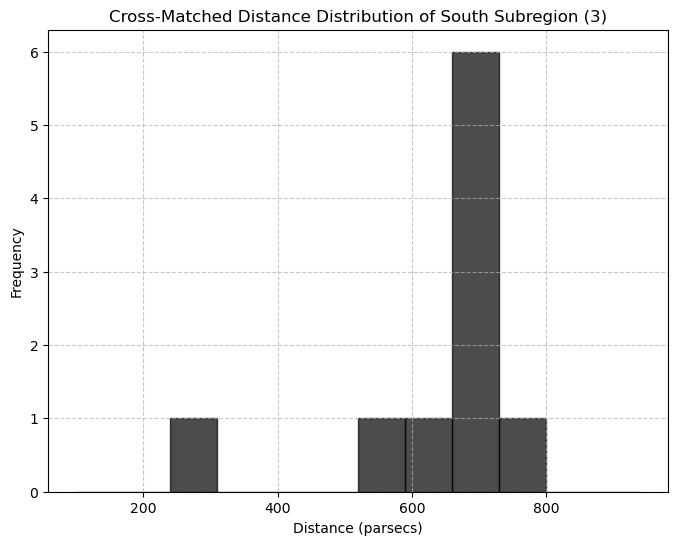

In [176]:

RA_center = 100.2
DEC_center = 9.89
cutout_size = 0.05 # degrees around the center for square cutout

distance_pc = filtered_TwoMASS['distance_pc'].values  

# Apply the square cutout filter on RA and DEC (using the ra_filtered and dec_filtered arrays)
cutout_mask = (ra_filtered >= (RA_center - cutout_size)) & (ra_filtered <= (RA_center + cutout_size)) & \
              (dec_filtered >= (DEC_center - cutout_size)) & (dec_filtered <= (DEC_center + cutout_size))

distance_cutout = distance_pc[cutout_mask]

print(f"Points in the cutout region: {len(distance_cutout)}")


plt.figure(figsize=(8, 6))


bin_size = 70 
bins = np.arange(100, 1000, bin_size)

plt.hist(distance_cutout, bins=bins, color='black', edgecolor= 'black', alpha=0.7)


plt.title('Cross-Matched Distance Distribution of South Subregion (3)')
plt.xlabel('Distance (parsecs)')
plt.ylabel('Frequency')

plt.grid(True, linestyle='--', alpha=0.7)

plt.show()

Points in the cutout region: 3


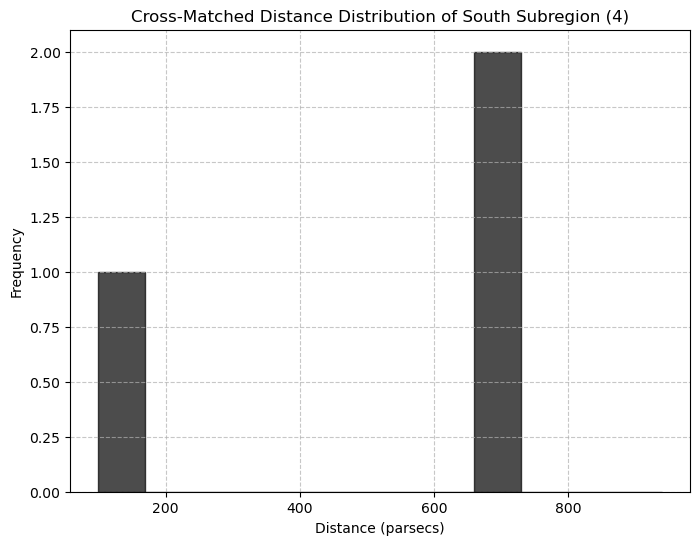

In [177]:

RA_center = 100.1
DEC_center = 9.81
cutout_size = 0.05 # degrees around the center for square cutout

distance_pc = filtered_TwoMASS['distance_pc'].values  

# Apply the square cutout filter on RA and DEC (using the ra_filtered and dec_filtered arrays)
cutout_mask = (ra_filtered >= (RA_center - cutout_size)) & (ra_filtered <= (RA_center + cutout_size)) & \
              (dec_filtered >= (DEC_center - cutout_size)) & (dec_filtered <= (DEC_center + cutout_size))

distance_cutout = distance_pc[cutout_mask]

print(f"Points in the cutout region: {len(distance_cutout)}")


plt.figure(figsize=(8, 6))


bin_size = 70 
bins = np.arange(100, 1000, bin_size)

plt.hist(distance_cutout, bins=bins, color='black', edgecolor= 'black', alpha=0.7)


plt.title('Cross-Matched Distance Distribution of South Subregion (4)')
plt.xlabel('Distance (parsecs)')
plt.ylabel('Frequency')

plt.grid(True, linestyle='--', alpha=0.7)

plt.show()

## **Scatter Plot Figures**

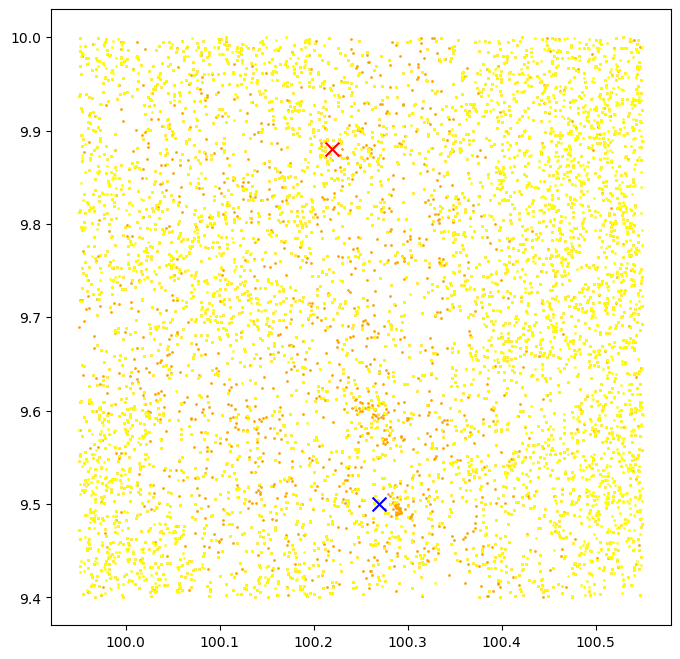

In [178]:
plt.figure(figsize=(8,8)) 
plt.scatter(TwoMASS['ra'], TwoMASS['dec'], s=1,  color='orange')
plt.scatter(df_cleaning['ra'], df_cleaning['dec'], s=1, color='yellow')

plt.scatter(100.22, 9.88, color='red', label="North Point", marker='x', s=100)  # Red 'x' for North
plt.scatter(100.27, 9.50, color='blue', label="South Point", marker='x', s=100)  # Blue 'x' for South


plt.show()

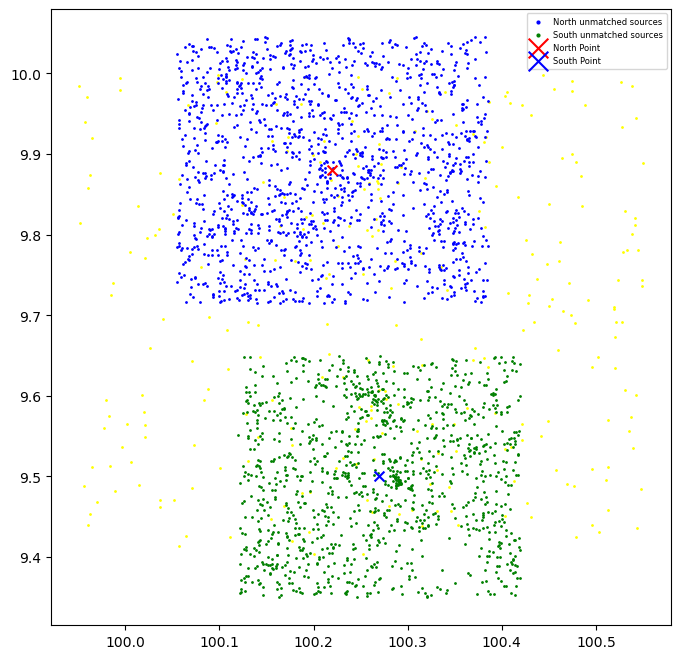

In [179]:
plt.figure(figsize=(8,8)) 
plt.scatter(filtered_TwoMASS['ra'], filtered_TwoMASS['dec'], s=1, color='yellow')
#plt.scatter(df_cleaning['ra'], df_cleaning['dec'], s=1, color='yellow')
#plt.scatter(did_not_match['ra'], did_not_match['dec'], s=1,  color='red', label='The field unmatched sources')
plt.scatter(did_not_matchN['ra'], did_not_matchN['dec'], s=1, color='blue',label='North unmatched sources')
plt.scatter(did_not_matchS['ra'], did_not_matchS['dec'], s=1, color='green',label='South unmatched sources')

plt.scatter(100.22, 9.88, color='red', label="North Point", marker='x', s=50)  # Red 'x' for North
plt.scatter(100.27, 9.50, color='blue', label="South Point", marker='x', s=50)  # Blue 'x' for South

plt.legend(markerscale=2, fontsize=6)
plt.show()

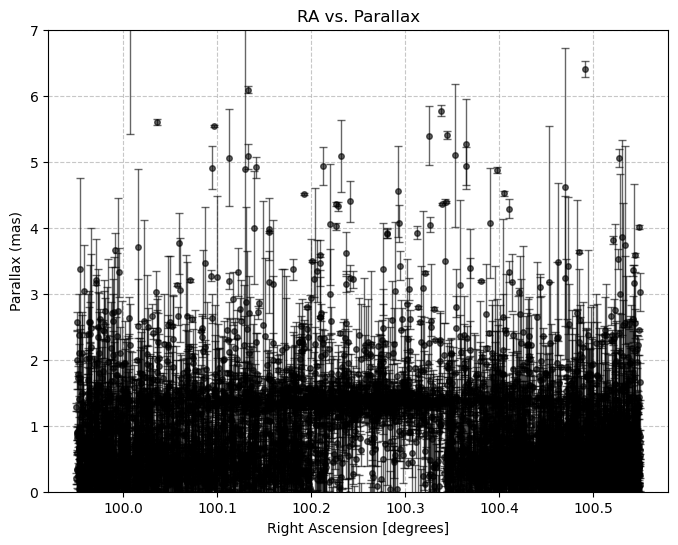

In [180]:
plt.figure(figsize=(8, 6))

plt.errorbar(df_clean['ra'], df_clean['parallax'], 
             yerr=df_clean['parallax_error'],  # Error bars for parallax
             fmt='o', color='black', alpha=0.6, markersize=4, 
             capsize=3, capthick=1, elinewidth=1) 
plt.ylim(0,7)
plt.xlabel('Right Ascension [degrees]')
plt.ylabel('Parallax (mas)')
plt.title('RA vs. Parallax')

plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


#fractinal parallax error of .2/.5 2

#cut off everything above 1-2 & 4 arcsecs 1


#STEP 1 #do parallax  v parallax error plot 3 IN FIELD
# para error v G band mag plot
#para v G band 


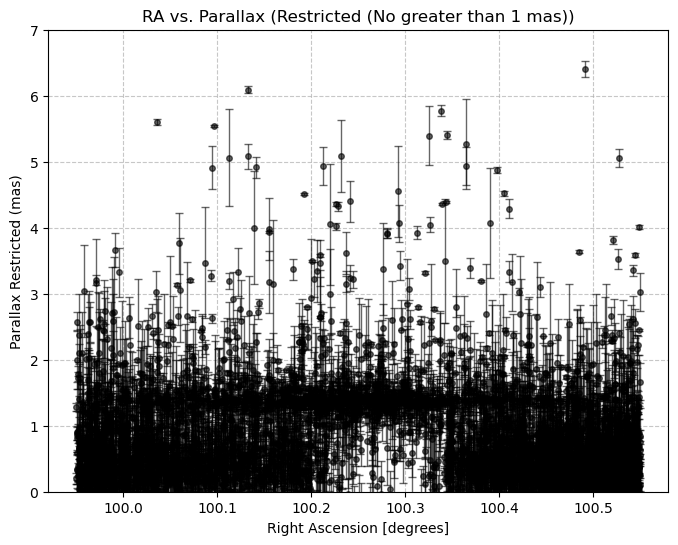

In [181]:
plt.figure(figsize=(8, 6))

plt.errorbar(df_cleaning['ra'], df_cleaning['parallax'], 
             yerr=df_cleaning['parallax_error'],  # Use df_cleaning
             fmt='o', color='black', alpha=0.6, markersize=4, 
             capsize=3, capthick=1, elinewidth=1) 

plt.ylim(0, 7)
plt.xlabel('Right Ascension [degrees]')
plt.ylabel('Parallax Restricted (mas)')
plt.title('RA vs. Parallax (Restricted (No greater than 1 mas))')

plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


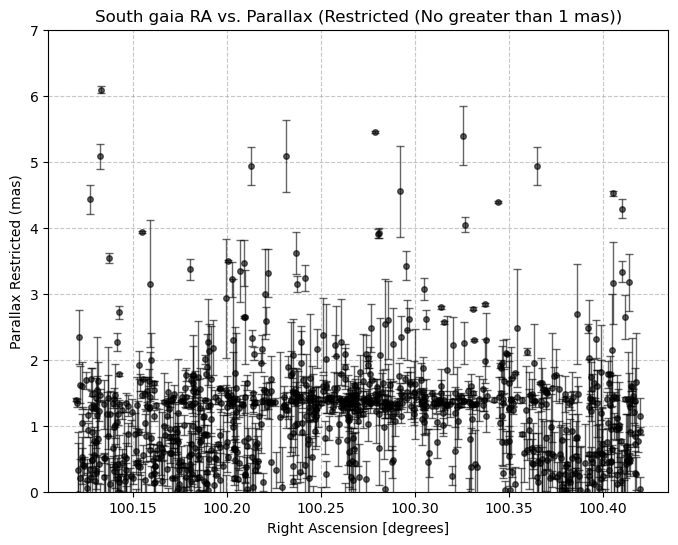

In [182]:
plt.figure(figsize=(8, 6))

plt.errorbar(df_cleaningS['ra'], df_cleaningS['parallax'], 
             yerr=df_cleaningS['parallax_error'],  # Use df_cleaning
             fmt='o', color='black', alpha=0.6, markersize=4, 
             capsize=3, capthick=1, elinewidth=1) 

plt.ylim(0, 7)
plt.xlabel('Right Ascension [degrees]')
plt.ylabel('Parallax Restricted (mas)')
plt.title('South gaia RA vs. Parallax (Restricted (No greater than 1 mas))')

plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


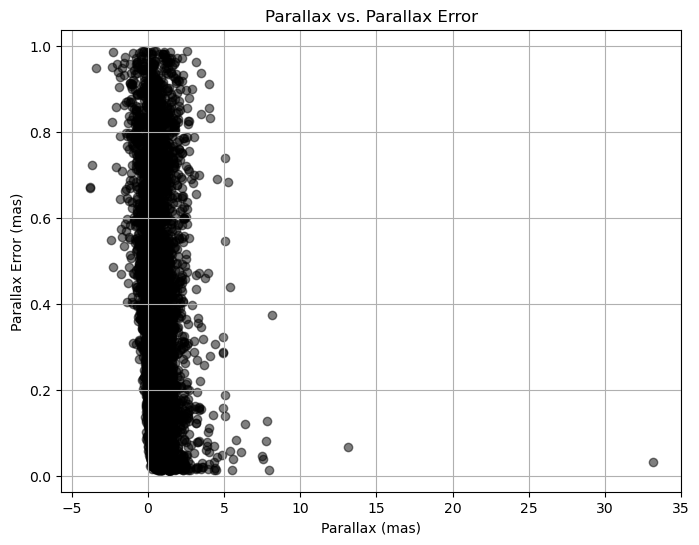

In [183]:
plt.figure(figsize=(8, 6))
plt.scatter(df_cleaning['parallax'], df_cleaning['parallax_error'], alpha=0.5, color='black', marker='o')

plt.title('Parallax vs. Parallax Error')
plt.xlabel('Parallax (mas)')
plt.ylabel('Parallax Error (mas)')
plt.grid(True)
plt.show()

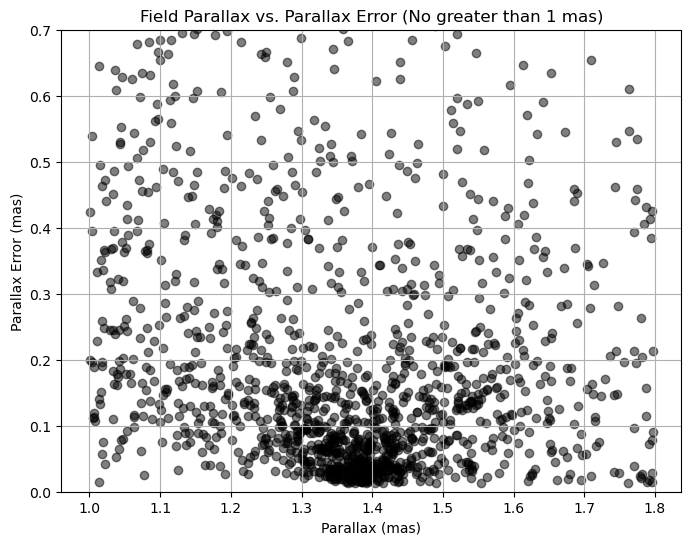

In [184]:
plt.figure(figsize=(8, 6))

#plx error under 0.5 and narrowed to plx range of 1-1.8

df_cleaning['parallax'] = df_cleaning['parallax'].astype(float)  # Convert to float64
filtered_data = df_cleaning[(df_cleaning['parallax'] >= 1) & (df_cleaning['parallax'] <= 1.8)]

plt.scatter(filtered_data['parallax'], filtered_data['parallax_error'], alpha=0.5, color='black', marker='o')

plt.title('Field Parallax vs. Parallax Error (No greater than 1 mas)')
plt.xlabel('Parallax (mas)')
plt.ylabel('Parallax Error (mas)')
plt.ylim(0,0.7)
plt.grid(True)
plt.show()

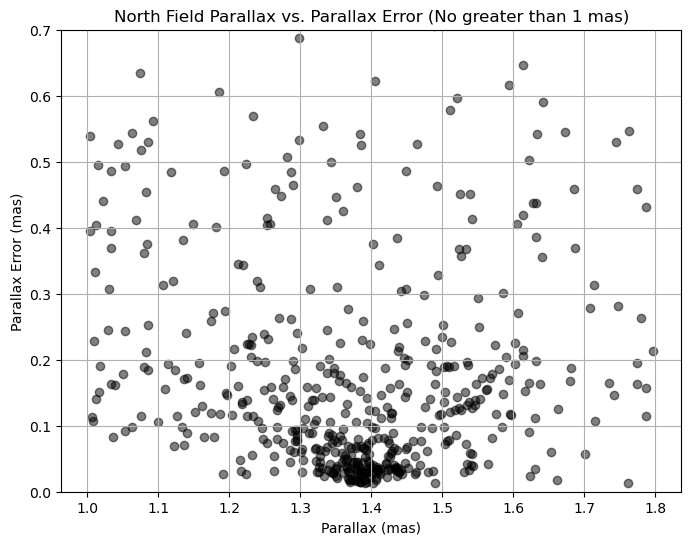

In [185]:
plt.figure(figsize=(8, 6))

#plx error under 0.5 and narrowed to plx range of 1-1.8

df_cleaningN['parallax'] = df_cleaningN['parallax'].astype(float)  # Convert to float64
filtered_dataN = df_cleaningN[(df_cleaningN['parallax'] >= 1) & (df_cleaningN['parallax'] <= 1.8)]

plt.scatter(filtered_dataN['parallax'], filtered_dataN['parallax_error'], alpha=0.5, color='black', marker='o')

plt.title('North Field Parallax vs. Parallax Error (No greater than 1 mas)')
plt.xlabel('Parallax (mas)')
plt.ylabel('Parallax Error (mas)')
plt.ylim(0,0.7)
plt.grid(True)
plt.show()

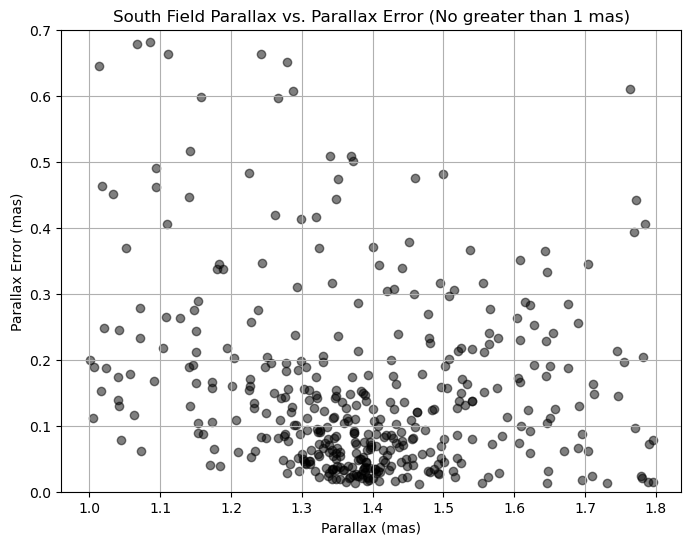

In [186]:
plt.figure(figsize=(8, 6))

#plx error under 0.5 and narrowed to plx range of 1-1.8

df_cleaningS['parallax'] = df_cleaningS['parallax'].astype(float)  # Convert to float64
filtered_dataS = df_cleaningS[(df_cleaningS['parallax'] >= 1) & (df_cleaningS['parallax'] <= 1.8)]

plt.scatter(filtered_dataS['parallax'], filtered_dataS['parallax_error'], alpha=0.5, color='black', marker='o')

plt.title('South Field Parallax vs. Parallax Error (No greater than 1 mas)')
plt.xlabel('Parallax (mas)')
plt.ylabel('Parallax Error (mas)')
plt.ylim(0,0.7)
plt.grid(True)
plt.show()

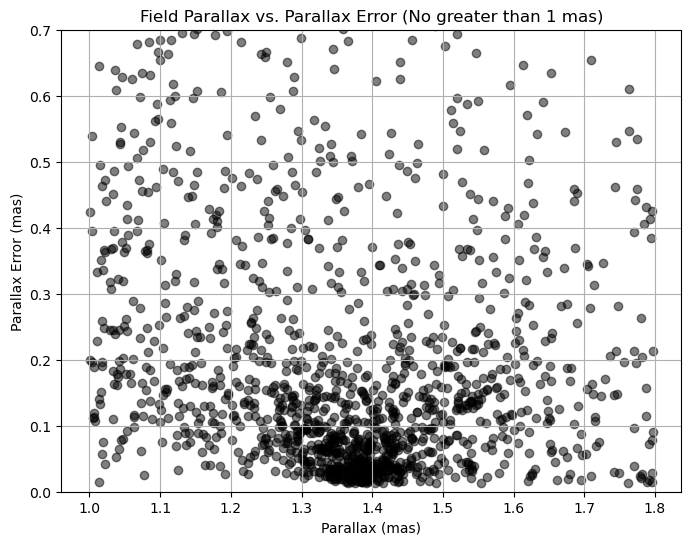

In [187]:
plt.figure(figsize=(8, 6))

#plx error under 0.5 and narrowed to plx range of 1-1.8

df_cleaning['parallax'] = df_cleaning['parallax'].astype(float)  # Convert to float64
filtered_data = df_cleaning[(df_cleaning['parallax'] >= 1) & (df_cleaning['parallax'] <= 1.8)]

plt.scatter(filtered_data['parallax'], filtered_data['parallax_error'], alpha=0.5, color='black', marker='o')

plt.title('Field Parallax vs. Parallax Error (No greater than 1 mas)')
plt.xlabel('Parallax (mas)')
plt.ylabel('Parallax Error (mas)')
plt.ylim(0,0.7)
plt.grid(True)
plt.show()

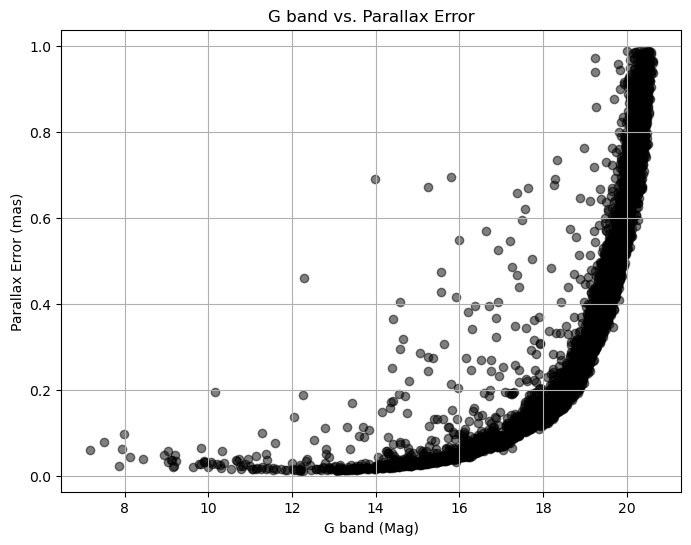

In [188]:
plt.figure(figsize=(8, 6))
plt.scatter(df_cleaning['phot_g_mean_mag'], df_cleaning['parallax_error'], alpha=0.5, color='black', marker='o')

plt.title('G band vs. Parallax Error')
plt.xlabel('G band (Mag)')
plt.ylabel('Parallax Error (mas)')
plt.grid(True)
plt.show()

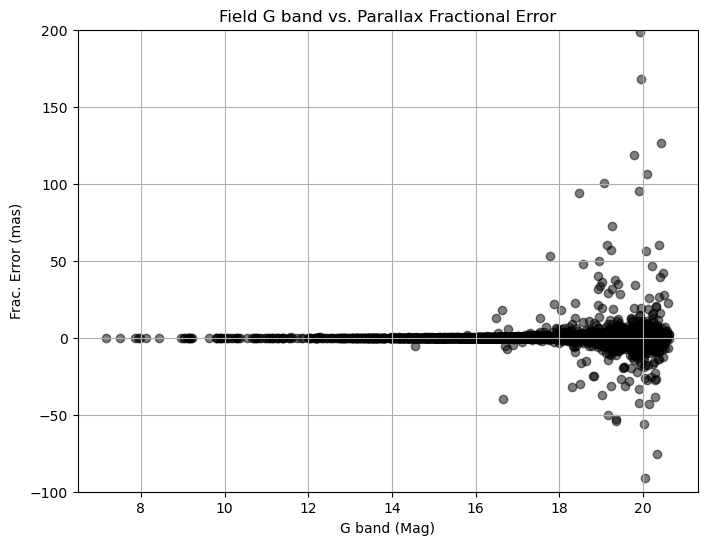

In [189]:
plt.figure(figsize=(8, 6))
plt.scatter(df_cleaning['phot_g_mean_mag'], frac_parallax, alpha=0.5, color='black', marker='o')

plt.title('Field G band vs. Parallax Fractional Error')
plt.xlabel('G band (Mag)')
plt.ylabel('Frac. Error (mas)')
plt.ylim(-100,200)
plt.grid(True)
plt.show()

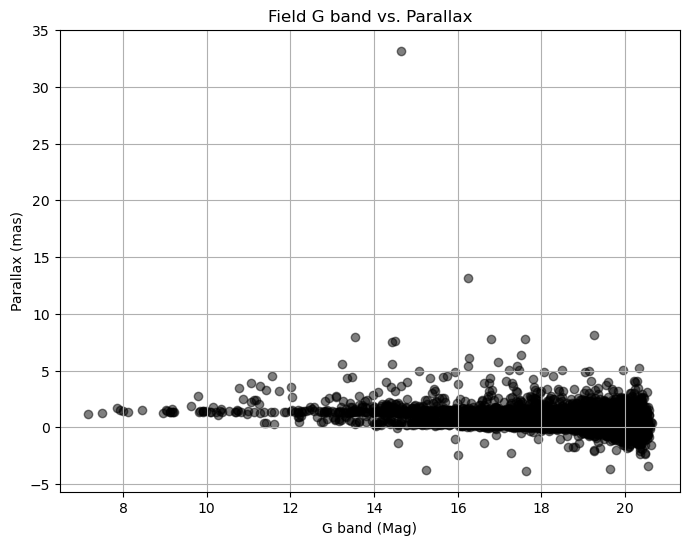

In [190]:
plt.figure(figsize=(8, 6))
plt.scatter(df_cleaning['phot_g_mean_mag'], df_cleaning['parallax'], alpha=0.5, color='black', marker='o')

plt.title('Field G band vs. Parallax')
plt.xlabel('G band (Mag)')
plt.ylabel('Parallax (mas)')
plt.grid(True)
plt.show()

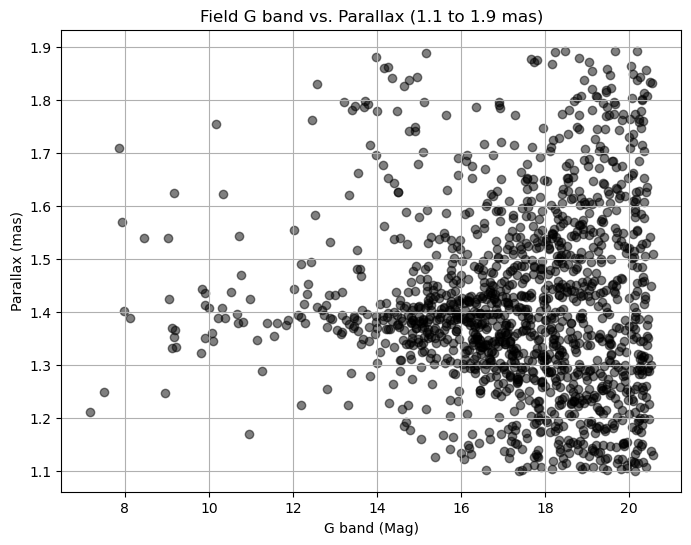

In [191]:
plt.figure(figsize=(8, 6))

df_cleaning['parallax'] = df_cleaning['parallax'].astype(float)  # Convert to float64
filtered_data = df_cleaning[(df_cleaning['parallax'] >= 1.1) & (df_cleaning['parallax'] <= 1.9)]


plt.scatter(filtered_data['phot_g_mean_mag'], filtered_data['parallax'], alpha=0.5, color='black', marker='o')

plt.title('Field G band vs. Parallax (1.1 to 1.9 mas)')
plt.xlabel('G band (Mag)')
plt.ylabel('Parallax (mas)')
plt.grid(True)
plt.show()

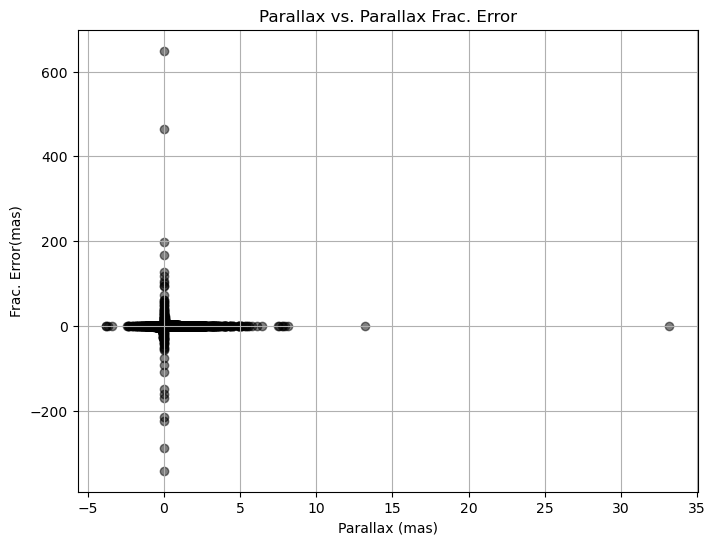

In [192]:
plt.figure(figsize=(8, 6))
plt.scatter(df_cleaning['parallax'], frac_parallax, alpha=0.5, color='black', marker='o')

plt.title('Parallax vs. Parallax Frac. Error')
plt.xlabel('Parallax (mas)')
plt.ylabel('Frac. Error(mas)')
plt.grid(True)
plt.show()

## **Radial Plots**

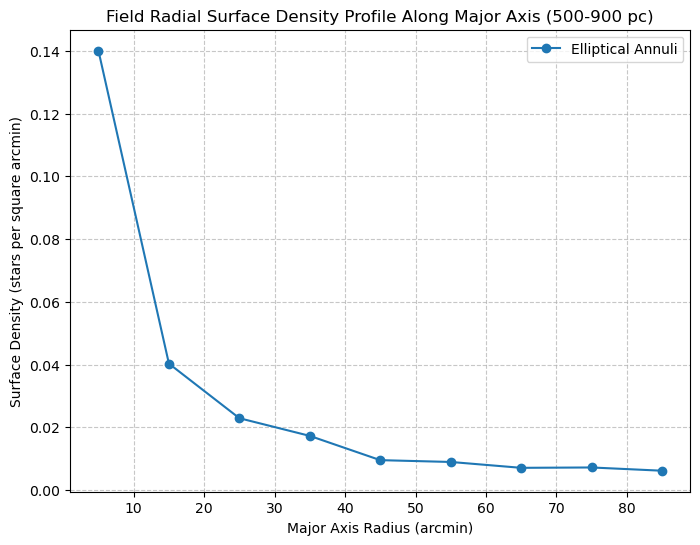

In [193]:
import numpy as np
import matplotlib.pyplot as plt


def annulus_spacing_arcmin(distance_pc):
    return 10 



def parsec_to_arcmin(parsecs, distance_pc):
    return np.arctan(parsecs / distance_pc) * (180 / np.pi) * 60  # Convert radians to arcminutes



filtered_data = df_cleaning[(df_cleaning['distance_pc'] >= 500) & (df_cleaning['distance_pc'] <= 900)]
distances_pc = filtered_data['distance_pc'].values


cluster_distance_pc = np.median(distances_pc)
distances_arcmin = parsec_to_arcmin(np.abs(distances_pc - cluster_distance_pc), cluster_distance_pc)

max_limit = 100 
distances_arcmin = np.clip(distances_arcmin, 0, max_limit)


max_distance_arcmin = max(distances_arcmin)
radii_arcmin = np.arange(0, max_distance_arcmin, annulus_spacing_arcmin(max_distance_arcmin))

surface_density = np.zeros(len(radii_arcmin)-1)


for i in range(len(surface_density)):
    in_annulus = (distances_arcmin >= radii_arcmin[i]) & (distances_arcmin < radii_arcmin[i+1])
    num_stars = np.sum(in_annulus)
    annulus_area = np.pi * (radii_arcmin[i+1]**2 - radii_arcmin[i]**2)  
    surface_density[i] = num_stars / annulus_area if num_stars > 0 else 0  


plt.figure(figsize=(8, 6))
plt.plot((radii_arcmin[:-1] + radii_arcmin[1:]) / 2, surface_density, marker='o', linestyle='-', label='Elliptical Annuli')


plt.xlabel('Major Axis Radius (arcmin)')
plt.ylabel('Surface Density (stars per square arcmin)')
plt.title('Field Radial Surface Density Profile Along Major Axis (500-900 pc)')

plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.show()




#cap query for arc min (in degree for query so convert) based on where this flattens so like +/- 50/100/150 for ra andd dec
#13 -14 G band mag greater 

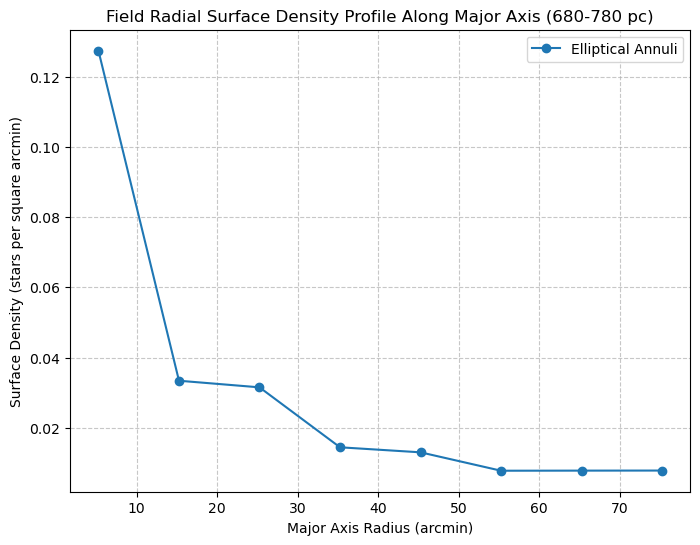

In [194]:

def annulus_spacing_arcmin(distance_pc):
    return 10  


def parsec_to_arcmin(parsecs, distance_pc):
    return (parsecs / distance_pc) * 3437.75  # 1 radian = 3437.75 arcmin

filtered_data = df_cleaning[(df_cleaning['distance_pc'] >= 680) & (df_cleaning['distance_pc'] <= 780)]
distances_pc = filtered_data['distance_pc'].values

cluster_distance_pc = np.median(distances_pc)
distances_arcmin = parsec_to_arcmin(np.abs(distances_pc - cluster_distance_pc), cluster_distance_pc)

max_limit = 90 
distances_arcmin = np.clip(distances_arcmin, 0, max_limit)


max_distance_arcmin = max(distances_arcmin)

radii_arcmin = np.arange(min(distances_arcmin), max_distance_arcmin, annulus_spacing_arcmin(max_distance_arcmin))
surface_density = np.zeros(len(radii_arcmin) - 1)



for i in range(len(surface_density)):
    in_annulus = (distances_arcmin >= radii_arcmin[i]) & (distances_arcmin < radii_arcmin[i+1])
    num_stars = np.sum(in_annulus)
    annulus_area = np.pi * (radii_arcmin[i+1]**2 - radii_arcmin[i]**2)  # Area of annulus in arcmin^2
    surface_density[i] = num_stars / annulus_area if num_stars > 0 else 0  # Density in stars per square arcmin


plt.figure(figsize=(8, 6))
plt.plot((radii_arcmin[:-1] + radii_arcmin[1:]) / 2, surface_density, marker='o', linestyle='-', label='Elliptical Annuli')



plt.xlabel('Major Axis Radius (arcmin)')
plt.ylabel('Surface Density (stars per square arcmin)')
plt.title('Field Radial Surface Density Profile Along Major Axis (680-780 pc)') 

plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.show()









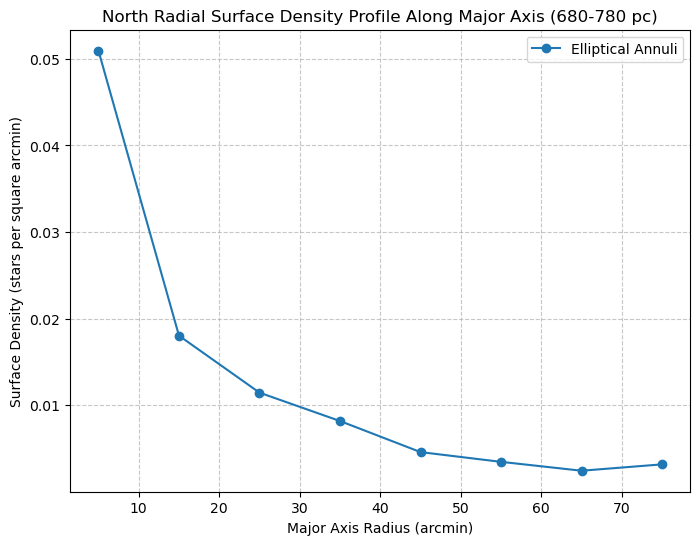

In [195]:

def annulus_spacing_arcmin(distance_pc):
    return 10  


def parsec_to_arcmin(parsecs, distance_pc):
    return (parsecs / distance_pc) * 3437.75  # 1 radian = 3437.75 arcmin

filtered_dataN = df_cleaningN[(df_cleaningN['distance_pc'] >= 680) & (df_cleaningN['distance_pc'] <= 780)]
distances_pc = filtered_dataN['distance_pc'].values

cluster_distance_pc = np.median(distances_pc)
distances_arcmin = parsec_to_arcmin(np.abs(distances_pc - cluster_distance_pc), cluster_distance_pc)

max_limit = 90 
distances_arcmin = np.clip(distances_arcmin, 0, max_limit)


max_distance_arcmin = max(distances_arcmin)

radii_arcmin = np.arange(min(distances_arcmin), max_distance_arcmin, annulus_spacing_arcmin(max_distance_arcmin))
surface_density = np.zeros(len(radii_arcmin) - 1)



for i in range(len(surface_density)):
    in_annulus = (distances_arcmin >= radii_arcmin[i]) & (distances_arcmin < radii_arcmin[i+1])
    num_stars = np.sum(in_annulus)
    annulus_area = np.pi * (radii_arcmin[i+1]**2 - radii_arcmin[i]**2)  # Area of annulus in arcmin^2
    surface_density[i] = num_stars / annulus_area if num_stars > 0 else 0  # Density in stars per square arcmin


plt.figure(figsize=(8, 6))
plt.plot((radii_arcmin[:-1] + radii_arcmin[1:]) / 2, surface_density, marker='o', linestyle='-', label='Elliptical Annuli')



plt.xlabel('Major Axis Radius (arcmin)')
plt.ylabel('Surface Density (stars per square arcmin)')
plt.title('North Radial Surface Density Profile Along Major Axis (680-780 pc)') 

plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.show()




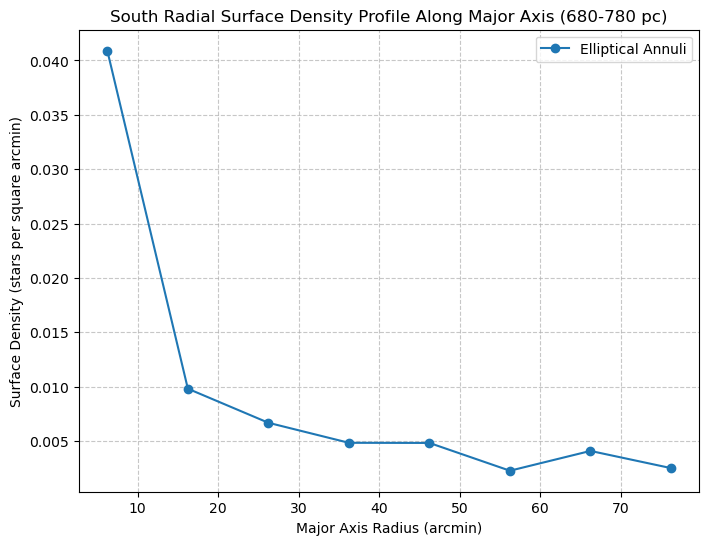

In [196]:

def annulus_spacing_arcmin(distance_pc):
    return 10  


def parsec_to_arcmin(parsecs, distance_pc):
    return (parsecs / distance_pc) * 3437.75  # 1 radian = 3437.75 arcmin

filtered_dataS = df_cleaningS[(df_cleaningS['distance_pc'] >= 680) & (df_cleaningS['distance_pc'] <= 780)]
distances_pc = filtered_dataS['distance_pc'].values

cluster_distance_pc = np.median(distances_pc)
distances_arcmin = parsec_to_arcmin(np.abs(distances_pc - cluster_distance_pc), cluster_distance_pc)

max_limit = 90 
distances_arcmin = np.clip(distances_arcmin, 0, max_limit)


max_distance_arcmin = max(distances_arcmin)

radii_arcmin = np.arange(min(distances_arcmin), max_distance_arcmin, annulus_spacing_arcmin(max_distance_arcmin))
surface_density = np.zeros(len(radii_arcmin) - 1)



for i in range(len(surface_density)):
    in_annulus = (distances_arcmin >= radii_arcmin[i]) & (distances_arcmin < radii_arcmin[i+1])
    num_stars = np.sum(in_annulus)
    annulus_area = np.pi * (radii_arcmin[i+1]**2 - radii_arcmin[i]**2)  # Area of annulus in arcmin^2
    surface_density[i] = num_stars / annulus_area if num_stars > 0 else 0  # Density in stars per square arcmin


plt.figure(figsize=(8, 6))
plt.plot((radii_arcmin[:-1] + radii_arcmin[1:]) / 2, surface_density, marker='o', linestyle='-', label='Elliptical Annuli')



plt.xlabel('Major Axis Radius (arcmin)')
plt.ylabel('Surface Density (stars per square arcmin)')
plt.title('South Radial Surface Density Profile Along Major Axis (680-780 pc)') 

plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.show()









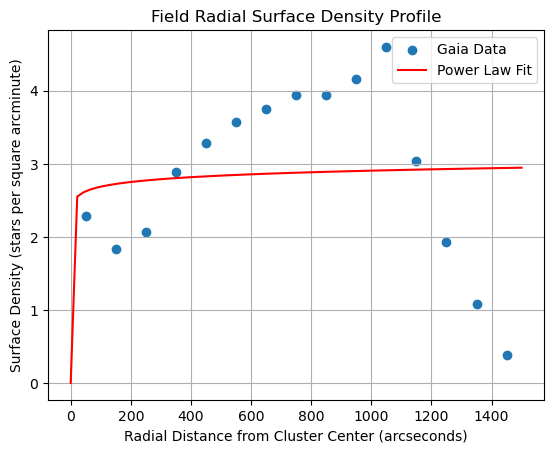

In [197]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
 ##NORTH### circular annuli not elliptical
    
    

cluster_center = (100.25, 9.7) 

# Step 1: Extrat RA and Dec columns from gaia1 (and remove NaNs if necessary)
x = df_cleaning['ra'].dropna()  
y = df_cleaning['dec'].dropna()  

# Step 2: Convert RA and Dec to arcseconds
# Convert RA to arcseconds using the formula: RA in arcseconds = (RA difference) * (3600 * cos(Dec))
x_arcsec = (x - cluster_center[0]) * 3600 * np.cos(np.deg2rad(y))  # RA in arcseconds
y_arcsec = (y - cluster_center[1]) * 3600  # Dec in arcseconds (no cos factor for Dec)

# Step 3: Compute distances from the cluster center in arcseconds
distances = np.sqrt(x_arcsec**2 + y_arcsec**2)

# Step 4: Define concentric rings with increasing radii (in arcseconds)
radius_bins = np.arange(0, np.ceil(np.max(distances)) + 1, 100)  

# Step 5: Initialize array to store surface density values
surface_density = np.zeros(len(radius_bins) - 1)

# Step 6: Count stars within each ring and compute surface density
for i in range(len(surface_density)):
    stars_in_ring = (distances >= radius_bins[i]) & (distances < radius_bins[i+1])
    num_stars_in_ring = np.sum(stars_in_ring)
    ring_area = np.pi * ((radius_bins[i+1])**2 - (radius_bins[i])**2)  # Area of the ring in arcseconds^2
    surface_density[i] = num_stars_in_ring / ring_area if num_stars_in_ring > 0 else 0

# Step 7: Convert surface density from stars per square arcsecond to stars per square arcminute
surface_density_arcmin = surface_density * 3600  # Convert to arcminutes^2

# Step 8: Fit a power law to the data
def power_law(radius, a, b):
    return a * radius ** b

# Fit the power law to the observed surface density data
popt, pcov = curve_fit(power_law, (radius_bins[:-1] + radius_bins[1:]) / 2, surface_density_arcmin)

# Step 9: Generate the power law curve using the optimized parameters
radius_fit = np.linspace(min(radius_bins), max(radius_bins), 70)
surface_density_fit_arcmin = power_law(radius_fit, *popt)

# Step 10: Plot the surface density profile and the fitted power law
plt.scatter((radius_bins[:-1] + radius_bins[1:]) / 2, surface_density_arcmin, label='Gaia Data')
plt.plot(radius_fit, surface_density_fit_arcmin, color='red', label='Power Law Fit')

plt.xlabel('Radial Distance from Cluster Center (arcseconds)')
plt.ylabel('Surface Density (stars per square arcminute)')

plt.title('Field Radial Surface Density Profile')
plt.legend()
plt.grid(True)

plt.show()

In [198]:
ra_sources = did_not_match['ra'].values  # RA from did_not_match
dec_sources = did_not_match['dec'].values  # DEC from did_not_match


Points in the cutout region: 141


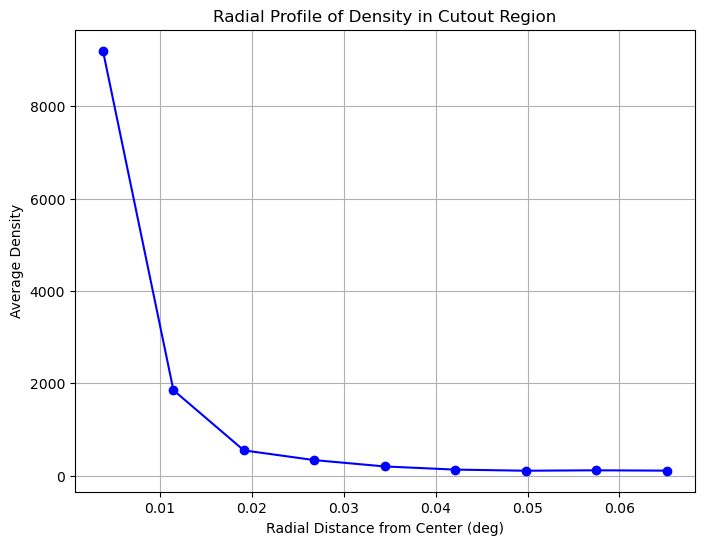

In [199]:
import numpy as np
import matplotlib.pyplot as plt

# Define the center of the square region and its size
RA_center = 100.4
DEC_center = 9.75
cutout_size = 0.05  # ±0.05 degrees around the center for square cutout

# Combine the RA and DEC data
ra_combined = np.concatenate([ra_filtered, ra_sources])
dec_combined = np.concatenate([dec_filtered, dec_sources])

# Step 1: Apply a square cutout filter around the specified RA/DEC center
cutout_mask = (ra_combined >= (RA_center - cutout_size)) & (ra_combined <= (RA_center + cutout_size)) & \
              (dec_combined >= (DEC_center - cutout_size)) & (dec_combined <= (DEC_center + cutout_size))

# Extract the sources within the cutout region
ra_cutout = ra_combined[cutout_mask]
dec_cutout = dec_combined[cutout_mask]

# Step 2: Check how many sources remain in the cutout region
print(f"Points in the cutout region: {len(ra_cutout)}")

# Step 3: Calculate the radial distance from the center (RA_center, DEC_center)
distances = np.sqrt((ra_cutout - RA_center)**2 + (dec_cutout - DEC_center)**2)

# Step 4: Define radial bins for the radial profile (you can adjust the number of bins as needed)
bins = np.linspace(0, np.max(distances), 10)
bin_centers = (bins[:-1] + bins[1:]) / 2

# Step 5: Compute the average density in each radial bin from the histogram
# Here, we use the `hist` array generated from the 2D histogram for density values
bin_densities = []
for i in range(len(bins) - 1):
    mask_bin = (distances >= bins[i]) & (distances < bins[i + 1])
    if np.sum(mask_bin) > 0:
        # Create a 2D histogram for the cutout data to calculate the density
        hist_cutout, _, _ = np.histogram2d(dec_cutout[mask_bin], ra_cutout[mask_bin], bins=19, density=True)
        bin_density = np.mean(hist_cutout)  # Average density in the radial bin
    else:
        bin_density = 0
    bin_densities.append(bin_density)

# Step 6: Plot the radial profile
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, bin_densities, marker='o', linestyle='-', color='b')
plt.xlabel('Radial Distance from Center (deg)')
plt.ylabel('Average Density')
plt.title('Radial Profile of Density in Cutout Region')
plt.grid(True)
plt.show()



In [200]:
ra_filtered = filtered_TwoMASS['ra'].values  # RA from filtered_TwoMASS
dec_filtered = filtered_TwoMASS['dec'].values  # DEC from filtered_TwoMASS

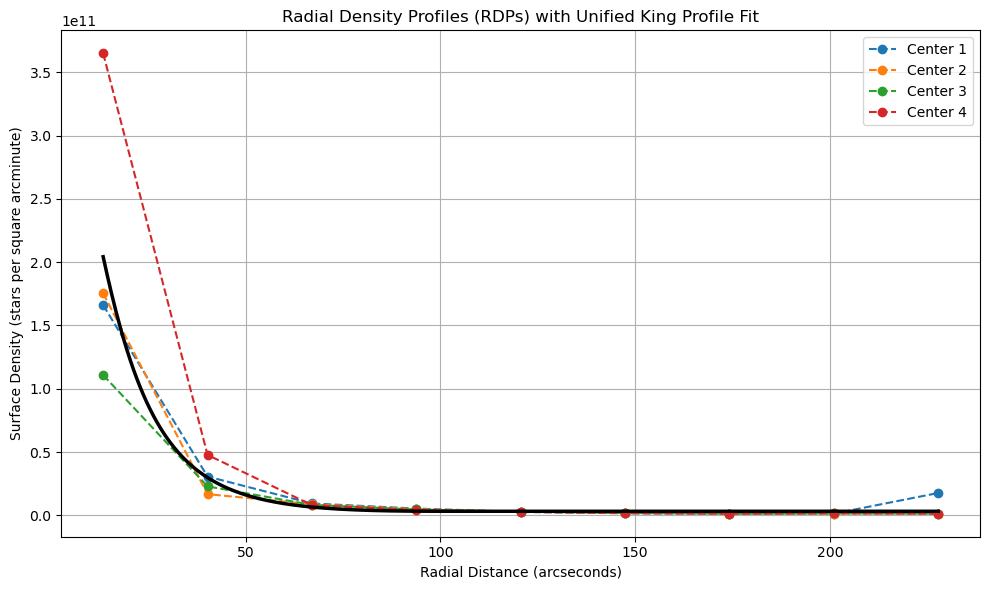

In [201]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Centers for RDPs
centers = [
    (100.45, 9.75),
    (100.3, 9.5),
    (100.23, 9.85),
    (100.25 , 9.56)
]


cutout_size = 0.05  # degrees
nbins = 10  # Number of radial bins
bin_densities_all = []
bin_centers = None  # Will be set during first loop

# Convert to arcsecond-squared densities
arcsec_sq_per_deg_sq = 3600**2

# Combine RA/DEC from both datasets
ra_combined = np.concatenate([ra_filtered, ra_sources])
dec_combined = np.concatenate([dec_filtered, dec_sources])

plt.figure(figsize=(10, 6))

for i, (RA_center, DEC_center) in enumerate(centers):
    # Create mask and cutout
    cutout_mask = (ra_combined >= (RA_center - cutout_size)) & (ra_combined <= (RA_center + cutout_size)) & \
                  (dec_combined >= (DEC_center - cutout_size)) & (dec_combined <= (DEC_center + cutout_size))

    ra_cutout = ra_combined[cutout_mask]
    dec_cutout = dec_combined[cutout_mask]

    # Compute radial distances in arcseconds
    distances_deg = np.sqrt((ra_cutout - RA_center)**2 + (dec_cutout - DEC_center)**2)
    distances_arcsec = distances_deg * 3600

    # Bin distances
    bins = np.linspace(0, np.max(distances_arcsec), nbins)
    if bin_centers is None:
        bin_centers = (bins[:-1] + bins[1:]) / 2

    bin_densities = []
    for j in range(len(bins) - 1):
        mask_bin = (distances_arcsec >= bins[j]) & (distances_arcsec < bins[j + 1])
        if np.sum(mask_bin) > 0:
            hist_cutout, _, _ = np.histogram2d(dec_cutout[mask_bin], ra_cutout[mask_bin], bins=19, density=True)
            bin_density = np.mean(hist_cutout)
        else:
            bin_density = 0
        bin_densities.append(bin_density * arcsec_sq_per_deg_sq)  # convert to stars/arcmin²

    bin_densities_all.append(bin_densities)

    # Plot individual RDP
    plt.plot(bin_centers, bin_densities, marker='o', linestyle='--', label=f'Center {i+1}')

# Average radial densities across all profiles
mean_densities = np.mean(bin_densities_all, axis=0)

# King profile function
def king_profile(R, k, Rc, Rt, c):
    return np.where(R < Rt, k * (1 / np.sqrt(1 + (R/Rc)**2) - 1 / np.sqrt(1 + (Rt/Rc)**2))**2 + c, c)

# Fit King profile to averaged RDP
initial_guess = [np.max(mean_densities), 3.0, 20.0, np.min(mean_densities)]
bounds = ([0, 0, 5, 0], [np.inf, 50, 100, np.inf])

x_vals = np.linspace(np.min(bin_centers), np.max(bin_centers), 1000)
params, covariance = curve_fit(king_profile, bin_centers, mean_densities, p0=initial_guess, bounds=bounds)
k_fit, Rc_fit, Rt_fit, c_fit = params

# Plot King profile fit
plt.plot(x_vals, king_profile(x_vals, *params), color='black', linewidth=2.5)

# Final plot formatting
plt.xlabel('Radial Distance (arcseconds)')
plt.ylabel('Surface Density (stars per square arcminute)')
plt.title('Radial Density Profiles (RDPs) with Unified King Profile Fit')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Print parameters
# print(f"Fitted King Profile Parameters:")
# print(f"k = {k_fit:.2f}")
# print(f"Rc = {Rc_fit:.2f} arcsec")
# print(f"Rt = {Rt_fit:.2f} arcsec")
# print(f"c = {c_fit:.2f} stars/arcmin²")


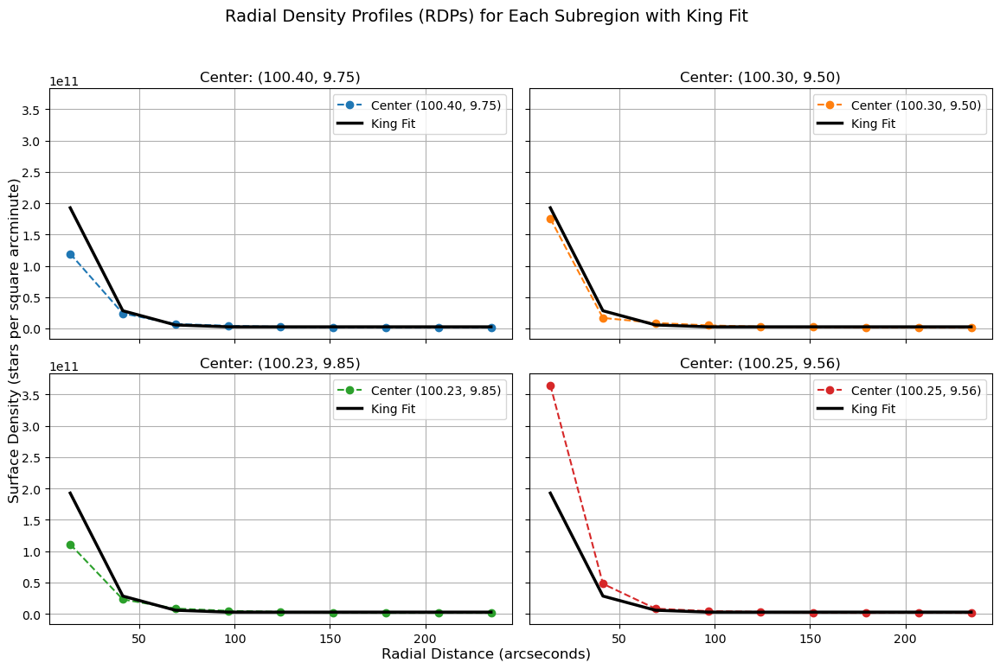

In [202]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Centers for RDPs (RA, DEC)
centers = [
    (100.4, 9.75),
    (100.3, 9.5),
    (100.23, 9.85),
    (100.25, 9.56)
]

cutout_size = 0.05  # degrees (i.e. a 0.1° x 0.1° square around each center)
nbins = 10  # <<<< Change this to increase/decrease how many radial rings you divide the region into

bin_densities_all = []
bin_centers = None  # Set during first loop
arcsec_sq_per_deg_sq = 3600**2  # Convert deg² to arcsec²

# Combine RA/DEC from both datasets
ra_combined = np.concatenate([ra_filtered, ra_sources])
dec_combined = np.concatenate([dec_filtered, dec_sources])

# Prepare plot layout
fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)
axes = axes.flatten()

# Optional: Define unique colors for each subplot
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']

for i, ((RA_center, DEC_center), color) in enumerate(zip(centers, colors)):
    ax = axes[i]

    # Cutout mask
    mask = (ra_combined >= (RA_center - cutout_size)) & (ra_combined <= (RA_center + cutout_size)) & \
           (dec_combined >= (DEC_center - cutout_size)) & (dec_combined <= (DEC_center + cutout_size))

    ra_cut = ra_combined[mask]
    dec_cut = dec_combined[mask]

    # Radial distances (arcsec)
    distances_deg = np.sqrt((ra_cut - RA_center)**2 + (dec_cut - DEC_center)**2)
    distances_arcsec = distances_deg * 3600

    # <<< BINS represent concentric radial rings >>> (from 0 to max radial distance in the cutout)
    bins = np.linspace(0, np.max(distances_arcsec), nbins)
    if bin_centers is None:
        bin_centers = (bins[:-1] + bins[1:]) / 2

    # Count stars in each radial bin
    bin_densities = []
    for j in range(len(bins) - 1):
        mask_bin = (distances_arcsec >= bins[j]) & (distances_arcsec < bins[j + 1])
        if np.sum(mask_bin) > 0:
            hist2d, _, _ = np.histogram2d(dec_cut[mask_bin], ra_cut[mask_bin], bins=19, density=True)
            density = np.mean(hist2d)
        else:
            density = 0
        bin_densities.append(density * arcsec_sq_per_deg_sq)  # Convert to stars / arcmin²

    bin_densities_all.append(bin_densities)

    # Plot this RDP
    ax.plot(bin_centers, bin_densities, marker='o', linestyle='--', color=color,
            label=f'Center ({RA_center:.2f}, {DEC_center:.2f})')
    ax.set_title(f'Center: ({RA_center:.2f}, {DEC_center:.2f})')
    ax.grid(True)
    ax.legend()

# Fit to average profile
mean_densities = np.mean(bin_densities_all, axis=0)

# King model function
def king_profile(R, k, Rc, Rt, c):
    return np.where(R < Rt, k * (1 / np.sqrt(1 + (R / Rc)**2) - 1 / np.sqrt(1 + (Rt / Rc)**2))**2 + c, c)

# Fit King profile
initial_guess = [np.max(mean_densities), 3.0, 20.0, np.min(mean_densities)]
bounds = ([0, 0, 5, 0], [np.inf, 50, 100, np.inf])
params, _ = curve_fit(king_profile, bin_centers, mean_densities, p0=initial_guess, bounds=bounds)

# Overlay same King fit on all subplots
for ax in axes:
    ax.plot(bin_centers, king_profile(bin_centers, *params), color='black', linewidth=2.5, label='King Fit')
    ax.legend()

# Axis labels and title
fig.text(0.5, 0.04, 'Radial Distance (arcseconds)', ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Surface Density (stars per square arcminute)', va='center', rotation='vertical', fontsize=12)
fig.suptitle('Radial Density Profiles (RDPs) for Each Subregion with King Fit', fontsize=14)

plt.tight_layout(rect=[0.04, 0.04, 1, 0.95])
plt.show()



Points in the cutout region: 141


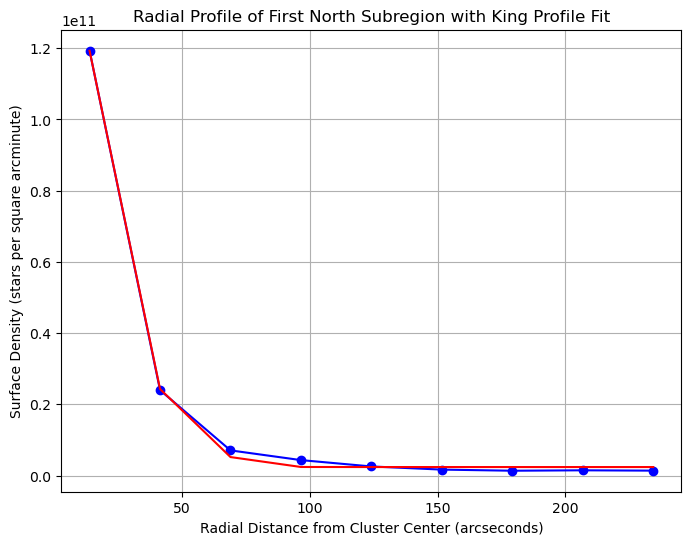

Fitted King Profile Parameters:
k = 291541986225.88
Rc = 24.91
Rt = 100.00
c = 2389470257.69


In [203]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Parameters (already defined by you)
RA_center = 100.4
DEC_center = 9.75
cutout_size = 0.05  # ±0.05 degrees around the center for square cutout

#from contour plot data
ra_combined = np.concatenate([ra_filtered, ra_sources])
dec_combined = np.concatenate([dec_filtered, dec_sources])


cutout_mask = (ra_combined >= (RA_center - cutout_size)) & (ra_combined <= (RA_center + cutout_size)) & \
              (dec_combined >= (DEC_center - cutout_size)) & (dec_combined <= (DEC_center + cutout_size))


ra_cutout = ra_combined[cutout_mask]
dec_cutout = dec_combined[cutout_mask]

print(f"Points in the cutout region: {len(ra_cutout)}")

# Step 3: Calculate the radial distance from the center (RA_center, DEC_center) in degrees
distances_deg = np.sqrt((ra_cutout - RA_center)**2 + (dec_cutout - DEC_center)**2)

# Convert radial distances to arcseconds (1 degree = 3600 arcseconds)
distances_arcsec = distances_deg * 3600

# Step 4: Define radial bins for the radial profile
bins = np.linspace(0, np.max(distances_arcsec), 10)
bin_centers = (bins[:-1] + bins[1:]) / 2

# Step 5: Compute the average density in each radial bin
bin_densities = []
for i in range(len(bins) - 1):
    mask_bin = (distances_arcsec >= bins[i]) & (distances_arcsec < bins[i + 1])
    if np.sum(mask_bin) > 0:
        # Create a 2D histogram for the cutout data to calculate the density
        hist_cutout, _, _ = np.histogram2d(dec_cutout[mask_bin], ra_cutout[mask_bin], bins=19, density=True)
        bin_density = np.mean(hist_cutout)  # Average density in the radial bin
    else:
        bin_density = 0
    bin_densities.append(bin_density)

# Convert bin_densities to stars per square arcminute
bin_densities_sqm = np.array(bin_densities) * 3600**2  # Convert density to stars per arcminute^2

def king_profile(R, k, Rc, Rt, c):
    """King profile equation."""
    return np.where(R < Rt, k * (1 / np.sqrt(1 + (R/Rc)**2) - 1 / np.sqrt(1 + (Rt/Rc)**2))**2 + c, c)

# Step 1: Cutout data and calculate radial distances (same as your original process)
# (Assuming you've already calculated `ra_cutout`, `dec_cutout`, and `distances_arcsec`)

# Step 2: Radial binning and density calculation (same as your original process)
# Using 20 bins to avoid sparse data in outer regions
bins = np.linspace(0, np.max(distances_arcsec), 10)
bin_centers = (bins[:-1] + bins[1:]) / 2

# Compute the average density in each bin (same as your original approach)
bin_densities = []
for i in range(len(bins) - 1):
    mask_bin = (distances_arcsec >= bins[i]) & (distances_arcsec < bins[i + 1])
    if np.sum(mask_bin) > 0:
        hist_cutout, _, _ = np.histogram2d(dec_cutout[mask_bin], ra_cutout[mask_bin], bins=19, density=True)
        bin_density = np.mean(hist_cutout)  # Average density in the radial bin
    else:
        bin_density = 0
    bin_densities.append(bin_density)

# Convert bin_densities to stars per square arcminute
bin_densities_sqm = np.array(bin_densities) * 3600**2  # Convert density to stars per arcminute^2

# Step 3: Initial guess for King profile parameters
initial_guess = [np.max(bin_densities_sqm), 3.0, 20.0, np.min(bin_densities_sqm)]  # Adjust guesses for smooth curve
bounds = ([0, 0, 5, 0], [np.inf, 50, 100, np.inf])  # Adjusted bounds to allow more flexibility

# Fit the King profile to the radial profile data
params, covariance = curve_fit(king_profile, bin_centers, bin_densities_sqm, p0=initial_guess, bounds=bounds, maxfev=10000)

# Extract the fitted parameters
k_fit, Rc_fit, Rt_fit, c_fit = params

# Plot the radial profile with the King profile fit
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, bin_densities_sqm, marker='o', linestyle='-', color='b', label='Data')
plt.plot(bin_centers, king_profile(bin_centers, *params), color='r', label=f'King Fit: $k={k_fit:.2f}$, $R_c={Rc_fit:.2f}$, $R_t={Rt_fit:.2f}$, $c={c_fit:.2f}$')
plt.xlabel('Radial Distance from Cluster Center (arcseconds)')
plt.ylabel('Surface Density (stars per square arcminute)')
plt.title('Radial Profile of First North Subregion with King Profile Fit')

plt.grid(True)
plt.show()

# Print fitted parameters
print(f"Fitted King Profile Parameters:")
print(f"k = {k_fit:.2f}")
print(f"Rc = {Rc_fit:.2f}")
print(f"Rt = {Rt_fit:.2f}")
print(f"c = {c_fit:.2f}")

Points in the cutout region: 174


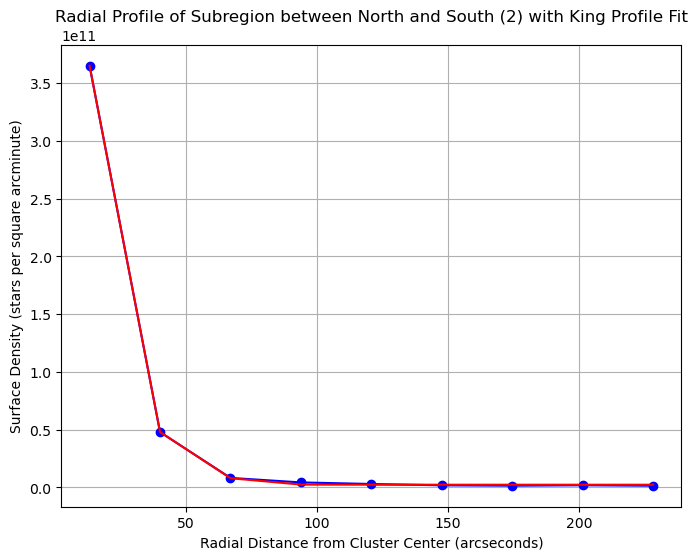

Fitted King Profile Parameters:
k = 961684099012.24
Rc = 16.65
Rt = 100.00
c = 2226956673.90


In [204]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Parameters (already defined by you)
RA_center = 100.25
DEC_center = 9.56
cutout_size = 0.05  # ±0.05 degrees around the center for square cutout



#from contour plot data
ra_combined = np.concatenate([ra_filtered, ra_sources])
dec_combined = np.concatenate([dec_filtered, dec_sources])


cutout_mask = (ra_combined >= (RA_center - cutout_size)) & (ra_combined <= (RA_center + cutout_size)) & \
              (dec_combined >= (DEC_center - cutout_size)) & (dec_combined <= (DEC_center + cutout_size))


ra_cutout = ra_combined[cutout_mask]
dec_cutout = dec_combined[cutout_mask]

print(f"Points in the cutout region: {len(ra_cutout)}")

# Step 3: Calculate the radial distance from the center (RA_center, DEC_center) in degrees
distances_deg = np.sqrt((ra_cutout - RA_center)**2 + (dec_cutout - DEC_center)**2)


distances_arcsec = distances_deg * 3600

# Step 4: Define radial bins for the radial profile
bins = np.linspace(0, np.max(distances_arcsec), 10)
bin_centers = (bins[:-1] + bins[1:]) / 2

# Step 5: Compute the average density in each radial bin
bin_densities = []
for i in range(len(bins) - 1):
    mask_bin = (distances_arcsec >= bins[i]) & (distances_arcsec < bins[i + 1])
    if np.sum(mask_bin) > 0:
        # Create a 2D histogram for the cutout data to calculate the density
        hist_cutout, _, _ = np.histogram2d(dec_cutout[mask_bin], ra_cutout[mask_bin], bins=19, density=True)
        bin_density = np.mean(hist_cutout)  # Average density in the radial bin
    else:
        bin_density = 0
    bin_densities.append(bin_density)

# Convert bin_densities to stars per square arcminute
bin_densities_sqm = np.array(bin_densities) * 3600**2  # Convert density to stars per arcminute^2

def king_profile(R, k, Rc, Rt, c):
    """King profile equation."""
    return np.where(R < Rt, k * (1 / np.sqrt(1 + (R/Rc)**2) - 1 / np.sqrt(1 + (Rt/Rc)**2))**2 + c, c)

# Step 1: Cutout data and calculate radial distances (same as your original process)
# (Assuming you've already calculated `ra_cutout`, `dec_cutout`, and `distances_arcsec`)

# Step 2: Radial binning and density calculation (same as your original process)
# Using 20 bins to avoid sparse data in outer regions
bins = np.linspace(0, np.max(distances_arcsec), 10)
bin_centers = (bins[:-1] + bins[1:]) / 2

# Compute the average density in each bin (same as your original approach)
bin_densities = []
for i in range(len(bins) - 1):
    mask_bin = (distances_arcsec >= bins[i]) & (distances_arcsec < bins[i + 1])
    if np.sum(mask_bin) > 0:
        hist_cutout, _, _ = np.histogram2d(dec_cutout[mask_bin], ra_cutout[mask_bin], bins=19, density=True)
        bin_density = np.mean(hist_cutout)  # Average density in the radial bin
    else:
        bin_density = 0
    bin_densities.append(bin_density)

# Convert bin_densities to stars per square arcminute
bin_densities_sqm = np.array(bin_densities) * 3600**2  # Convert density to stars per arcminute^2

# Step 3: Initial guess for King profile parameters
initial_guess = [np.max(bin_densities_sqm), 3.0, 20.0, np.min(bin_densities_sqm)]  # Adjust guesses for smooth curve
bounds = ([0, 0, 5, 0], [np.inf, 50, 100, np.inf])  # Adjusted bounds to allow more flexibility

# Fit the King profile to the radial profile data
params, covariance = curve_fit(king_profile, bin_centers, bin_densities_sqm, p0=initial_guess, bounds=bounds, maxfev=10000)

# Extract the fitted parameters
k_fit, Rc_fit, Rt_fit, c_fit = params

# Plot the radial profile with the King profile fit
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, bin_densities_sqm, marker='o', linestyle='-', color='b', label='Data')
plt.plot(bin_centers, king_profile(bin_centers, *params), color='r', label=f'King Fit: $k={k_fit:.2f}$, $R_c={Rc_fit:.2f}$, $R_t={Rt_fit:.2f}$, $c={c_fit:.2f}$')
plt.xlabel('Radial Distance from Cluster Center (arcseconds)')
plt.ylabel('Surface Density (stars per square arcminute)')
plt.title('Radial Profile of Subregion between North and South (2) with King Profile Fit')

plt.grid(True)
plt.show()

# Print fitted parameters
print(f"Fitted King Profile Parameters:")
print(f"k = {k_fit:.2f}")
print(f"Rc = {Rc_fit:.2f}")
print(f"Rt = {Rt_fit:.2f}")
print(f"c = {c_fit:.2f}")

Points in the cutout region: 172


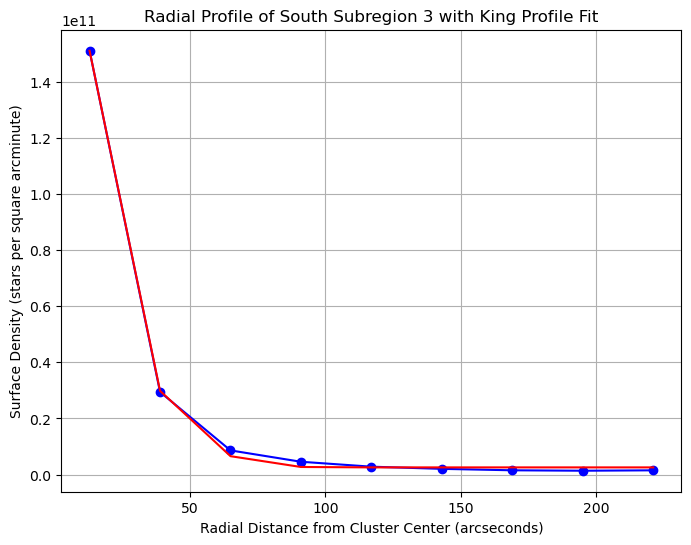

Fitted King Profile Parameters:
k = 355624805080.05
Rc = 22.06
Rt = 100.00
c = 2537512318.67


In [205]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Parameters (already defined by you)
RA_center = 100.2
DEC_center = 9.89
cutout_size = 0.05  # ±0.05 degrees around the center for square cutout

#from contour plot data
ra_combined = np.concatenate([ra_filtered, ra_sources])
dec_combined = np.concatenate([dec_filtered, dec_sources])


cutout_mask = (ra_combined >= (RA_center - cutout_size)) & (ra_combined <= (RA_center + cutout_size)) & \
              (dec_combined >= (DEC_center - cutout_size)) & (dec_combined <= (DEC_center + cutout_size))


ra_cutout = ra_combined[cutout_mask]
dec_cutout = dec_combined[cutout_mask]

print(f"Points in the cutout region: {len(ra_cutout)}")

# Step 3: Calculate the radial distance from the center (RA_center, DEC_center) in degrees
distances_deg = np.sqrt((ra_cutout - RA_center)**2 + (dec_cutout - DEC_center)**2)

# Convert radial distances to arcseconds (1 degree = 3600 arcseconds)
distances_arcsec = distances_deg * 3600

# Step 4: Define radial bins for the radial profile
bins = np.linspace(0, np.max(distances_arcsec), 10)
bin_centers = (bins[:-1] + bins[1:]) / 2

# Step 5: Compute the average density in each radial bin
bin_densities = []
for i in range(len(bins) - 1):
    mask_bin = (distances_arcsec >= bins[i]) & (distances_arcsec < bins[i + 1])
    if np.sum(mask_bin) > 0:
        # Create a 2D histogram for the cutout data to calculate the density
        hist_cutout, _, _ = np.histogram2d(dec_cutout[mask_bin], ra_cutout[mask_bin], bins=19, density=True)
        bin_density = np.mean(hist_cutout)  # Average density in the radial bin
    else:
        bin_density = 0
    bin_densities.append(bin_density)

# Convert bin_densities to stars per square arcminute
bin_densities_sqm = np.array(bin_densities) * 3600**2  # Convert density to stars per arcminute^2

def king_profile(R, k, Rc, Rt, c):
    """King profile equation."""
    return np.where(R < Rt, k * (1 / np.sqrt(1 + (R/Rc)**2) - 1 / np.sqrt(1 + (Rt/Rc)**2))**2 + c, c)

# Step 1: Cutout data and calculate radial distances (same as your original process)
# (Assuming you've already calculated `ra_cutout`, `dec_cutout`, and `distances_arcsec`)

# Step 2: Radial binning and density calculation (same as your original process)
# Using 20 bins to avoid sparse data in outer regions
bins = np.linspace(0, np.max(distances_arcsec), 10)
bin_centers = (bins[:-1] + bins[1:]) / 2

# Compute the average density in each bin (same as your original approach)
bin_densities = []
for i in range(len(bins) - 1):
    mask_bin = (distances_arcsec >= bins[i]) & (distances_arcsec < bins[i + 1])
    if np.sum(mask_bin) > 0:
        hist_cutout, _, _ = np.histogram2d(dec_cutout[mask_bin], ra_cutout[mask_bin], bins=19, density=True)
        bin_density = np.mean(hist_cutout)  # Average density in the radial bin
    else:
        bin_density = 0
    bin_densities.append(bin_density)

# Convert bin_densities to stars per square arcminute
bin_densities_sqm = np.array(bin_densities) * 3600**2  # Convert density to stars per arcminute^2

# Step 3: Initial guess for King profile parameters
initial_guess = [np.max(bin_densities_sqm), 3.0, 20.0, np.min(bin_densities_sqm)]  # Adjust guesses for smooth curve
bounds = ([0, 0, 5, 0], [np.inf, 50, 100, np.inf])  # Adjusted bounds to allow more flexibility

# Fit the King profile to the radial profile data
params, covariance = curve_fit(king_profile, bin_centers, bin_densities_sqm, p0=initial_guess, bounds=bounds, maxfev=10000)

# Extract the fitted parameters
k_fit, Rc_fit, Rt_fit, c_fit = params

# Plot the radial profile with the King profile fit
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, bin_densities_sqm, marker='o', linestyle='-', color='b', label='Data')
plt.plot(bin_centers, king_profile(bin_centers, *params), color='r', label=f'King Fit: $k={k_fit:.2f}$, $R_c={Rc_fit:.2f}$, $R_t={Rt_fit:.2f}$, $c={c_fit:.2f}$')
plt.xlabel('Radial Distance from Cluster Center (arcseconds)')
plt.ylabel('Surface Density (stars per square arcminute)')
plt.title('Radial Profile of South Subregion 3 with King Profile Fit')

plt.grid(True)
plt.show()

# Print fitted parameters
print(f"Fitted King Profile Parameters:")
print(f"k = {k_fit:.2f}")
print(f"Rc = {Rc_fit:.2f}")
print(f"Rt = {Rt_fit:.2f}")
print(f"c = {c_fit:.2f}")

Points in the cutout region: 148


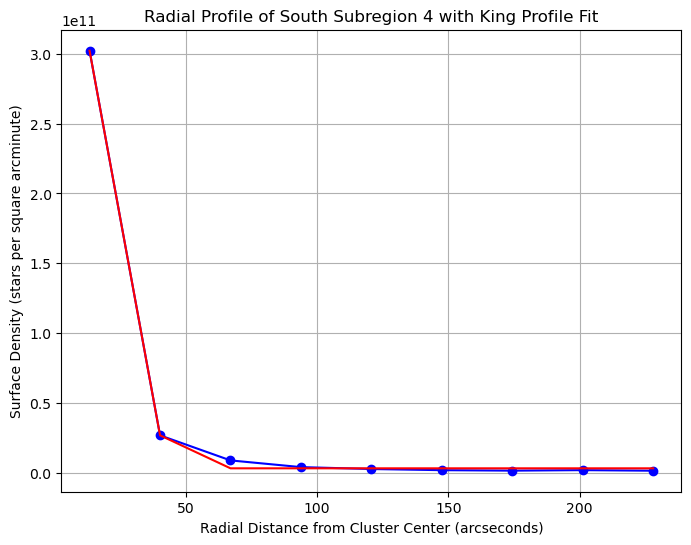

Fitted King Profile Parameters:
k = 1115189560153.52
Rc = 22.27
Rt = 61.85
c = 3162986340.44


In [206]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Parameters (already defined by you)
RA_center = 100.1
DEC_center = 9.81
cutout_size = 0.05  # ±0.05 degrees around the center for square cutout

#from contour plot data
ra_combined = np.concatenate([ra_filtered, ra_sources])
dec_combined = np.concatenate([dec_filtered, dec_sources])


cutout_mask = (ra_combined >= (RA_center - cutout_size)) & (ra_combined <= (RA_center + cutout_size)) & \
              (dec_combined >= (DEC_center - cutout_size)) & (dec_combined <= (DEC_center + cutout_size))


ra_cutout = ra_combined[cutout_mask]
dec_cutout = dec_combined[cutout_mask]

print(f"Points in the cutout region: {len(ra_cutout)}")

# Step 3: Calculate the radial distance from the center (RA_center, DEC_center) in degrees
distances_deg = np.sqrt((ra_cutout - RA_center)**2 + (dec_cutout - DEC_center)**2)

# Convert radial distances to arcseconds (1 degree = 3600 arcseconds)
distances_arcsec = distances_deg * 3600

# Step 4: Define radial bins for the radial profile
bins = np.linspace(0, np.max(distances_arcsec), 10)
bin_centers = (bins[:-1] + bins[1:]) / 2

# Step 5: Compute the average density in each radial bin
bin_densities = []
for i in range(len(bins) - 1):
    mask_bin = (distances_arcsec >= bins[i]) & (distances_arcsec < bins[i + 1])
    if np.sum(mask_bin) > 0:
        # Create a 2D histogram for the cutout data to calculate the density
        hist_cutout, _, _ = np.histogram2d(dec_cutout[mask_bin], ra_cutout[mask_bin], bins=19, density=True)
        bin_density = np.mean(hist_cutout)  # Average density in the radial bin
    else:
        bin_density = 0
    bin_densities.append(bin_density)

# Convert bin_densities to stars per square arcminute
bin_densities_sqm = np.array(bin_densities) * 3600**2  # Convert density to stars per arcminute^2

def king_profile(R, k, Rc, Rt, c):
    """King profile equation."""
    return np.where(R < Rt, k * (1 / np.sqrt(1 + (R/Rc)**2) - 1 / np.sqrt(1 + (Rt/Rc)**2))**2 + c, c)

# Step 1: Cutout data and calculate radial distances (same as your original process)
# (Assuming you've already calculated `ra_cutout`, `dec_cutout`, and `distances_arcsec`)

# Step 2: Radial binning and density calculation (same as your original process)
# Using 20 bins to avoid sparse data in outer regions
bins = np.linspace(0, np.max(distances_arcsec), 10)
bin_centers = (bins[:-1] + bins[1:]) / 2

# Compute the average density in each bin (same as your original approach)
bin_densities = []
for i in range(len(bins) - 1):
    mask_bin = (distances_arcsec >= bins[i]) & (distances_arcsec < bins[i + 1])
    if np.sum(mask_bin) > 0:
        hist_cutout, _, _ = np.histogram2d(dec_cutout[mask_bin], ra_cutout[mask_bin], bins=19, density=True)
        bin_density = np.mean(hist_cutout)  # Average density in the radial bin
    else:
        bin_density = 0
    bin_densities.append(bin_density)

# Convert bin_densities to stars per square arcminute
bin_densities_sqm = np.array(bin_densities) * 3600**2  # Convert density to stars per arcminute^2

# Step 3: Initial guess for King profile parameters
initial_guess = [np.max(bin_densities_sqm), 3.0, 20.0, np.min(bin_densities_sqm)]  # Adjust guesses for smooth curve
bounds = ([0, 0, 5, 0], [np.inf, 50, 100, np.inf])  # Adjusted bounds to allow more flexibility

# Fit the King profile to the radial profile data
params, covariance = curve_fit(king_profile, bin_centers, bin_densities_sqm, p0=initial_guess, bounds=bounds, maxfev=10000)

# Extract the fitted parameters
k_fit, Rc_fit, Rt_fit, c_fit = params

# Plot the radial profile with the King profile fit
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, bin_densities_sqm, marker='o', linestyle='-', color='b', label='Data')
plt.plot(bin_centers, king_profile(bin_centers, *params), color='r', label=f'King Fit: $k={k_fit:.2f}$, $R_c={Rc_fit:.2f}$, $R_t={Rt_fit:.2f}$, $c={c_fit:.2f}$')
plt.xlabel('Radial Distance from Cluster Center (arcseconds)')
plt.ylabel('Surface Density (stars per square arcminute)')
plt.title('Radial Profile of South Subregion 4 with King Profile Fit')

plt.grid(True)
plt.show()

# Print fitted parameters
print(f"Fitted King Profile Parameters:")
print(f"k = {k_fit:.2f}")
print(f"Rc = {Rc_fit:.2f}")
print(f"Rt = {Rt_fit:.2f}")
print(f"c = {c_fit:.2f}")

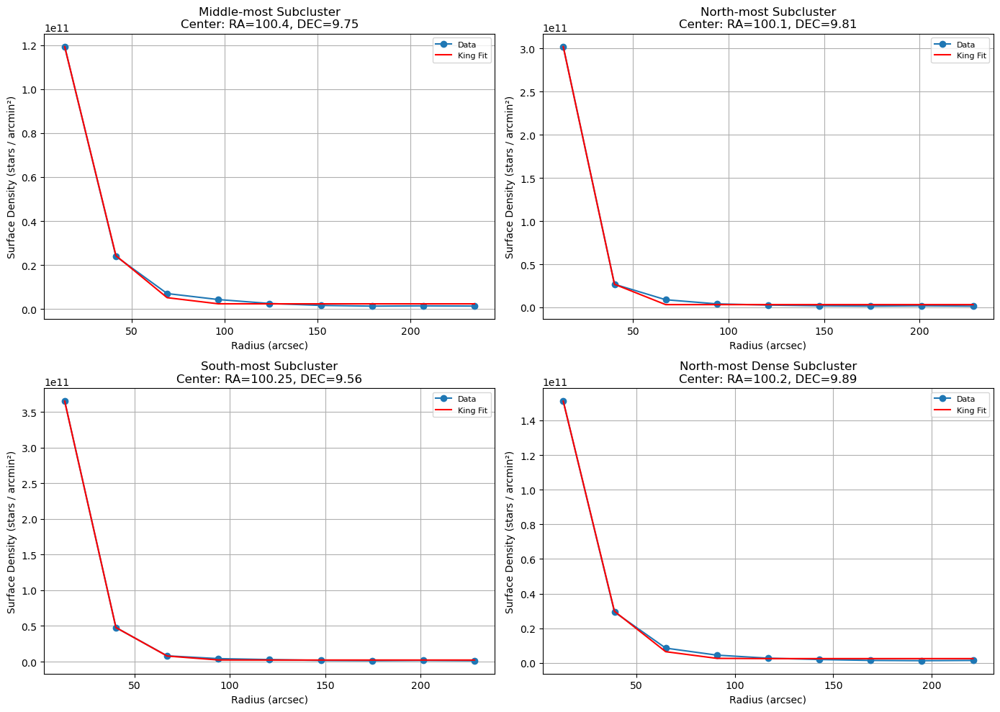

In [207]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define the King profile function
def king_profile(R, k, Rc, Rt, c):
    return np.where(R < Rt, k * (1 / np.sqrt(1 + (R/Rc)**2) - 1 / np.sqrt(1 + (Rt/Rc)**2))**2 + c, c)

# Define the subregions (RA, DEC, Title)
subregions = [
    (100.4, 9.75, "Middle-most Subcluster"),
    (100.1, 9.81, "North-most Subcluster"),
    (100.25, 9.56, "South-most Subcluster"),
    (100.2, 9.89, "North-most Dense Subcluster")
]


# Reuse combined RA/DEC from contour data
ra_combined = np.concatenate([ra_filtered, ra_sources])
dec_combined = np.concatenate([dec_filtered, dec_sources])

cutout_size = 0.05  # degrees

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for idx, (RA_center, DEC_center, title) in enumerate(subregions):
    # Select data in cutout region
    cutout_mask = (ra_combined >= RA_center - cutout_size) & (ra_combined <= RA_center + cutout_size) & \
                  (dec_combined >= DEC_center - cutout_size) & (dec_combined <= DEC_center + cutout_size)
    
    ra_cutout = ra_combined[cutout_mask]
    dec_cutout = dec_combined[cutout_mask]

    # Compute radial distances in arcseconds
    distances_deg = np.sqrt((ra_cutout - RA_center)**2 + (dec_cutout - DEC_center)**2)
    distances_arcsec = distances_deg * 3600

    # Define radial bins
    bins = np.linspace(0, np.max(distances_arcsec), 10)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    # Compute densities
    bin_densities = []
    for i in range(len(bins) - 1):
        mask_bin = (distances_arcsec >= bins[i]) & (distances_arcsec < bins[i + 1])
        if np.sum(mask_bin) > 0:
            hist_cutout, _, _ = np.histogram2d(dec_cutout[mask_bin], ra_cutout[mask_bin], bins=19, density=True)
            bin_density = np.mean(hist_cutout)
        else:
            bin_density = 0
        bin_densities.append(bin_density)

    # Convert to stars per square arcminute
    bin_densities_sqm = np.array(bin_densities) * 3600**2

    # Fit King profile
    initial_guess = [np.max(bin_densities_sqm), 3.0, 20.0, np.min(bin_densities_sqm)]
    bounds = ([0, 0, 5, 0], [np.inf, 50, 100, np.inf])
    try:
        params, _ = curve_fit(king_profile, bin_centers, bin_densities_sqm, p0=initial_guess, bounds=bounds, maxfev=10000)
        k_fit, Rc_fit, Rt_fit, c_fit = params
        fit_label = f"King Fit"
    except RuntimeError:
        params = None
        fit_label = "Fit failed"

    # Plot
    ax = axes[idx]
    ax.plot(bin_centers, bin_densities_sqm, marker='o', linestyle='-', label='Data')
    if params is not None:
        ax.plot(bin_centers, king_profile(bin_centers, *params), color='r', label=fit_label)
    ax.set_title(f"{title}\nCenter: RA={RA_center}, DEC={DEC_center}")
    ax.set_xlabel('Radius (arcsec)')
    ax.set_ylabel('Surface Density (stars / arcmin²)')
    ax.grid(True)
    ax.legend(fontsize=8)

plt.tight_layout()
plt.show()


/var/folders/ct/3p6ngzhj6xbcrqtyd_rkdsn00000gn/T/ipykernel_10615/1975898197.py:40: RuntimeWarning: divide by zero encountered in power
  return a * radius ** b


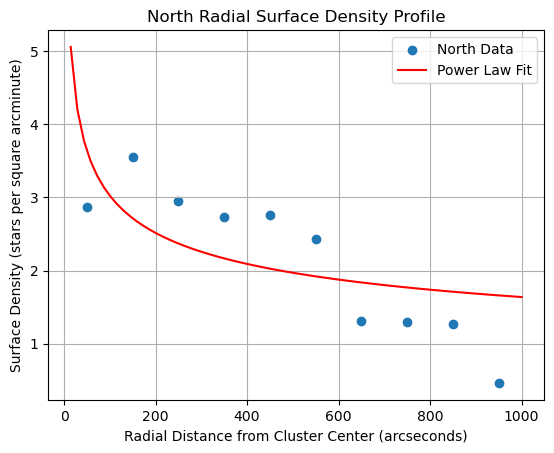

In [208]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
 ##NORTH### circular annuli not elliptical
    
    

cluster_center = (100.22, 9.8)  

# Step 1: Extract RA and Dec columns from gaia1 (and remove NaNs if necessary)
x = df_cleaningN['ra'].dropna()  
y = df_cleaningN['dec'].dropna()  

# Step 2: Convert RA and Dec to arcseconds
# Convert RA to arcseconds using the formula: RA in arcseconds = (RA difference) * (3600 * cos(Dec))
x_arcsec = (x - cluster_center[0]) * 3600 * np.cos(np.deg2rad(y))  # RA in arcseconds
y_arcsec = (y - cluster_center[1]) * 3600  # Dec in arcseconds (no cos factor for Dec)

# Step 3: Compute distances from the cluster center in arcseconds
distances = np.sqrt(x_arcsec**2 + y_arcsec**2)

# Step 4: Define concentric rings with increasing radii (in arcseconds)
radius_bins = np.arange(0, np.ceil(np.max(distances)) + 1, 100)  

# Step 5: Initialize array to store surface density values
surface_density = np.zeros(len(radius_bins) - 1)

# Step 6: Count stars within each ring and compute surface density
for i in range(len(surface_density)):
    stars_in_ring = (distances >= radius_bins[i]) & (distances < radius_bins[i+1])
    num_stars_in_ring = np.sum(stars_in_ring)
    ring_area = np.pi * ((radius_bins[i+1])**2 - (radius_bins[i])**2)  # Area of the ring in arcseconds^2
    surface_density[i] = num_stars_in_ring / ring_area if num_stars_in_ring > 0 else 0

# Step 7: Convert surface density from stars per square arcsecond to stars per square arcminute
surface_density_arcmin = surface_density * 3600  # Convert to arcminutes^2

# Step 8: Fit a power law to the data
def power_law(radius, a, b):
    return a * radius ** b

# Fit the power law to the observed surface density data
popt, pcov = curve_fit(power_law, (radius_bins[:-1] + radius_bins[1:]) / 2, surface_density_arcmin)

# Step 9: Generate the power law curve using the optimized parameters
radius_fit = np.linspace(min(radius_bins), max(radius_bins), 70)
surface_density_fit_arcmin = power_law(radius_fit, *popt)

# Step 10: Plot the surface density profile and the fitted power law
plt.scatter((radius_bins[:-1] + radius_bins[1:]) / 2, surface_density_arcmin, label='North Data')
plt.plot(radius_fit, surface_density_fit_arcmin, color='red', label='Power Law Fit')

plt.xlabel('Radial Distance from Cluster Center (arcseconds)')
plt.ylabel('Surface Density (stars per square arcminute)')

plt.title('North Radial Surface Density Profile')
plt.legend()
plt.grid(True)

plt.show()

/var/folders/ct/3p6ngzhj6xbcrqtyd_rkdsn00000gn/T/ipykernel_10615/2404559362.py:40: RuntimeWarning: divide by zero encountered in power
  return a * radius ** b


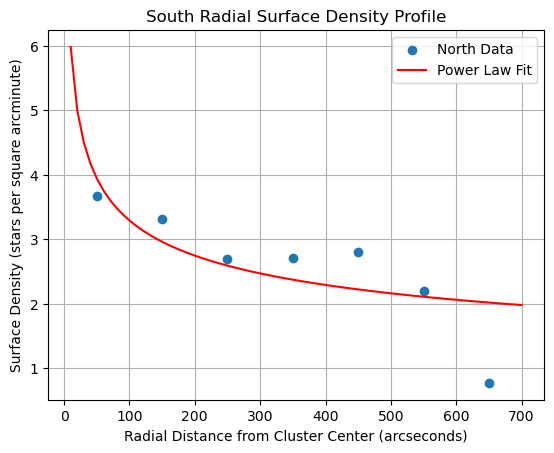

In [209]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
 ##NORTH### circular annuli not elliptical
    
    

cluster_center = (100.27, 9.50)  

# Step 1: Extract RA and Dec columns from gaia1 (and remove NaNs if necessary)
x = df_cleaningS['ra'].dropna()  
y = df_cleaningS['dec'].dropna()  

# Step 2: Convert RA and Dec to arcseconds
# Convert RA to arcseconds using the formula: RA in arcseconds = (RA difference) * (3600 * cos(Dec))
x_arcsec = (x - cluster_center[0]) * 3600 * np.cos(np.deg2rad(y))  # RA in arcseconds
y_arcsec = (y - cluster_center[1]) * 3600  # Dec in arcseconds (no cos factor for Dec)

# Step 3: Compute distances from the cluster center in arcseconds
distances = np.sqrt(x_arcsec**2 + y_arcsec**2)

# Step 4: Define concentric rings with increasing radii (in arcseconds)
radius_bins = np.arange(0, np.ceil(np.max(distances)) + 1, 100)  

# Step 5: Initialize array to store surface density values
surface_density = np.zeros(len(radius_bins) - 1)

# Step 6: Count stars within each ring and compute surface density
for i in range(len(surface_density)):
    stars_in_ring = (distances >= radius_bins[i]) & (distances < radius_bins[i+1])
    num_stars_in_ring = np.sum(stars_in_ring)
    ring_area = np.pi * ((radius_bins[i+1])**2 - (radius_bins[i])**2)  # Area of the ring in arcseconds^2
    surface_density[i] = num_stars_in_ring / ring_area if num_stars_in_ring > 0 else 0

# Step 7: Convert surface density from stars per square arcsecond to stars per square arcminute
surface_density_arcmin = surface_density * 3600  # Convert to arcminutes^2

# Step 8: Fit a power law to the data
def power_law(radius, a, b):
    return a * radius ** b

# Fit the power law to the observed surface density data
popt, pcov = curve_fit(power_law, (radius_bins[:-1] + radius_bins[1:]) / 2, surface_density_arcmin)

# Step 9: Generate the power law curve using the optimized parameters
radius_fit = np.linspace(min(radius_bins), max(radius_bins), 70)
surface_density_fit_arcmin = power_law(radius_fit, *popt)

# Step 10: Plot the surface density profile and the fitted power law
plt.scatter((radius_bins[:-1] + radius_bins[1:]) / 2, surface_density_arcmin, label='North Data')
plt.plot(radius_fit, surface_density_fit_arcmin, color='red', label='Power Law Fit')

plt.xlabel('Radial Distance from Cluster Center (arcseconds)')
plt.ylabel('Surface Density (stars per square arcminute)')

plt.title('South Radial Surface Density Profile')
plt.legend()
plt.grid(True)

plt.show()

## **Density Plots**

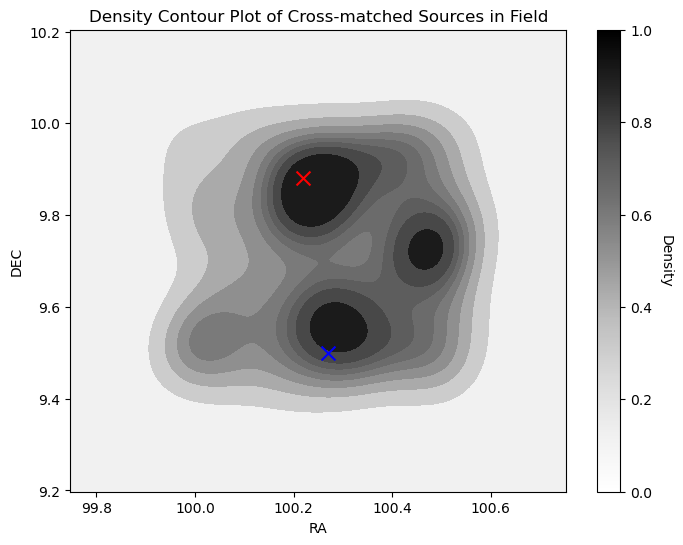

In [210]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors


ra = filtered_TwoMASS['ra'].values
dec = filtered_TwoMASS['dec'].values

plt.figure(figsize=(8, 6))

sns.kdeplot(x=ra, y=dec, cmap='Greys', fill=True, thresh=0, levels=10)

norm = mcolors.Normalize(vmin=0, vmax=1)  #ensures that the color bar’s range matches the density range.
sm = plt.cm.ScalarMappable(cmap='Greys', norm=norm)
sm.set_array([]) 

cbar = plt.colorbar(sm, ax=plt.gca(), orientation='vertical')
cbar.set_label('Density', rotation=270, labelpad=15)

#The density is calculated by dividing the plot into bins (or regions) and counting how many data 
#points fall into each bin. If many points fall into a specific bin,
#that area will have a high density. If fewer points fall into a bin, it will have a low density.

#######
plt.scatter(100.22, 9.88, color='red', label="North Point", marker='x', s=100)  # Red 'x' for North
plt.scatter(100.27, 9.5, color='blue', label="South Point", marker='x', s=100)  # Blue 'x' for South

plt.xlabel('RA')
plt.ylabel('DEC')
plt.title('Density Contour Plot of Cross-matched Sources in Field')


plt.show()

#density = probability density per square degree (relative densities, good for seeing structure)


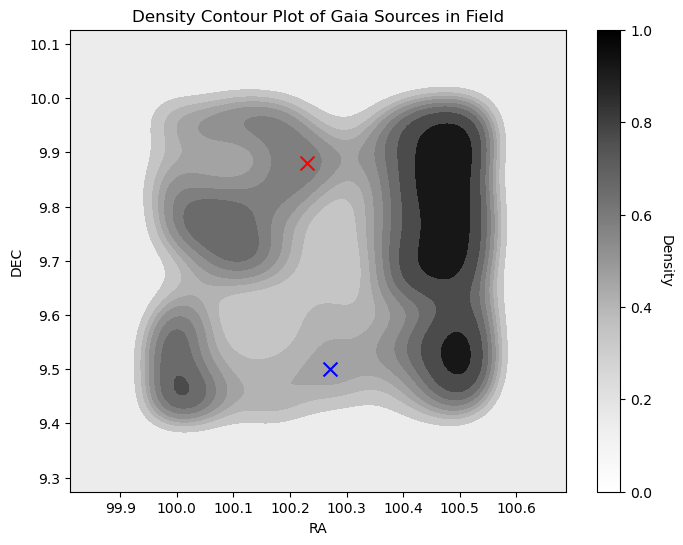

In [211]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from matplotlib import cm
import matplotlib.colors as mcolors

ra = df_cleaning['ra'].values
dec = df_cleaning['dec'].values


plt.figure(figsize=(8, 6))

sns.kdeplot(x=ra, y=dec, cmap='Greys', fill=True, thresh=0, levels=10)

norm = mcolors.Normalize(vmin=0, vmax=1)  #ensures that the color bar’s range matches the density range.
sm = plt.cm.ScalarMappable(cmap='Greys', norm=norm)
sm.set_array([]) 

cbar = plt.colorbar(sm, ax=plt.gca(), orientation='vertical')
cbar.set_label('Density', rotation=270, labelpad=15)

plt.scatter(100.23, 9.88, color='red', label="North Point", marker='x', s=100)  # Red 'x' for North
plt.scatter(100.27, 9.5, color='blue', label="South Point", marker='x', s=100)  # Blue 'x' for South


plt.xlabel('RA')
plt.ylabel('DEC')
plt.title('Density Contour Plot of Gaia Sources in Field')


plt.show()


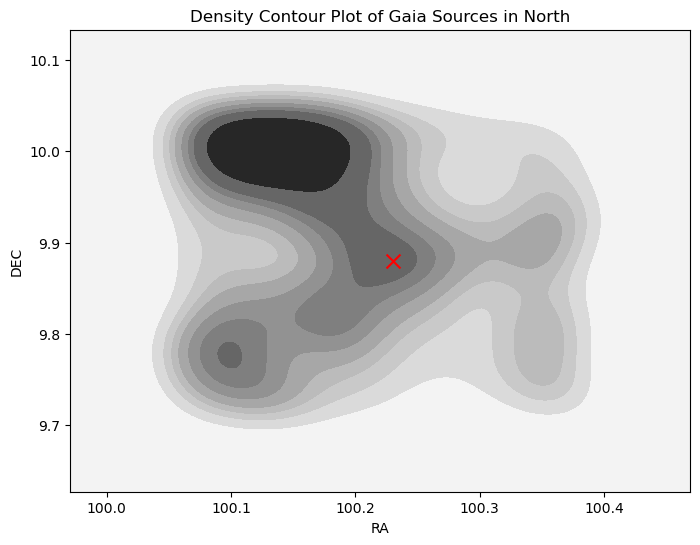

In [212]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde


ra = df_cleaningN['ra'].values
dec = df_cleaningN['dec'].values


plt.figure(figsize=(8, 6))


sns.kdeplot(x=ra, y=dec, cmap='Greys', fill=True, thresh=0, levels=10)
plt.scatter(100.23, 9.88, color='red', label="North Point", marker='x', s=100)  # Red 'x' for North




plt.xlabel('RA')
plt.ylabel('DEC')
plt.title('Density Contour Plot of Gaia Sources in North')


plt.show()


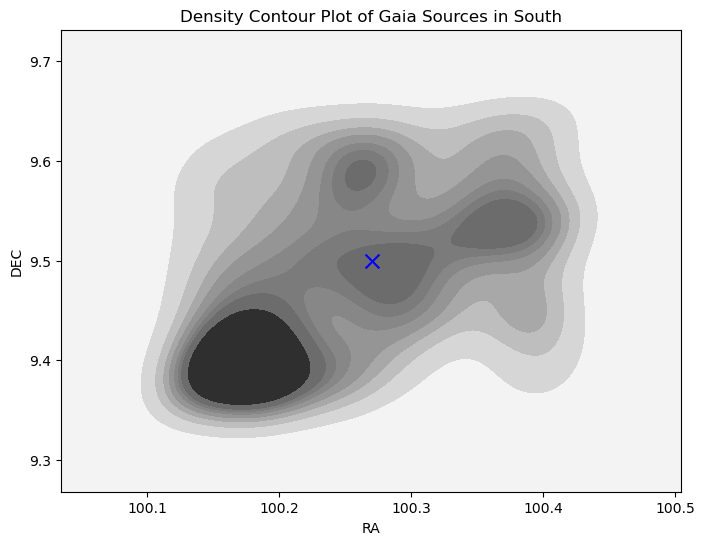

In [213]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde


ra = df_cleaningS['ra'].values
dec = df_cleaningS['dec'].values

plt.figure(figsize=(8, 6))


sns.kdeplot(x=ra, y=dec, cmap='Greys', fill=True, thresh=0, levels=10)
plt.scatter(100.27, 9.5, color='blue', label="South Point", marker='x', s=100)  # Blue 'x' for South



plt.xlabel('RA')
plt.ylabel('DEC')
plt.title('Density Contour Plot of Gaia Sources in South')


plt.show()

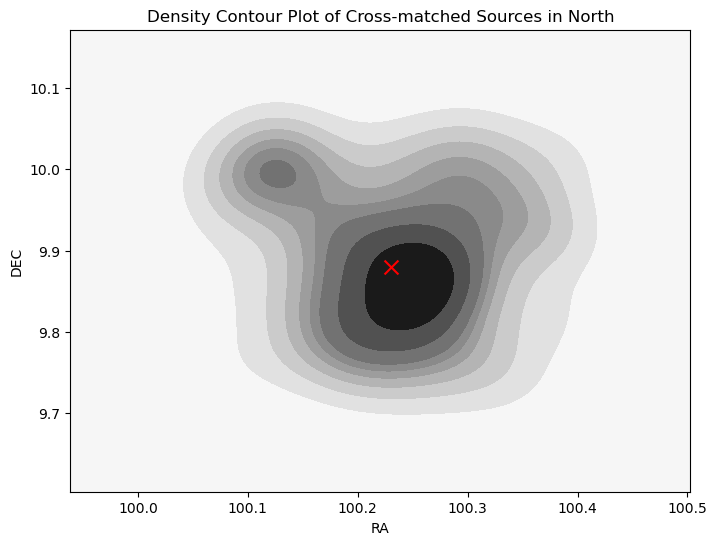

In [214]:
ra = filtered_TwoMASSN['ra'].values
dec = filtered_TwoMASSN['dec'].values

plt.figure(figsize=(8, 6))

sns.kdeplot(x=ra, y=dec, cmap='Greys', fill=True, thresh=0, levels=10)
plt.scatter(100.23, 9.88, color='red', label="North Point", marker='x', s=100)  # Red 'x' for North

plt.xlabel('RA')
plt.ylabel('DEC')
plt.title('Density Contour Plot of Cross-matched Sources in North')


plt.show()

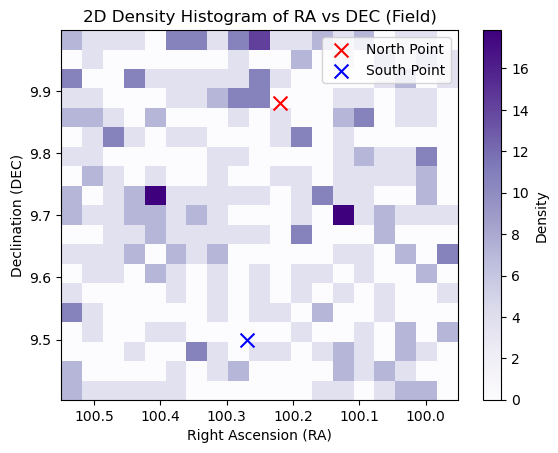

In [215]:
## import numpy as np
import matplotlib.pyplot as plt

x = filtered_TwoMASS['ra']  # Right Ascension (RA)
y = filtered_TwoMASS['dec']  # Declination (DEC)

# Create 2D histogram
hist, xedges, yedges = np.histogram2d(y, x, bins=19, density=True)  # match edges length

# Plot the heatmap
plt.imshow(hist.T, origin='lower',
           extent=[min(x), max(x), min(y), max(y)],  # Set correct RA/DEC axes
           aspect='auto', interpolation='nearest', cmap='Purples')

plt.colorbar(label='Density')  # Show colorbar
plt.scatter(100.22, 9.88, color='red', label="North Point", marker='x', s=100)  # North
plt.scatter(100.27, 9.5, color='blue', label="South Point", marker='x', s=100)  # South

plt.xlabel('Right Ascension (RA)')
plt.ylabel('Declination (DEC)')
plt.title('2D Density Histogram of RA vs DEC (Field)')
plt.legend()

plt.gca().invert_xaxis()
plt.show()

#density =  probability per unit area of finding a star in that bin, this is precise compared to the contour plots


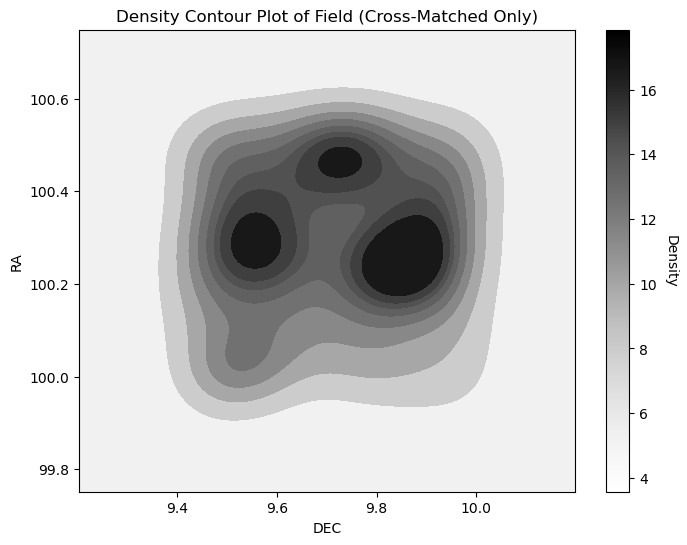

In [216]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Create 2D histogram
hist, xedges, yedges = np.histogram2d(filtered_TwoMASS['dec'], filtered_TwoMASS['ra'], bins=19, density=True)

# Create the grid for contour plotting
x_centers = (xedges[:-1] + xedges[1:]) / 2  # x (RA) center values
y_centers = (yedges[:-1] + yedges[1:]) / 2  # y (DEC) center values

# Flatten the hist data to match the grid
X, Y = np.meshgrid(x_centers, y_centers)

# Flatten Z (density) values
Z = hist.T.flatten()  # Transpose the histogram to match the grid

# Mask out zero densities (optional)
mask = Z > 0  # Mask out zero density values
X = X.flatten()[mask]
Y = Y.flatten()[mask]
Z = Z[mask]

# Plot using sns.kdeplot style with contour
plt.figure(figsize=(8, 6))

# Generate the contour plot using sns.kdeplot
sns.kdeplot(x=X, y=Y, weights=Z, cmap='Greys', fill=True, thresh=0, levels=10)


# Normalize and create the colorbar (now with Greys colormap)
norm = mcolors.Normalize(vmin=min(Z), vmax=max(Z))  # Normalize based on Z values
sm = plt.cm.ScalarMappable(cmap='Greys', norm=norm)  # Use 'Greys' for both the plot and the colorbar
sm.set_array([])

# Colorbar for density
cbar = plt.colorbar(sm, ax=plt.gca(), orientation='vertical')
cbar.set_label('Density', rotation=270, labelpad=15)

# Labels and title
plt.xlabel('DEC')
plt.ylabel('RA')
plt.title('Density Contour Plot of Field (Cross-Matched Only)')

plt.show()


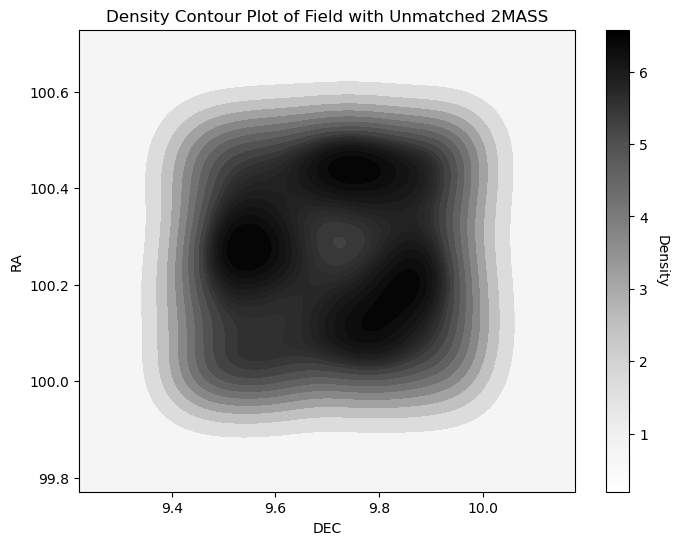

In [217]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Get ra and dec values from both datasets
ra_filtered = filtered_TwoMASS['ra'].values  # RA from filtered_TwoMASS
dec_filtered = filtered_TwoMASS['dec'].values  # DEC from filtered_TwoMASS

ra_sources = did_not_match['ra'].values  # RA from did_not_match
dec_sources = did_not_match['dec'].values  # DEC from did_not_match

# Combine the RA and DEC values from both datasets
ra_combined = np.concatenate([ra_filtered, ra_sources])
dec_combined = np.concatenate([dec_filtered, dec_sources])

# Create 2D histogram for the combined dataset
hist, xedges, yedges = np.histogram2d(dec_combined, ra_combined, bins=19, density=True)

# Create the grid for contour plotting
x_centers = (xedges[:-1] + xedges[1:]) / 2  # x (RA) center values
y_centers = (yedges[:-1] + yedges[1:]) / 2  # y (DEC) center values

# Flatten the hist data to match the grid
X, Y = np.meshgrid(x_centers, y_centers)

# Flatten Z (density) values
Z = hist.T.flatten()  # Transpose the histogram to match the grid

# Mask out zero densities (optional)
mask = Z > 0  # Mask out zero density values
X = X.flatten()[mask]
Y = Y.flatten()[mask]
Z = Z[mask]

# Plot using sns.kdeplot style with contour
plt.figure(figsize=(8, 6))

# Generate the contour plot using sns.kdeplot with the combined data (filtered_TwoMASS + did_not_match)
sns.kdeplot(x=X, y=Y, weights=Z, cmap='Greys', fill=True, thresh=0, levels=20)  # Ensure 12 levels here

# Normalize and create the colorbar (now with Greys colormap)
norm = mcolors.Normalize(vmin=Z.min(), vmax=Z.max())  # Normalize based on Z values
sm = plt.cm.ScalarMappable(cmap='Greys', norm=norm)  # Use 'Greys' for both the plot and the colorbar
sm.set_array([])

# Colorbar for density
cbar = plt.colorbar(sm, ax=plt.gca(), orientation='vertical')
cbar.set_label('Density', rotation=270, labelpad=15)

# Labels and title
plt.xlabel('DEC')
plt.ylabel('RA')
plt.title('Density Contour Plot of Field with Unmatched 2MASS')

plt.show()



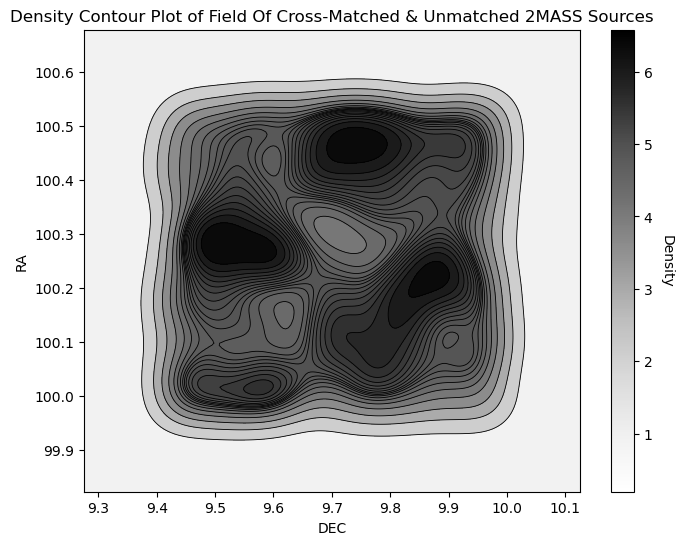

In [218]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Get the raw RA/DEC values from both sources
ra_combined = np.concatenate([filtered_TwoMASS['ra'].values, did_not_match['ra'].values])
dec_combined = np.concatenate([filtered_TwoMASS['dec'].values, did_not_match['dec'].values])

plt.figure(figsize=(8, 6))

# Filled contours
sns.kdeplot(
    x=dec_combined, y=ra_combined,  # NOTE: X = DEC, Y = RA due to axis label preference
    cmap='Greys',
    fill=True,
    thresh=0,
    levels=20
)

# Overlaid contour outlines
sns.kdeplot(
    x=dec_combined, y=ra_combined,
    color='black',
    fill=False,
    thresh=0,
    levels=20,
    linewidths=0.6
)

cbar = plt.colorbar(sm, ax=plt.gca(), orientation='vertical')
cbar.set_label('Density', rotation=270, labelpad=15)


# Add colorbar manually (optional, KDE doesn't give direct values)
# If desired, use a proxy artist or switch to `contourf` for real colorbar values.

plt.xlabel('DEC')
plt.ylabel('RA')
plt.title('Density Contour Plot of Field Of Cross-Matched & Unmatched 2MASS Sources')

plt.show()


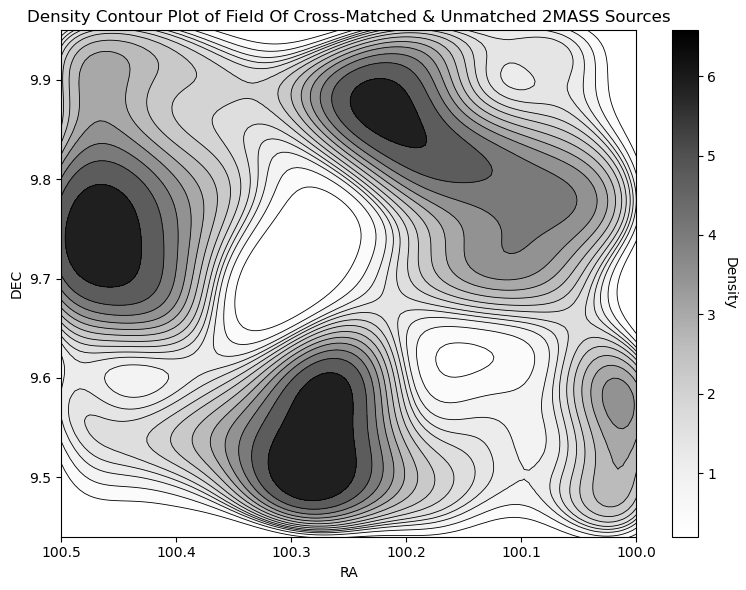

In [219]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


ra_combined = np.concatenate([filtered_TwoMASS['ra'].values, did_not_match['ra'].values])
dec_combined = np.concatenate([filtered_TwoMASS['dec'].values, did_not_match['dec'].values])

# Quick dry run to extract default levels
fig, ax = plt.subplots()
test_plot = sns.kdeplot(
    x=ra_combined, y=dec_combined,
    fill=True,
    levels=20
)
# Extract the default normalized contour levels (0 to 1)
default_levels = test_plot.collections[0].get_array()
plt.close(fig)

levels = np.linspace(0, 1, 20)[6:]  # skip the first 3 lowest levels


plt.figure(figsize=(8, 6))


sns.kdeplot(
    x=ra_combined, y=dec_combined,
    cmap='Greys',
    fill=True,
    thresh=0,
    levels=levels
)

# Contour outlines (trimmed)
sns.kdeplot(
    x=ra_combined, y=dec_combined,
    color='black',
    fill=False,
    thresh=0,
    levels=levels,
    linewidths=0.6
)

cbar = plt.colorbar(sm, ax=plt.gca(), orientation='vertical')
cbar.set_label('Density', rotation=270, labelpad=15)


#plt.scatter(ra_combined, dec_combined, color='red', s=1, alpha=0.5, label='Stars')
plt.gca().invert_xaxis()
plt.xlabel('RA')
plt.xlim(100.5, 100)
plt.ylim(9.44, 9.95)

plt.ylabel('DEC')
plt.title('Density Contour Plot of Field Of Cross-Matched & Unmatched 2MASS Sources')
plt.tight_layout()
plt.show()


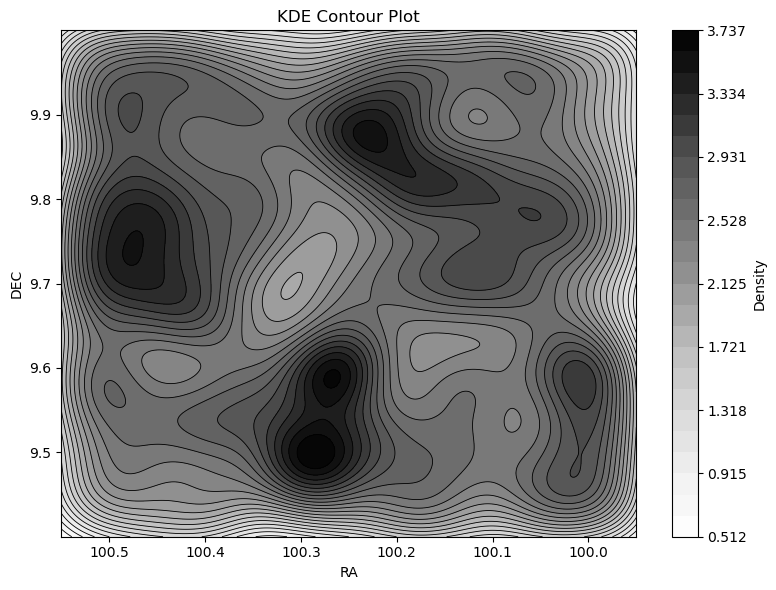

In [220]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

ra_combined = np.concatenate([filtered_TwoMASS['ra'].values, did_not_match['ra'].values])
dec_combined = np.concatenate([filtered_TwoMASS['dec'].values, did_not_match['dec'].values])


xy = np.vstack([ra_combined, dec_combined])
kde = gaussian_kde(xy, bw_method=0.2)

# Create grid for evaluation
xgrid = np.linspace(ra_combined.min(), ra_combined.max(), 500)
ygrid = np.linspace(dec_combined.min(), dec_combined.max(), 500)
#generates 500 equally spaced points between the minimum and maximum of your RA values.
X, Y = np.meshgrid(xgrid, ygrid)
positions = np.vstack([X.ravel(), Y.ravel()])

# Evaluate KDE on grid
Z = kde(positions).reshape(X.shape)

 #min and max density values
z_min, z_max = Z.min(), Z.max()
levels = np.linspace(z_min, z_max, 25)  # Adjust number of contours here

plt.figure(figsize=(8, 6))


contourf = plt.contourf(X, Y, Z, levels=levels, cmap='Greys')


contour = plt.contour(X, Y, Z, levels=levels, colors='black', linewidths=0.6)


plt.colorbar(contourf, label='Density')


plt.xlabel("RA")
plt.ylabel("DEC")
plt.title("KDE Contour Plot")
plt.tight_layout()
plt.gca().invert_xaxis()
plt.show()

# bw_method sets the bandwidth of the kernel — basically,
# how “wide” each point spreads out when calculating the density.

# In KDE, the density at a point is a weighted sum of kernels centered at your data points. 
# The bandwidth determines the spread of each kernel.
# Mathematically, the kernel function is usually Gaussian.


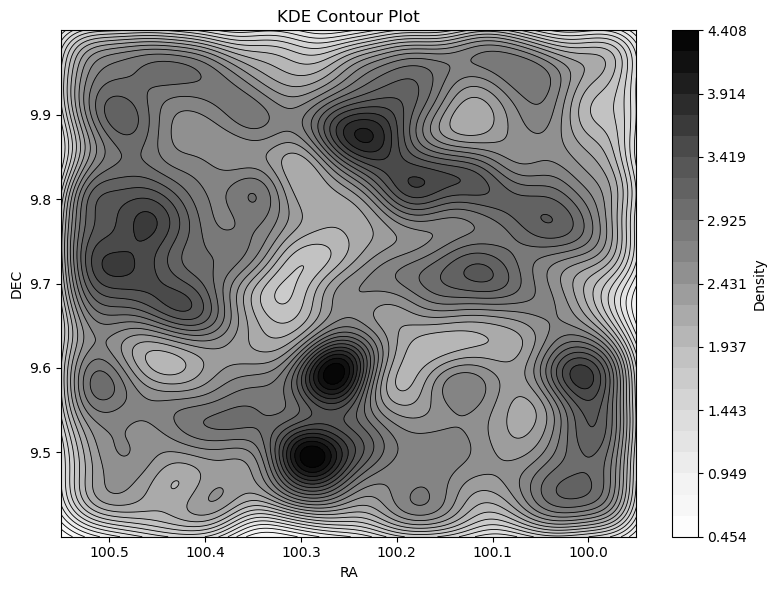

In [240]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

ra_combined = np.concatenate([filtered_TwoMASS['ra'].values, did_not_match['ra'].values])
dec_combined = np.concatenate([filtered_TwoMASS['dec'].values, did_not_match['dec'].values])


xy = np.vstack([ra_combined, dec_combined])
kde = gaussian_kde(xy, bw_method=0.15)

# Create grid for evaluation
xgrid = np.linspace(ra_combined.min(), ra_combined.max(), 900)
ygrid = np.linspace(dec_combined.min(), dec_combined.max(), 900)
#generates 500 equally spaced points between the minimum and maximum of your RA values.
X, Y = np.meshgrid(xgrid, ygrid)
positions = np.vstack([X.ravel(), Y.ravel()])

# Evaluate KDE on grid
Z = kde(positions).reshape(X.shape)

 #min and max density values
z_min, z_max = Z.min(), Z.max()
levels = np.linspace(z_min, z_max, 25)  # Adjust number of contours here

plt.figure(figsize=(8, 6))


contourf = plt.contourf(X, Y, Z, levels=levels, cmap='Greys')


contour = plt.contour(X, Y, Z, levels=levels, colors='black', linewidths=0.6)


plt.colorbar(contourf, label='Density')


plt.xlabel("RA")
plt.ylabel("DEC")
plt.title("KDE Contour Plot")
plt.tight_layout()
plt.gca().invert_xaxis()
plt.show()

# bw_method sets the bandwidth of the kernel — basically,
# how “wide” each point spreads out when calculating the density.

# In KDE, the density at a point is a weighted sum of kernels centered at your data points. 
# The bandwidth determines the spread of each kernel.
# Mathematically, the kernel function is usually Gaussian.


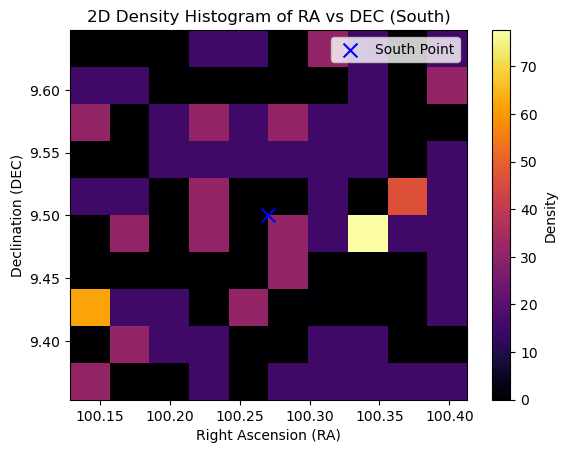

In [222]:
import numpy as np
import matplotlib.pyplot as plt

x = filtered_TwoMASSs['ra']  # Right Ascension (RA)
y = filtered_TwoMASSs['dec']  # Declination (DEC)

# Create 2D histogram
hist, xedges, yedges = np.histogram2d(y, x, bins=10, density=True)  # Flip x and y here

# Plot the heatmap
plt.imshow(hist.T, origin='lower',
           extent=[min(x), max(x), min(y), max(y)],  
           aspect='auto', interpolation='nearest', cmap='inferno')

plt.colorbar(label='Density')  # Show colorbar
plt.scatter(100.27, 9.5, color='blue', label="South Point", marker='x', s=100)  # South

plt.xlabel('Right Ascension (RA)')
plt.ylabel('Declination (DEC)')
plt.title('2D Density Histogram of RA vs DEC (South)')
plt.legend()

plt.show()

#density =  probability per unit area of finding a star in that bin, this is precise compared to the contour plots


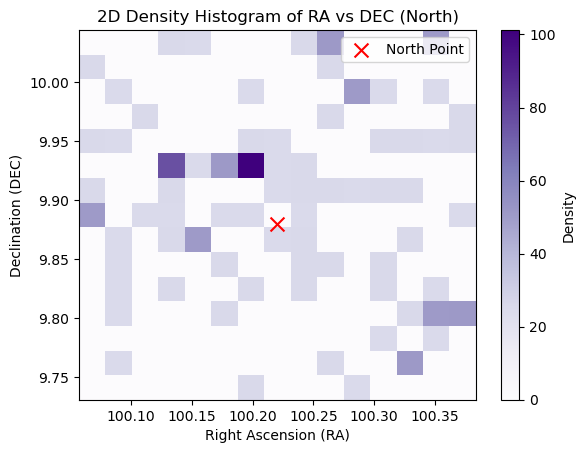

In [223]:
import numpy as np
import matplotlib.pyplot as plt

x = filtered_TwoMASSN['ra']  # Right Ascension (RA)
y = filtered_TwoMASSN['dec']  # Declination (DEC)

# Create 2D histogram
hist, xedges, yedges = np.histogram2d(y, x, bins=15, density=True)  # Flip x and y here

# Plot the heatmap
plt.imshow(hist.T, origin='lower',
           extent=[min(x), max(x), min(y), max(y)],  # Set correct RA/DEC axes
           aspect='auto', interpolation='nearest', cmap='Purples')

plt.colorbar(label='Density')  # Show colorbar
plt.scatter(100.22, 9.88, color='red', label="North Point", marker='x', s=100)  # North


plt.xlabel('Right Ascension (RA)')
plt.ylabel('Declination (DEC)')
plt.title('2D Density Histogram of RA vs DEC (North)')
plt.legend()

plt.show()

#density =  probability per unit area of finding a star in that bin, this is precise compared to the contour plots


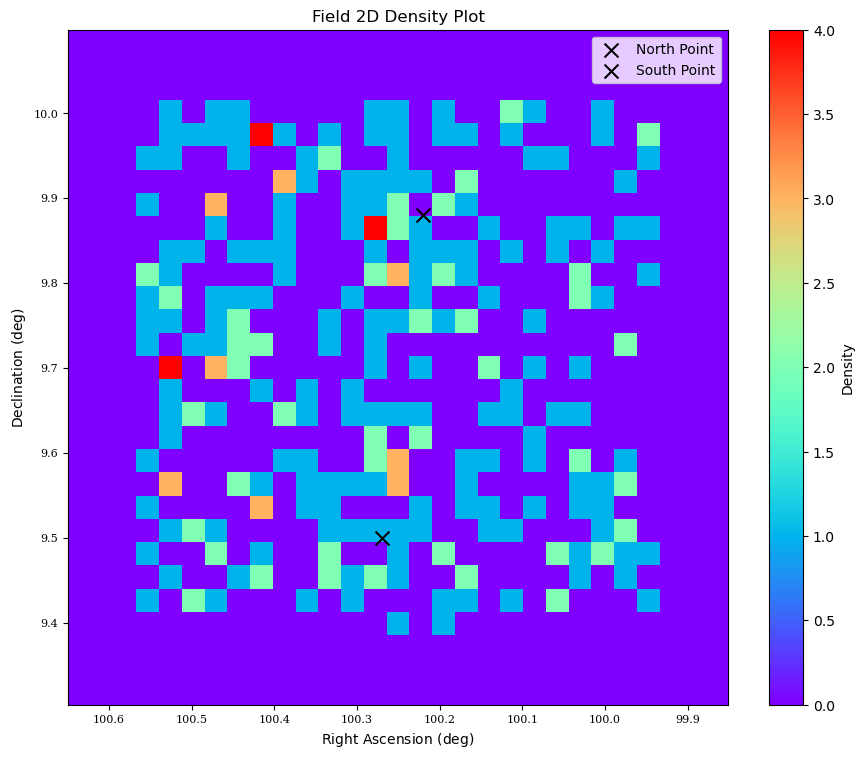

In [224]:
import numpy as np
import matplotlib.pyplot as plt
from numpy import linspace
from astropy.table import Table


x = filtered_TwoMASS['ra'].values  # RA from TwoMASS
y = filtered_TwoMASS['dec'].values  # DEC from TwoMASS

# Extend xlims and ylims to add space around the data (larger background)
xlims = [min(x) - 0.1, max(x) + 0.1]  
ylims = [min(y) - 0.1, max(y) + 0.1]

# Set up your x and y labels
xlabel = '$\mathrm{Right\\ Ascension\\ (deg)}$'
ylabel = '$\mathrm{Declination\\ (deg)}$'

# Define the locations for the axes
left, width = 0.12, 0.75  # Increased width to take more space
bottom, height = 0.12, 0.75  # Increased height to take more space
bottom_h = left_h = left + width + 0.02

# Create the figure with the desired size (Adjusted size to avoid white space at the top)
fig = plt.figure(1, figsize=(11, 9))  # Adjusted figure size to be wider

# Set up the geometry of the plot (main plot)
rect_temperature = [left, bottom, width, height]  # dimensions of main plot

axTemperature = plt.axes(rect_temperature)  # main plot

# Define the number of bins (larger bins)
nxbins = 30  # Reduced number of bins to make them bigger
nybins = 30  # Reduced number of bins to make them bigger

# Create the bins
xbins = linspace(start=xlims[0], stop=xlims[1], num=nxbins)
ybins = linspace(start=ylims[0], stop=ylims[1], num=nybins)
xcenter = (xbins[0:-1] + xbins[1:]) / 2.0
ycenter = (ybins[0:-1] + ybins[1:]) / 2.0

# Generate the 2D histogram
H, xedges, yedges = np.histogram2d(y, x, bins=(ybins, xbins))
X = xcenter
Y = ycenter
Z = H

# Plot the density heatmap
cax = axTemperature.imshow(H, extent=[xlims[0], xlims[1], ylims[0], ylims[1]],
                           interpolation='nearest', origin='lower', aspect='auto',
                           cmap='rainbow')  # Using rainbow colormap for density

# Set up the plot limits (extended background space)
axTemperature.set_xlim(xlims)
axTemperature.set_ylim(ylims)

# Add the color bar to understand the density values
fig.colorbar(cax, ax=axTemperature, orientation='vertical', label='Density')

# Plot the axes labels
axTemperature.set_xlabel(xlabel, fontsize=10)  # Reduced font size
axTemperature.set_ylabel(ylabel, fontsize=10)  # Reduced font size

# Make the tickmarks more detailed (set tick intervals)
axTemperature.xaxis.set_major_locator(plt.MultipleLocator(0.1))  # 0.1 degree interval for RA
axTemperature.yaxis.set_major_locator(plt.MultipleLocator(0.1))  # 0.1 degree interval for DEC

# Make the tickmarks pretty
ticklabels = axTemperature.get_xticklabels()
for label in ticklabels:
    label.set_fontsize(8)  # Smaller font size for ticks
    label.set_family('serif')

ticklabels = axTemperature.get_yticklabels()
for label in ticklabels:
    label.set_fontsize(8)  # Smaller font size for ticks
    label.set_family('serif')

# Add markers for specific points (RA=100.25, DEC=9.88 and RA=100.27, DEC=9.50)
axTemperature.scatter(100.22, 9.88, color='black', label="North Point", marker='x', s=100)  # Red 'x' for North
axTemperature.scatter(100.27, 9.50, color='black', label="South Point", marker='x', s=100)  # Blue 'x' for South

# Add legend for markers
axTemperature.legend()


#plt.tight_layout()

plt.title('Field 2D Density Plot')
plt.gca().invert_xaxis()
plt.draw()
plt.show()




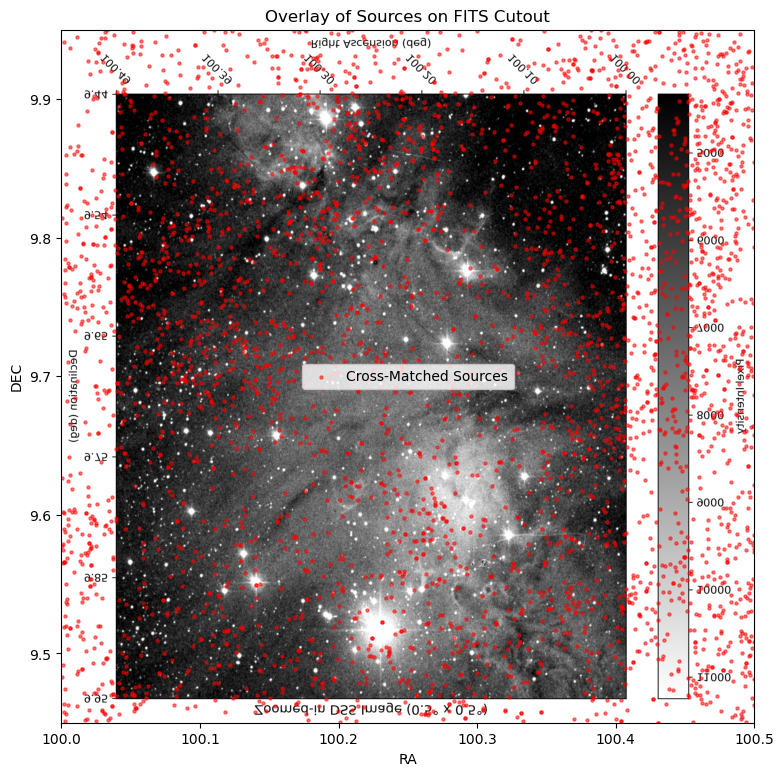

In [225]:
# Filter sources inside image area
ra_min, ra_max = 100.0, 100.5
dec_min, dec_max = 9.45, 9.95

mask_filtered = (
    (ra_combined >= ra_min) & (ra_combined <= ra_max) &
    (dec_combined >= dec_min) & (dec_combined<= dec_max)
)

ra_filtered_cut = ra_combined[mask_filtered]
dec_filtered_cut = dec_combined[mask_filtered]

# Load and show the image
img = plt.imread('zoomed_fits_cutout.png')
plt.figure(figsize=(9, 9))
plt.imshow(img, extent=[ra_min, ra_max, dec_min, dec_max], origin='lower')

# Overlay the sources
plt.scatter(ra_filtered_cut, dec_filtered_cut, s=5, color='red', alpha=0.5, label='Cross-Matched Sources')


plt.xlabel('RA')
plt.ylabel('DEC')
plt.title('Overlay of Sources on FITS Cutout')
plt.legend()
plt.show()


